<a href="https://colab.research.google.com/github/atsuvovor/Pub_Data_Analytics_Project/blob/main/Copy_of_Stock_Portfolio_Analytics_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stock Portfolio Analytics

**Toronto, September 16 2024**  
**Autor : Atsu Vovor**
>Master of Management in Artificial Intelligence,  
>Consultant Data Analytics Specialist | Machine Learning | Data science | Quantitative Analysis |French & English Bilingual  


Abstract
--------
This project presents the development of an advanced stock portfolio analytics tool designed to assist portfolio managers in optimizing investment strategies. By leveraging statistical analysis, mathematical and machine learning techniques, the tool provides insights into stock asset pricing, risk assessment, asset allocation, and performance forecasting. The project outlines the methodology used, including data collection and preprocessing, explanatory datanalysis, model selection and evaluation metrics, stress testing under economic key performance indicators scenarios. Results demonstrate the tool's effectiveness in enhancing decision-making processes, potentially leading to improved portfolio performance. The findings highlight the importance of integrating modern analytics into traditional portfolio management to navigate the complexities of today's financial markets.


Introduction
------------
The growing complexity of financial instruments and risk factors places significant pressure on portfolio managers, who must navigate and analyze a vast and intricate flow of data each day. Utilizing a robust dataset comprising historical stock prices, economic indicators, and financial metrics, our goal is to develop an advanced stock portfolio analysis tool that leverages advanced statistical methods, portfolio optimization and machine learning techniques to assist portfolio managers in making informed decisions. The tool provides insights into the asset pricing, risk assessment, asset allocation, and performance forecasting.

To achieve this goal, we begin by dynamically collecting real time data of all the S&P/TSX composite constituents adjust closed prices and canadian economic factors. The methodology used involves data preprocessing to ensure accuracy and relevance, followed by exploratory data analysis (EDA) to uncover key trends and correlations. Principal Component Analysis (PCA) is applied to reduce the dimensionality of the dataset, enabling the identification of the most influential factors affecting portfolio performance. We then use correlation analysis and hierarchical clustering to categorize stocks into distinct groups, facilitating diversification and risk management.

Moreover, the project explores advenced assets pricing technics sach as Stochastic Differencial Equation and Monte Carlo Simulation combined with modern portfolio theory (MPT) to simulate the portfolio price, profit & lost, risk and construct efficient portfolios, and stress testing techniques to evaluate portfolio robustness under various economic scenarios. The results demonstrate significant improvements in risk-adjusted returns, providing actionable insights for portfolio managers and investors.

In conclusion, this project underscores the importance of integrating advanced analytics into investment decision-making processes. The findings offer a valuable framework for optimizing stock portfolios, enhancing performance, and managing risk in an increasingly complex financial environment.


Description
----------
This Project presents an in-depth analysis of stock portfolio management through the application of advanced data analytics techniques. The project aims to address the challenges faced by investors in optimizing their portfolios by incorporating a data-driven approach to decision-making. By analyzing historical stock prices, financial indicators, and macroeconomic variables, the project seeks to develop strategies that maximize returns while minimizing risk.

**Scope of the Project**  

The scope of this project includes the following key areas:

**1. Data Collection and Preprocessing:**

  - The project begins with the collection of a comprehensive dataset that includes historical stock prices, financial ratios, and relevant economic indicators.
  - Data preprocessing steps are undertaken to clean and prepare the data, ensuring accuracy, consistency, and relevance. This includes handling missing data, normalizing variables, and filtering out noise.  

**2. Exploratory Data Analysis (EDA):**

 - EDA is conducted to uncover underlying trends, correlations, and patterns within the data. This step provides insights into the behavior of individual stocks and the market as a whole, laying the foundation for further analysis.  
 - Visualization techniques are employed to illustrate key findings and to identify potential opportunities for portfolio optimization.  

**3. Dimensionality Reduction and Portfolio Construction using Correlation Analysis, Clustering and Principal Component Analysis (PCA)**

 - **Correlation Analysis, Clustering and Portfolio Construction**
    Hierarchical clustering techniques are applied to group stocks into clusters based on their similarities in performance, risk profile, and other attributes.
    This clustering facilitates the selection of a diversified set of assets for portfolio construction, ensuring that the portfolio is balanced and less susceptible to market shocks.

 - **Principal Component Analysis (PCA)**
    To manage the complexity of the dataset and to focus on the most impactful variables, PCA is utilized to reduce the number of factors considered in the analysis.It  helps in identifying the principal components that explain the majority of the variance in the data, enabling the selection of the most relevant indicators for portfolio construction.

 - **Stacking PCA,Correlation Analysis and Clustering for Diversified Portfolio Construction**
    stacking Correlation Analysis, Clustering and Principal Component Analysis (PCA) helps to construct a well diversified portfolio

**4. Asset Pricing, Profit & Lost simulation and Risk calculation***  

 - Lognormal of asset returns, Covarariance Matrix Cholesky Decomposition applied to Monte Carlo Simulation for asset pricing and Profit & Lost simulation.
 - Value at Risk(VaR) and Conditional Value at Risk(CVaR) calculation

**5. Portfolio Optimization:**

 - Modern Portfolio Theory (MPT) is implemented to construct efficient portfolios that optimize the trade-off between risk and return.
 - The optimization process involves determining the boundary random portfolios assets and weights that maximize the portfolio's expected return for a given level of risk or minimize risk for a given level of expected return or a given risk level.
 - Using Monte Carlo simulation to generate Efficient Frontier
 - Machine Learning technics are used to improve the optimization process by modelling the boundary random portfolios assets that maximize the portfolio's expected return for a given level of risk or minimize risk for a given level of expected return or a given risk level.
 - Investment strategies are bult for optimal portfolios(minimal risk portfolio, maximal return portfolio, sharpe ratio (tangent portfolio)

**6.  Investment Risk Profiles Simulation using K-Means Clustering applied to random portfolio**

 - The simulated portfolio risk is combigned with the simulated the portfolio expected return and the predicted expected return to set the randomn efficient frontier data. The randomn efficient frontier data is then used as input for the  K-means cluster models to simulate the instment risk profile and investment strategy.

**7. Stress Testing and Scenario Analysis:**

 - Stress testing is conducted to evaluate the portfolio's performance under different economic scenarios, including adverse market conditions.
 - This analysis provides insights into the portfolio’s resilience and helps in identifying potential vulnerabilities.  


**Tools and Technologies**  

The project leverages various tools and technologies, including:

 - Python: For data analysis, statistical modeling, and machine learning.
 - Pandas and NumPy: For data manipulation and numerical computations.
 - Matplotlib and Seaborn: For data visualization.
 - Scikit-learn: For machine learning, PCA, and clustering.
 - Optimization Libraries: For portfolio optimization using MPT.
 - Financial Databases: To source historical data, including stock prices and economic indicators.  

**Key Outcomes**
The project yields several key outcomes:

 - Identification of the most influential economic indicators and stock characteristics for portfolio management.
 - Creation of optimized portfolios that demonstrate improved risk-adjusted returns.
 - Insights into portfolio performance under various market conditions, aiding in risk management and strategic planning.


In [1]:
#!pip install stats_can
#!pip install fitter

### Import Libraries

In [2]:
import yfinance as yf
import pandas as pd
from datetime import date, timedelta
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from scipy.stats import norm, lognorm, exponnorm, logistic, erlang,gennorm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
#from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
#from yellowbrick.cluster import KElbowVisualizer
from scipy.optimize import curve_fit
import random
from statistics import NormalDist
from scipy import stats
from fitter import Fitter, get_common_distributions, get_distributions
import matplotlib.transforms as transforms
from matplotlib.table import table
from numpy import arange
from pandas import read_csv
from scipy.optimize import curve_fit
import warnings
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split, cross_val_score
from tabulate import tabulate
from pandas.plotting import lag_plot
import re
#from stats_can import StatsCan as sc
from stats_can import StatsCan
sc = StatsCan()
from scipy.cluster.hierarchy import fcluster

#import pandas_datareader.data as web

/usr/local/lib/python3.10/dist-packages/stats_can/api_class.py:24: FutureWarning: This class will be deprecated in upcoming v3 release. Please see the docs for details
  warn(


### 1. Index Contents Data Collection and Preprocessing

In this section, we will read all the S&P/TSX composite constituents table from wikipedia(https://en.wikipedia.org/wiki/S%26P/TSX_Composite_Index).
Then we will get the tickers adjusted close prices from Yahoo Finance using yfinance library. We will clean the data by removing all the empty
rows and columns. With more than 200 remaining tickers, we will calculate the assets log return and we will remove all the assets with negative expected return. We will couple Correlation Analysis with Principle Component Analysis to reduce the volume of assets and keep only most important assets. The Correlation Analysis will be used to identify and remove redundant assets. The end result will be a well diversify portfolio.


In [3]:

#--------------------------------------------- 1. Index Contents Data Collection and Preprocessing ------------------------------------------------
#read the index content from wikipedia and return the index content data frame
def read_index_content(content_html,web_tab_number):
    S_and_P_TSX_Composite = pd.read_html(content_html)[web_tab_number]
    index_content_df = S_and_P_TSX_Composite[['Ticker','Company','Sector [10]','Industry [10]']]
    index_content_df = index_content_df.rename(columns={"Sector [10]": "Sector", "Industry [10]": "Industry"})
    return index_content_df
    #return S_and_P_TSX_Composite[['Ticker','Company','Sector [10]','Industry [10]']].head()


#extract the index tickers
def generate_ticker_df(index_content_df):
    index_content_tickers_list = index_content_df['Ticker']
    index_content_tickers_list = index_content_tickers_list.tolist()
    new_index_content_tickers_list = []
    for item in index_content_tickers_list:
        new_index_content_tickers_list.append(str(item))
    return new_index_content_tickers_list


#--------------------------------------------------------------------------------------------------------------------
#Description:Extract adj close price for each stock on the index from Yahoo Finance web site and clean the data
#Input:start date, end date, index ticker list
#Return the index Adj close price data frame
#-----------------------------------------------------------------------------------------------------------------------
def start_date(reporting_year_period = 365*5):
    return pd.Timestamp.today() - pd.Timedelta(days = reporting_year_period)

def create_adj_close_price_df(reporting_year_period, content_ticker_list):
    start_date = reporting_year_period
    end_date = date.today()
    selected_assets_yahoo_adj_close_price_data = yf.download(content_ticker_list, start_date, end_date, ['Adj Close'], period ='max')
    selected_assets_adj_close_price_df = selected_assets_yahoo_adj_close_price_data['Adj Close']
    index_adj_close_price_df = selected_assets_adj_close_price_df.dropna(axis=1)
    return index_adj_close_price_df

def asset_daily_price(price_df,number_of_asset):
    print('\nPlotting the first 5 assets daily adj closed prices\n')
    price_df.iloc[:,:number_of_asset].plot(figsize=(15,6))
    plt.show()


In [4]:

print('\nData collection and preprocessing\n')
index_content_df = read_index_content('https://en.wikipedia.org/wiki/S%26P/TSX_Composite_Index',3)
content_ticker_list = generate_ticker_df(index_content_df)
index_adj_close_price_df = create_adj_close_price_df( start_date(365*5), content_ticker_list )
print('\nList of companies\n')
display(index_content_df)
print('\nAdjusted Close Price Data Frame\n')
display(index_adj_close_price_df)
print('\nData structure\n')
index_adj_close_price_df.info()
print('\nData statics summary\n')
display(index_adj_close_price_df.describe().transpose())


Data collection and preprocessing



[*********************100%***********************]  225 of 225 completed
ERROR:yfinance:
105 Failed downloads:
ERROR:yfinance:['MATR', 'FVI', 'REI.UN', 'SRU.UN', 'ATD', 'CJT', 'IFC', 'OLA', 'DFY', 'IMG', 'IFP', 'POU', 'EMA', 'WN', 'IVN', 'CFP', 'RUS', 'DSG', 'TOU', 'SIA', 'LUN', 'GEI', 'DML', 'WPK', 'CU', 'EIF', 'AOI', 'FIL', 'CCL.B', 'RCH', 'BBD.B', 'KXS', 'MTY', 'WTE', 'CPX', 'FFH', 'ALA', 'HWX', 'KEL', 'LNR', 'INE', 'MRU', 'WSP', 'WDO', 'TOY', 'LUG', 'AAV', 'GWO', 'BIR', 'KNT', 'EFN', 'NPI', 'EQB', 'TIH', 'ARX', 'WCP', 'ABX', 'NWC', 'FRU']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (1d 2019-09-18 23:59:05.009912 -> 2024-09-16)')
ERROR:yfinance:['CS', 'ATRL', 'GRT.UN', 'BEI.UN', 'FCR.UN', 'IIP.UN', 'QBR.B', 'GIB.A', 'CRT.UN', 'PMZ.UN', 'AP.UN', 'PKI', 'CPG', 'TECK.B', 'BIP.UN', 'EMP.A', 'DIR.UN', 'TCL.A', 'CSH.UN', 'TA', 'TCN', 'ERF', 'BEP.UN', 'IPCO', 'NWH.UN', 'BBU.UN', 'ONEX', 'HR.UN', 'TSU', 'CCA', 'CNR', 'CTC.A', 'ENGH', 'MTL', 'ACO.X', 'ATH', 'RCI


List of companies



,Ticker,Company,Sector,Industry
0,AAV,Advantage Energy Ltd.,Energy,Oil & Gas Exploration and Production
1,AOI,Africa Oil Corp.,Energy,Oil & Gas Exploration and Production
2,AEM,Agnico Eagle Mines Limited,Basic Materials,Metals & Mining
3,AC,Air Canada,Industrials,Transportation
4,AGI,Alamos Gold Inc.,Basic Materials,Metals & Mining
...,...,...,...,...
220,WTE,Westshore Terminals Investment Corporation,Industrials,Transportation
221,WPM,Wheaton Precious Metals Corp.,Basic Materials,Metals & Mining
222,WCP,Whitecap Resources Inc.,Energy,Oil & Gas Exploration and Production
223,WPK,Winpak Ltd.,Consumer Cyclical,Packaging & Containers



Adjusted Close Price Data Frame



Ticker,AC,AEM,AGI,AQN,ATS,BB,BCE,BHC,BLDP,BLX,...,TPZ,TRI,TRP,TVE,TXG,VET,WCN,WFG,WPM,X
Date,,,,,,,,,,,,,,,,,,,,,
2019-09-19 00:00:00+00:00,35.645519,50.451714,6.111329,10.291792,13.800000,7.57,36.248428,23.150000,5.24,14.113465,...,11.939601,59.698238,37.650688,22.429235,61.119999,14.820881,87.075195,39.590134,25.617973,10.713510
2019-09-20 00:00:00+00:00,34.851460,51.306824,6.206520,10.352692,13.710000,7.54,36.489834,22.860001,5.37,14.070452,...,11.995964,58.991219,38.227428,22.552616,60.500000,15.001517,87.364372,39.590134,25.692997,10.471342
2019-09-23 00:00:00+00:00,34.899876,52.470493,6.330270,10.337466,13.710000,7.51,36.429482,22.559999,5.56,14.034621,...,11.982702,59.194489,38.456646,22.420425,60.330002,15.010117,87.711403,38.624989,26.340012,10.694135
2019-09-24 00:00:00+00:00,34.599686,52.805496,6.387384,10.512549,13.670000,5.81,36.678425,22.020000,5.44,14.063288,...,11.916391,59.530304,38.360527,22.402798,54.299999,14.588629,88.010254,38.803020,26.668205,10.374474
2019-09-25 00:00:00+00:00,34.861137,51.509586,6.054213,10.474485,13.580000,5.57,36.527546,21.790001,5.41,14.242489,...,11.909755,59.839634,38.360527,22.314669,52.759998,14.691853,87.721039,38.803020,25.721127,11.091290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,32.720001,77.760002,18.135992,5.280000,26.260000,2.35,36.080002,6.200000,1.69,31.059999,...,18.049999,168.600006,47.070000,22.520000,21.820000,9.040000,185.000000,87.669998,58.560001,32.820000
2024-09-10 00:00:00+00:00,32.880001,78.910004,18.675280,5.310000,26.340000,2.38,35.299999,6.250000,1.72,30.760000,...,18.049999,171.449997,45.790001,22.480000,21.660000,8.940000,184.679993,87.489998,59.410000,31.219999
2024-09-11 00:00:00+00:00,32.799999,79.099998,18.885000,5.350000,26.510000,2.45,35.189999,6.380000,1.75,29.980000,...,17.940001,172.130005,45.880001,22.520000,22.100000,9.150000,185.389999,86.760002,59.270000,33.389999



Data structure

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1255 entries, 2019-09-19 00:00:00+00:00 to 2024-09-13 00:00:00+00:00
Data columns (total 99 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AC      1255 non-null   float64
 1   AEM     1255 non-null   float64
 2   AGI     1255 non-null   float64
 3   AQN     1255 non-null   float64
 4   ATS     1255 non-null   float64
 5   BB      1255 non-null   float64
 6   BCE     1255 non-null   float64
 7   BHC     1255 non-null   float64
 8   BLDP    1255 non-null   float64
 9   BLX     1255 non-null   float64
 10  BMO     1255 non-null   float64
 11  BN      1255 non-null   float64
 12  BNS     1255 non-null   float64
 13  BTE     1255 non-null   float64
 14  BTO     1255 non-null   float64
 15  BYD     1255 non-null   float64
 16  CAE     1255 non-null   float64
 17  CCO     1255 non-null   float64
 18  CG      1255 non-null   float64
 19  CIGI    1255 non-null   float64
 20  CIX     1

,count,mean,std,min,25%,50%,75%,max
Ticker,,,,,,,,
AC,1255.0,36.502764,3.104166,25.417492,34.362993,36.203373,38.325268,61.728203
AEM,1255.0,53.829203,9.558101,32.276482,47.321718,52.199928,58.680870,83.169998
AGI,1255.0,9.530455,3.251428,3.709501,7.325909,8.332438,11.808640,20.690001
AQN,1255.0,9.877133,2.823692,4.757608,6.718479,10.849073,12.410863,14.397233
ATS,1255.0,28.966757,10.534357,10.000000,17.440001,31.440001,38.180000,48.730000
...,...,...,...,...,...,...,...,...
VET,1255.0,11.499508,5.512764,1.587390,7.000547,11.737050,14.312978,28.071142
WCN,1255.0,124.547215,25.716363,69.163429,99.605270,127.810577,137.965645,186.500000
WFG,1255.0,67.835648,18.781368,14.714416,59.403271,73.551033,80.951000,98.821205


### 2. Exploratory Data Analysis (EDA)

In [5]:
def plot_assets_distribution(df,xlabel, ylabel, title=''):
    # Define the number of assets
    n_assets = df.shape[1]
    # Create subplots
    fig, axes = plt.subplots(1, n_assets, figsize=(23,  3))
    if n_assets == 1:
        axes = [axes]

    # Iterate over each asset
    for i, asset in enumerate(df.columns):
        g =sns.histplot(df[asset], kde=True, ax=axes[i])
        axes[i].set_title(f'{title + asset}')
        axes[i].set_xlabel(xlabel)
        axes[i].set_ylabel(ylabel)

        # Calculate and display statistics
        mean_return = df[asset].mean()
        std_dev = df[asset].std()
        skewness = df[asset].skew()
        kurtosis = df[asset].kurtosis()

         # Add statistics below the plot
        statistics = (f"Mean: {mean_return:.4f}\n"
                 f"Std Dev: {std_dev:.4f}\n"
                  f"Skewness: {skewness:.4f}\n"
                 f"Kurtosis: {kurtosis:.4f}")

        # Place the text under the plot
        axes[i].text(0.3, -0.3, statistics, transform=axes[i].transAxes,
                fontsize=10, verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey"))

def normalize_asset_daily_price(price_df):
    return (price_df / price_df.iloc[0])*100


def plot_normalize_asset_daily_price(p_normalized_asset_daily_price_df,number_of_asset):

    i_normalized_asset_daily_price_df = p_normalized_asset_daily_price_df.iloc[:,:number_of_asset]
    #normalized_asset_daily_price_df = (normalized_asset_daily_price_df / normalized_asset_daily_price_df.iloc[0])*100
    #normalized_asset_cols_size = len(normalized_asset_daily_price_df.columns)
    i_normalized_asset_daily_price_df.plot(figsize = (15, 6))
    #plt.show()
    plot_assets_distribution(i_normalized_asset_daily_price_df, 'Adjusted Close Price','Frequency')

def calculate_stock_price_log_return(index_adj_close_price_df):
    log_returns = np.log(index_adj_close_price_df / index_adj_close_price_df.shift(1))
    log_returns = log_returns.dropna(how = 'all')
    return log_returns

#removing asset with negative expected return
def removing_assets_with_negative_expected_return(log_returns,threshold):
    # Calculate the correlation matrix
    #corr_matrix = expected_returns.corr()
    # Create a list to store uncorrelated assets
    assets_with_positive_expected_return = []
    # Iterate through the correlation matrix
    for asset in log_returns.columns:
        # Check if the asset is uncorrelated with all other assets
        #for other_assets in corr_matrix.columns:
            if log_returns.mean()[asset] > threshold:
                assets_with_positive_expected_return.append(asset)
    assets_with_positive_expected_return_list = list(dict.fromkeys(assets_with_positive_expected_return))
    return assets_with_positive_expected_return_list


def positive_assets_log_returns_df(log_returns_df, positive_assets_list):
    return log_returns_df[positive_assets_list]

def stocks_initial_price(positive_assets_list):
    return index_adj_close_price_df.iloc[0][positive_assets_list]

def generate_asset_volatility(frequency_date_column, log_return_df):
    frequency = frequency_date_column[0].upper()


    assets_volatility_df = log_return_df.rolling(center=False,window= 252).std() * np.sqrt(252)
    for col in list(assets_volatility_df.columns):
        assets_volatility_df = assets_volatility_df.rename(columns={col: col+' Volatility'})

    assets_volatility_df = assets_volatility_df.dropna(axis=0)

    assets_volatility_df[frequency_date_column] = pd.to_datetime(assets_volatility_df.index, format = '%m/%Y')
    assets_volatility_df[frequency_date_column] = assets_volatility_df[frequency_date_column].dt.to_period(frequency)

    assets_volatility_df.set_index(frequency_date_column, inplace=True)
    assets_volatilities = assets_volatility_df.groupby(frequency_date_column).mean()
    #assets_volatilities = round(assets_volatilities,4)
    assets_volatilities = assets_volatilities.dropna(axis=0)
    return assets_volatilities

def plotting_assets_log_returns(df,xlabel, ylabel, title=''):
    # Define the number of assets
    n_assets = df.shape[1]
    # Create subplots
    fig, axes = plt.subplots(1, n_assets, figsize=(20,  3))

    if n_assets == 1:
        axes = [axes]

    for i, column in enumerate(df.columns):
        axes[i].plot(df[column], label=column)
        axes[i].set_title(f'{column}')
        axes[i].set_xlabel(xlabel)
        axes[i].set_ylabel(ylabel)


    # Set common labels
    plt.xlabel(xlabel, fontsize=12)
    #plt.tight_layout()
    #plt.show()


def plotting_assets_volatility(df,xlabel, ylabel, title=''):

    # Define the number of assets
    n_assets = df.shape[1]
    # Create subplots
    fig, axes = plt.subplots(1, n_assets, figsize=(30,  3))

    if n_assets == 1:
        axes = [axes]

    df.index= df.index.to_timestamp()
    #df.index = date.dt.strftime('%Y')
    for i, ticker in enumerate(df.columns):
        axes[i].plot(df.index, df[ticker], label=ticker)
        axes[i].set_title(f'{ticker}')
        axes[i].set_xlabel(xlabel)
        axes[i].set_ylabel(ylabel)

    plt.xlabel(xlabel, fontsize=8)
    plt.tight_layout(pad=0.05, w_pad=0.01, h_pad=1.0)

    #plt.show()



def portfolio_arihtmetics(log_returns,stocks_initial_prices):
    return pd.DataFrame({'mu expected_return':log_returns.mean(),
                         'variance':log_returns.var(),
                         'Sigmas(volatilities)':log_returns.std(),
                         'modifiy shape(Er)/𝝈':log_returns.mean()/log_returns.std(),
                         'initial price': stocks_initial_prices}).transpose()



In [6]:
number_of_asset =5
normalized_asset_daily_price_df = normalize_asset_daily_price(index_adj_close_price_df)
stock_price_log_return = calculate_stock_price_log_return(normalized_asset_daily_price_df)
log_returns = positive_assets_log_returns_df(stock_price_log_return,
                                             removing_assets_with_negative_expected_return(stock_price_log_return,0))
asset_volatility_df = generate_asset_volatility('Quarter', log_returns)
positive_assets_list = removing_assets_with_negative_expected_return(stock_price_log_return,0)
stocks_initial_prices = stocks_initial_price(positive_assets_list)
portfolio_arihtmetics_df = portfolio_arihtmetics(log_returns,stocks_initial_prices).transpose()


<ipython-input-5-82a2c16a7c19>:83: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  assets_volatility_df[frequency_date_column] = assets_volatility_df[frequency_date_column].dt.to_period(frequency)



Exploratory Data Analysis (EDA)


Plotting the first 5 assets daily adj closed prices



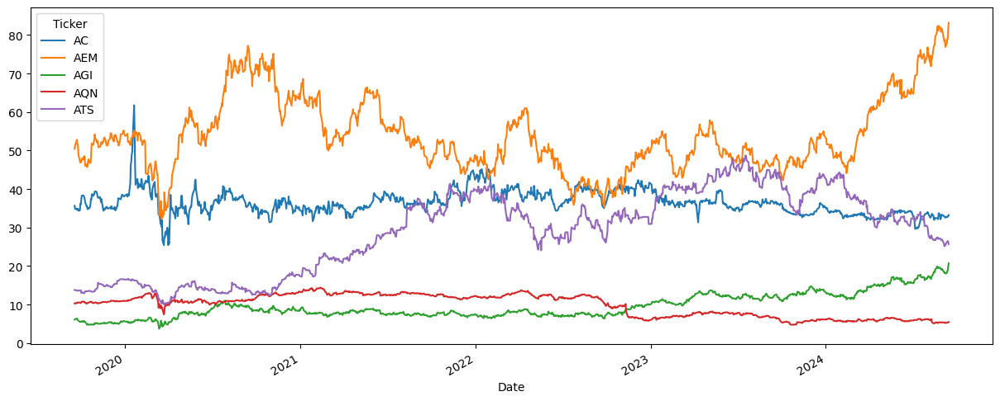

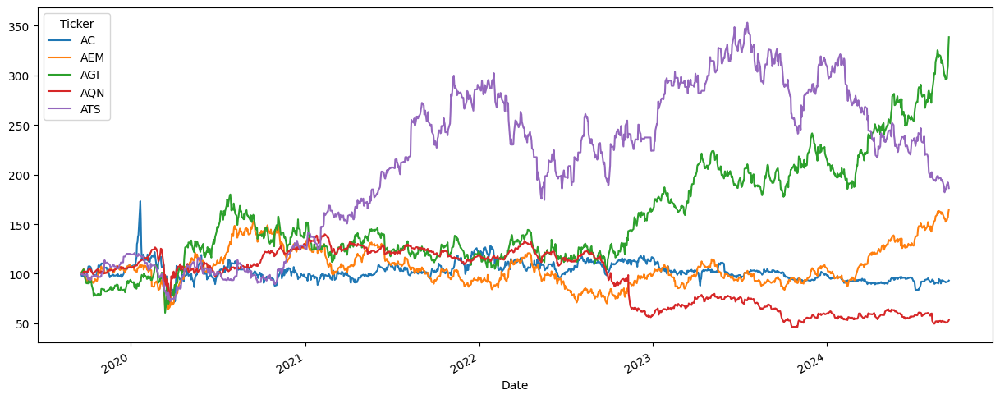

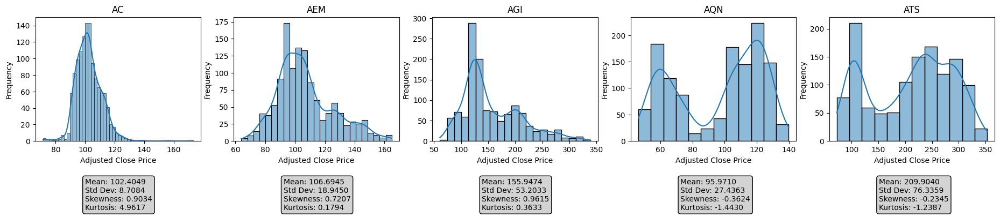

In [7]:

print('\nExploratory Data Analysis (EDA)\n')
#index_adj_close_price_df.iloc[0] # first row
asset_daily_price(index_adj_close_price_df,number_of_asset) #Plotting the first 5 assets daily adj closed prices
plot_normalize_asset_daily_price(normalized_asset_daily_price_df,number_of_asset)  #Normalization of adj closed prices to 100


The graphs show that the distribution of closing stock prices has the following characteristics:

-- **Non-stationarity:** Stock prices tend to increase over time, making the distribution dynamic and time-driven. This is in contrast to normal distributions which are stationary.  
-- **Fat tails (leptokurtosis):** Stock price distributions often have more extreme values ​​(fat tails) compared to a normal distribution. This means that there are more significant price changes than a normal distribution would predict.  
-- **Skewedness:** Stock prices can be asymmetrical, meaning that they are not symmetrical. For example, there may be more upward or downward price movements.

This leads us to calculate the logarithmic returns of assets


#### Assets log return and Volatility Calculation
In this section, we will calculate the assets log return instead of arithmetic return. The arithmetic return is the percentage change in the asset's price from one period to the next where as the log return of an asset over a period is calculated as the natural logarithm of the ratio of the ending price to the starting price.

$$ Arithmetic Return:
R = \frac{P_t - P_{t-1}}{P_{t-1}}
$$.
$$ Log Return:
\text{Log Return} = \ln\left(\frac{P_t}{P_{t-1}}\right)
$$.

Throughout this project, we will use asset log returns instead of arithmetic returns, simply because, in the upcoming sections we will perform stochastic simulation of the stock prices to calculate Profit & Loss, VaR, CVaR and stress testing. Log returns are commonly used in the financial literature to perform financial modeling like asset prices modeling over time,  as prices cannot be negative but can increase indefinitely. Log returns are normally distributed with Fat-Tailed that make them more likely to predict extreme returns than assuming arithmetic returns to be normally distributed. As we know, stocks are traded with very high frequency over very short period of time and the form of their distributions are unknown as we can see in the plottings above. This leads to use log returns witch naturally account for continuous compounding and more accurate instead of arithmetic returns witch are based on simple interest. Furthermore, as opposed to arithmetic returns, log returns are additive meaning that you can add log returns over multiple periods to get the total log return.



Assets log return data frame



Ticker,AEM,AGI,ATS,BLX,BMO,BN,BNS,BTE,BTO,BYD,...,TD,TFII,TPZ,TRI,TRP,TVE,WCN,WFG,WPM,X
Date,,,,,,,,,,,,,,,,,,,,,
2019-09-20 00:00:00+00:00,0.016807,0.015456,-0.006543,-0.003052,0.001362,-0.004812,0.000889,0.046520,-0.001235,-0.019909,...,0.002256,0.000000,0.004710,-0.011914,0.015202,0.005486,0.003316,0.000000,0.002924,-0.022863
2019-09-23 00:00:00+00:00,0.022427,0.019743,0.000000,-0.002550,-0.005186,-0.014012,0.003371,-0.005698,-0.000927,-0.008154,...,0.000000,0.002291,-0.001106,0.003440,0.005978,-0.005879,0.003964,-0.024680,0.024871,0.021053
2019-09-24 00:00:00+00:00,0.006364,0.008982,-0.002922,0.002040,-0.007555,-0.010592,0.006709,-0.064919,-0.013699,-0.022473,...,-0.003995,0.000000,-0.005549,0.005657,-0.002503,-0.000787,0.003401,0.004599,0.012383,-0.030347
2019-09-25 00:00:00+00:00,-0.024847,-0.053570,-0.006606,0.012662,0.009195,0.008897,0.003864,0.018127,0.014626,-0.008811,...,-0.002266,0.000000,-0.000557,0.005183,0.000000,-0.003942,-0.003292,0.000000,-0.036159,0.066812
2019-09-26 00:00:00+00:00,-0.008594,-0.019048,0.004409,-0.006564,-0.002325,0.017376,0.005245,-0.049090,-0.008999,-0.018730,...,0.001046,0.000000,0.001669,-0.003106,0.007489,0.003942,0.013968,-0.038149,0.002185,-0.013187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,0.011251,0.003309,0.032904,0.002256,0.008346,0.022295,0.015522,-0.006536,0.004310,0.010163,...,0.018057,0.002572,0.004999,0.014097,0.008106,0.003559,0.012948,0.004000,0.009954,0.048379
2024-09-10 00:00:00+00:00,0.014681,0.029302,0.003042,-0.009706,-0.001567,0.001483,0.003115,-0.029952,-0.006163,-0.016714,...,-0.006529,-0.013214,0.000000,0.016763,-0.027570,-0.001778,-0.001731,-0.002055,0.014411,-0.049979
2024-09-11 00:00:00+00:00,0.002405,0.011167,0.006433,-0.025685,0.017460,0.017833,0.006007,0.013423,-0.001856,-0.007953,...,0.010587,0.030752,-0.006113,0.003958,0.001964,0.001778,0.003837,-0.008379,-0.002359,0.067198



Assets volatility data frame



Ticker,AEM Volatility,AGI Volatility,ATS Volatility,BLX Volatility,BMO Volatility,BN Volatility,BNS Volatility,BTE Volatility,BTO Volatility,BYD Volatility,...,TD Volatility,TFII Volatility,TPZ Volatility,TRI Volatility,TRP Volatility,TVE Volatility,WCN Volatility,WFG Volatility,WPM Volatility,X Volatility
Quarter,,,,,,,,,,,,,,,,,,,,,
2020Q3,0.505330,0.722737,0.401362,0.657561,0.495835,0.513008,0.446334,1.091322,0.781613,0.931444,...,0.437453,0.491174,0.768634,0.306886,0.488908,0.108910,0.335048,0.693281,0.461335,0.751569
2020Q4,0.517322,0.735122,0.415200,0.669079,0.503353,0.532221,0.454041,1.117460,0.794128,0.938931,...,0.442245,0.497988,0.774648,0.310428,0.501494,0.119606,0.334636,0.702167,0.479239,0.758829
2021Q1,0.507919,0.710529,0.436002,0.645300,0.475903,0.523339,0.433218,1.103703,0.761213,0.888265,...,0.419510,0.540971,0.704425,0.304598,0.476976,0.115930,0.318027,0.680943,0.501728,0.815657
2021Q2,0.394552,0.498487,0.390192,0.364705,0.264166,0.330288,0.238358,0.833577,0.422179,0.507479,...,0.231210,0.415803,0.250732,0.210103,0.268064,0.105479,0.188678,0.478730,0.437271,0.789773
2021Q3,0.368136,0.462163,0.378344,0.279486,0.202586,0.292768,0.183985,0.719885,0.339573,0.426810,...,0.179408,0.412925,0.200002,0.198581,0.235408,0.111091,0.147088,0.403321,0.393466,0.728007
2021Q4,0.333092,0.418524,0.360240,0.238818,0.185124,0.262961,0.171322,0.673490,0.311613,0.411541,...,0.167922,0.416557,0.186837,0.194944,0.209064,0.109802,0.145107,0.368686,0.351394,0.692851
2022Q1,0.327136,0.390095,0.346108,0.217548,0.186195,0.250669,0.166026,0.610134,0.335227,0.405959,...,0.172636,0.357399,0.176881,0.187809,0.184952,0.112337,0.158590,0.352844,0.305566,0.606421
2022Q2,0.351677,0.394403,0.385216,0.209204,0.202488,0.282420,0.183523,0.602856,0.386554,0.394990,...,0.197152,0.393487,0.196335,0.188245,0.198772,0.119470,0.178486,0.368328,0.297602,0.545716
2022Q3,0.387415,0.430022,0.432768,0.226257,0.224788,0.310316,0.205239,0.653420,0.404918,0.409088,...,0.218834,0.423243,0.219101,0.197006,0.227495,0.121693,0.203168,0.421957,0.322888,0.542057



Portfolio arithmetics



,mu expected_return,variance,Sigmas(volatilities),modifiy shape(Er)/𝝈,initial price
Ticker,,,,,
AEM,0.000399,0.000602,0.024536,0.016246,50.451714
AGI,0.000972,0.000923,0.030374,0.032017,6.111329
ATS,0.000496,0.000571,0.023895,0.020765,13.800000
BLX,0.000621,0.000562,0.023707,0.026185,14.113465
BMO,0.000301,0.000350,0.018712,0.016110,58.627419
...,...,...,...,...,...
TVE,0.000003,0.000047,0.006887,0.000416,22.429235
WCN,0.000604,0.000192,0.013855,0.043585,87.075195
WFG,0.000659,0.000805,0.028378,0.023236,39.590134


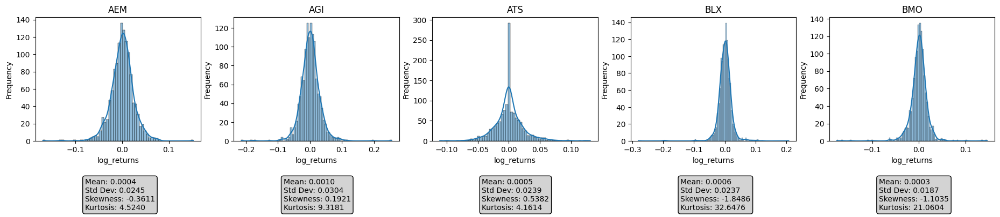

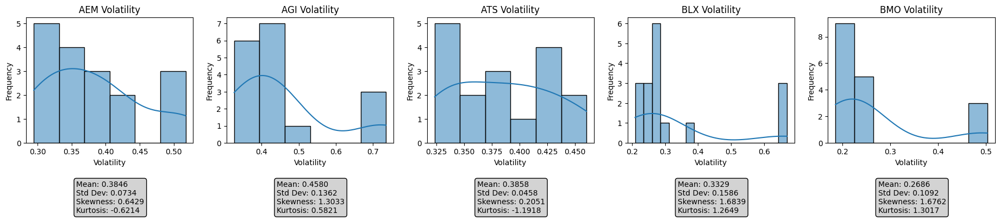

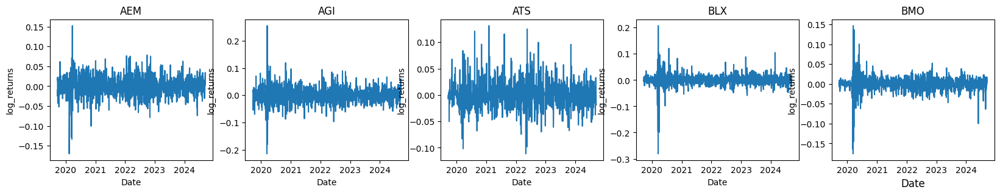

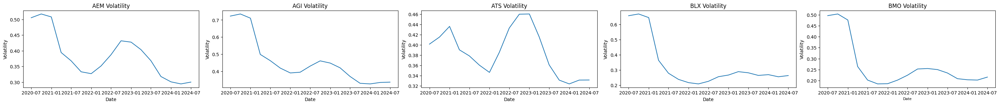

In [8]:

print('\nAssets log return data frame\n')
display(log_returns)
print('\nAssets volatility data frame\n')
display(asset_volatility_df)
print('\nPortfolio arithmetics\n')
display(portfolio_arihtmetics_df)
#print('\nAssets log returns Distribution\n')
plot_assets_distribution(log_returns.iloc[:,:number_of_asset], 'log_returns','Frequency')
#print('\nAssets Volatility Distribution\n')
plot_assets_distribution(asset_volatility_df.iloc[:,:number_of_asset], 'Volatility','Frequency')
plotting_assets_log_returns(log_returns.iloc[:,:number_of_asset], 'Date','log_returns')
plotting_assets_volatility(asset_volatility_df.iloc[:,:number_of_asset], 'Date','Volatility')



### **3. Dimensionality Reduction & Portfolio Construction using PCA, Correlation Analysis and Hierarchical Clustering**

In this section, we will stack Principal Component Analysis (PCA), Correlation Analysis and Hierarchical Clustering methods to create a diversified portfolio containing only the most important assets with less correlation.
The Principal Component Analysis (PCA) is a dimensionality reduction technique aimed at reducing the number of assets. The PCA process will take the log returns of the assets as input and will produce a correlation matrix as output by transforming the original set of assets into a smaller set of uncorrelated variables called principal components. These components capture the majority of the variance in the data. The correlation analysis process will use the correlation matrix produced by  PCA and will analyze the correlation between the most important assets selected by PCA. the highly correlated assets that may be redundant will be dropped. The remaining assets are expected to maintain a well-diversified portfolio.

In [9]:
def generate_correlation_matrix(log_returns):
    return log_returns.corr(method='pearson')

def get_selected_assets_volatility(assets_volatility_df, selected_content_ticker_list):

    for col in list(assets_volatility_df.columns):
        assets_volatility_df = assets_volatility_df.rename(columns={col: col.replace(' Volatility', '')})

    return assets_volatility_df[selected_content_ticker_list]

#Selecting most important economic factors
#-------------------------------------------------------------------------------
 #Principal Components Analysis(PCA) to select most importance assets
#-------------------------------------------------------------------------------



def selecting_important_item_PCA_treshold_method(matrix,threshold):

    return matrix[(matrix.abs() > threshold).any(axis=1)].index.to_list()

def selecting_important_item_corr_treshold_method(matrix,threshold):# to be change to >=matrix < threshold).any(axis=1)

    return matrix[(matrix < threshold).any(axis=1)].index.to_list()

def setting_PCA_for_assets_selection(log_returns_df):
    # economic indicators dataset

    # Standardizing the data
    scaler = StandardScaler()
    scaled_data_df = scaler.fit_transform(log_returns_df)

    # Applying PCA
    all_pca = PCA(n_components=None)  # Use all components to find the best number of important indicators
    all_principal_components = all_pca.fit_transform(scaled_data_df)

    # Explained variance
    explained_variance = all_pca.explained_variance_ratio_

    # Principal Component Loadings(coefficients)
    loadings_matrix = all_pca.components_

    # Create a DataFrame for loadings
    loadings_matrix_df = pd.DataFrame(loadings_matrix.T, columns=[f'PC{i+1}' for i in range(loadings_matrix.shape[0])],
                                      index=log_returns.columns)


    return loadings_matrix_df, explained_variance

#----------------------

def get_num_components(explained_variance,cumulative_variance_treshold = 0.9):
    # Determine the number of components explaining the cumulative varience treshold of the variance
    cumulative_variance = explained_variance.cumsum()
    return  (cumulative_variance <= cumulative_variance_treshold).sum() + 1

def select_top_components_df(loadings_matrix_df, num_components, threshold_for_high_loadings = 0.5):
    # Select top components
    return loadings_matrix_df.iloc[:, :num_components]

def select_top_indicators_df(loadings_matrix_df, num_components, threshold_for_high_loadings = 0.5):
    # Select top components
    selected_components_df = loadings_matrix_df.iloc[:, :num_components]
    # Find indicators with high loadings
    return selected_components_df[(selected_components_df.abs() > threshold_for_high_loadings).any(axis=1)]


def plot_explained_variance_for_assets_selection(loadings_matrix_df, explained_variance):

    # Print explained variance

    explained_variance_df = pd.DataFrame(explained_variance).T
    explained_variance_df.columns = loadings_matrix_df.columns
    print('\nexplained_variance_df\n')
    display(explained_variance_df)

    # Plotting the explained variance
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='individual explained variance')
    plt.step(range(1, len(explained_variance) + 1), np.cumsum(explained_variance), where='mid', label='cumulative explained variance')
    plt.xlabel('Principal Components')
    plt.ylabel('Explained Variance Ratio')
    plt.title('Explained Variance by Principal Components')
    plt.legend(loc='best')
    #plt.show()


#----------------------
def print_explained_variance(loadings_matrix_df, explained_variance,cumulative_variance_treshold, num_components, threshold_for_highest_loadings):
     # Print explained variance
    print('\nloadings_matrix_df\n')
    display(loadings_matrix_df)
    num_components = get_num_components(explained_variance,cumulative_variance_treshold)
    top_components_df = select_top_components_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
    print('\ntop_components_df\n')
    display(top_components_df)
    print('\nMost important assets with top components\n')
    top_indicators_df = select_top_indicators_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
    display(top_indicators_df)



#def get_all_assets_corr_matrix(log_returns_df, cumulative_variance_treshold = 1, threshold_for_highest_loadings = 0.5 ):

#    all_assets_matrix =  generate_correlation_matrix(log_returns_df)
#    return all_assets_matrix

def get_most_important_assets_log_returns_df_PCA_method(log_returns_df, most_important_assets_log_returns_list_PCA):
    return log_returns_df[most_important_assets_log_returns_list_PCA]

def get_most_important_assets_corr_matrix_PCA_method(most_important_assets_log_returns_df_PCA_method):
    #PCA to select most important portfolio assets
    return generate_correlation_matrix(most_important_assets_log_returns_df_PCA_method)


#----------------------------------------------------------------------------------------------------------
#Stacking  Correlation Analysis and Principal Components Analysis(PCA) to select most divesified assets
#-------------------------------------------------------------------------------------------------------------

def get_most_diversify_portfolio_asset_log_return_df_stacking_PCA_and_corr(log_returns_df,most_diversify_portfolio_assets_list_stacking_PCA_and_corr):
    return log_returns_df[most_diversify_portfolio_assets_list_stacking_PCA_and_corr]

def get_stacking_PCA_and_corr_method_matrix_to_diversify_portfolio(most_diversify_portfolio_assets_df_PCA_corr_method):
    return generate_correlation_matrix(most_diversify_portfolio_assets_df_PCA_corr_method)

#---------------------------------------------------------------------------------------------------------------------------------
#Stacking   Hierarchical Clustering, Correlation Analysis and Principal Components Analysis(PCA)  to select most divesified assets
#---------------------------------------------------------------------------------------------------------------------------------

def get_most_diversify_portfolio_asset_hierarchical_clustering_method(returns, g, distance_threshold= 1.5):
    #          We will use this method to efficiently reduce the number of assets in our portfolio
    #          by selecting a representative asset from each cluster identified in the clustermap

    # Extract the linkage matrix from the clustermap
    linkage_matrix = g.dendrogram_row.linkage

    # Get cluster assignments
    clusters = fcluster(linkage_matrix, t=distance_threshold, criterion='distance')

    # The number of clusters
    num_clusters = len(np.unique(clusters))

    # Display the cluster assignments
    asset_clusters = pd.DataFrame({'Asset': returns.columns[g.dendrogram_row.reordered_ind], 'Cluster': clusters})
    return asset_clusters

# Function to find the asset closest to the centroid of each cluster:this function is generated by chartGPT
def select_most_divesified_portfolio_assets_stacking_hierarchical_clustering_method(log_returns_df, asset_clusters):
    most_divesified_portfolio_assets_list_stacking_hierarchical_clustering_method = []
    for cluster in asset_clusters['Cluster'].unique():
        cluster_assets = asset_clusters[asset_clusters['Cluster'] == cluster]['Asset']
        cluster_returns = log_returns_df[cluster_assets].mean(axis=1)  # Compute the centroid
        distances = log_returns_df[cluster_assets].apply(lambda x: np.linalg.norm(x - cluster_returns), axis=0)
        representative_asset = distances.idxmin()
        most_divesified_portfolio_assets_list_stacking_hierarchical_clustering_method.append(representative_asset)
    return most_divesified_portfolio_assets_list_stacking_hierarchical_clustering_method


def create_clustermap(assets_matrix):
    g = sns.clustermap(assets_matrix,  method = 'ward', metric='euclidean', cmap   = 'RdBu',  annot  = True,  annot_kws = {'size': 8},
                      row_cluster=True, col_cluster=True)
    plt.close()
    return g


def select_most_divesified_portfolio_assets_df_stacking_hierarchical_clustering_method(log_returns_df,
                                                                    most_divesified_portfolio_assets_list_stacking_hierarchical_clustering_method):
    return log_returns_df[most_divesified_portfolio_assets_list_stacking_hierarchical_clustering_method]

def select_most_divesified_portfolio_assets_matrix_stacking_hierarchical_clustering_method(most_divesified_portfolio_assets_df_stacking_hierarchical_clustering_method):
    return generate_correlation_matrix(most_divesified_portfolio_assets_df_stacking_hierarchical_clustering_method)

#------------------------------------------------------------------------------------------------------------------------------------------
def plotting_selected_assets_corr_mat_clustermap(assets_matrix, title, dendrogram = True):

    g = sns.clustermap(assets_matrix,  method = 'ward', metric='euclidean', cmap   = 'RdBu',  annot  = True,  annot_kws = {'size': 8},
                      row_cluster=dendrogram, col_cluster=dendrogram)
    plt.subplots_adjust(top=0.85)
    plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
    plt.setp(g.ax_heatmap.get_yticklabels(), rotation=360)
    g.cax.set_position([1.02, 0.2, 0.03, 0.4])  # [left, bottom, width, height]
    g.cax.set_ylabel('Correlation Coefficient', rotation=270, labelpad=15)  # Rotate label
    g.fig.suptitle(title, y=0.9, fontsize=12)

 #----------------------------------------------------------------------------------------------------------
 #                              Most divesified Assets Daily Volatility
#-------------------------------------------------------------------------------------------------------------
#selected assets daily volatility
def get_selected_assets_volatility_df_from_Stack_Corr_PCA_method(selected_assets_adj_close_price_log_return_df, frequency_date_column = 'day'):

    frequency = frequency_date_column[0].upper()

    #Market volatility

    selected_assets_volatility_df = selected_assets_adj_close_price_log_return_df.rolling(center=False,window= 252).std() * np.sqrt(252)
    for col in list(selected_assets_volatility_df.columns):
        selected_assets_volatility_df = selected_assets_volatility_df.rename(columns={col: col+' Volatility'})

    selected_assets_volatility_df = selected_assets_volatility_df.dropna(axis=0)

    if frequency == 'D':
        selected_assets_volatilities = selected_assets_volatility_df
    else:
        selected_assets_volatility_df[frequency_date_column] = pd.to_datetime(selected_assets_volatility_df.index, format = '%m/%Y')
        selected_assets_volatility_df[frequency_date_column] = selected_assets_volatility_df[frequency_date_column].dt.to_period(frequency)

        #market_adj_close_price_log_return_frequency_df = market_volatility_df
        selected_assets_volatility_df.set_index(frequency_date_column, inplace=True)
        selected_assets_volatilities = selected_assets_volatility_df.groupby(frequency_date_column).mean()
        selected_assets_volatilities = round(selected_assets_volatilities,1)
        selected_assets_volatilities = selected_assets_volatilities.dropna(axis=0)

    return selected_assets_volatilities

#-------------------------portfolio arithmetics-summary------------------------

#merge content data frame and the weght data frame
def most_diversified_portfolio_arithmetics(most_divesified_portfolio_arihtmetics_df,  index_content_df ):
    most_divesified_portfolio_arihtmetics_df_reset = most_divesified_portfolio_arihtmetics_df.reset_index()
    most_divesified_portfolio_arihtmetics_df_reset.rename(columns={'index': 'Ticker'}, inplace=True)
    most_divesified_portfolio_arihtmetics_df_details = pd.merge(most_divesified_portfolio_arihtmetics_df_reset, index_content_df, how="inner", on=["Ticker"])
    return most_divesified_portfolio_arihtmetics_df_details


#----------------------------------------------- Plot the scatter matrix with regression lines------------------------------------------
def plot_scatter_matrix(df):
    #sns.pairplot(df, kind='reg',  height=3, aspect=3)
    #height=3, aspect=1.2
    g = sns.pairplot(df, kind='reg', height=3, aspect=1.2)
    g.fig.set_size_inches(12, 8)
    #plt.suptitle("Pairplot with Regression Lines", y=1.02, fontsize=12)
    plt.suptitle("Scatter Matrix for Stock Prices with Regression Lines", y=1.02, fontsize=12, fontweight='bold', color='blue')
    # Adjust the axis font size
    plt.tick_params(axis='both', which='major', labelsize=50)

    #plt.show()


#------------------------------------------------------plotting portfolio structure----------

def plot_portfolio_structure_pie_chart(most_divesified_portfolio_arihtmetics_df_details):

    most_divesified_portfolio_arihtmetics_df_details = most_divesified_portfolio_arihtmetics_df_details.sort_values(by='modifiy shape(Er)/𝝈',ascending=True)
    industry_labels = most_divesified_portfolio_arihtmetics_df_details['Industry'].values
    sector_labels = most_divesified_portfolio_arihtmetics_df_details['Sector'].values
    modifiy_sharpe_values = most_divesified_portfolio_arihtmetics_df_details['modifiy shape(Er)/𝝈'].values

    # Create subplots: use 'domain' type for Pie subplot
    fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

    fig.add_trace(go.Pie(labels=industry_labels, values=modifiy_sharpe_values, name="Industry",
                        legendgroup="Industry",  # this can be any string, not just "group"
                        legendgrouptitle_text="Industry"), 1, 1)
    fig.add_trace(go.Pie(labels=sector_labels, values=modifiy_sharpe_values, name="Sector",
                        legendgroup="Sector",  # this can be any string, not just "group"
                        legendgrouptitle_text="Sector"), 1, 2)

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hole=.5, hoverinfo="label+percent+name")

    fig.update_layout(
    title_text=" Asset - Risk-Adjusted Return (modifiy sharpe(Er)/risk by Industry & Sector)",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Industry', x=0.14, y=0.5, font_size=20, showarrow=False),
                 dict(text='Sector', x=0.84, y=0.5, font_size=20, showarrow=False)],
    height=500,
    width=800,
    autosize=True,
    margin=dict(t=0, b=0, l=50, r=0),
    legend_tracegroupgap = 0,
    legend=dict(
                    orientation="v",
                    yanchor="bottom",
                    y=0,
                    xanchor="right",
                    x=1.5),
     title=dict(
                    y=0.9,
                    x=0.1,
                    xanchor= 'left',
                    yanchor= 'top'))

    fig.show()

def plot_portfolio_structure( p_most_divesified_portfolio_arihtmetics_df_details):
    fig, ax =plt.subplots(figsize=(12, 6))

    l_most_divesified_portfolio_arihtmetics_df_details = p_most_divesified_portfolio_arihtmetics_df_details.sort_values(by='modifiy shape(Er)/𝝈',ascending=True)
    column_list = [':      ' for i in range(len(l_most_divesified_portfolio_arihtmetics_df_details))]
    column_df = pd.DataFrame({'colum': column_list})

    modifiy_sharpe_values = l_most_divesified_portfolio_arihtmetics_df_details['modifiy shape(Er)/𝝈']
    Tickers = l_most_divesified_portfolio_arihtmetics_df_details['Sector'] + column_df['colum'] + \
                        l_most_divesified_portfolio_arihtmetics_df_details['Industry'] + column_df['colum'] + \
                        l_most_divesified_portfolio_arihtmetics_df_details['Company'] + \
                        column_df['colum'] + l_most_divesified_portfolio_arihtmetics_df_details['Ticker']

    bar_container= ax.barh(Tickers, modifiy_sharpe_values*100)
    ax.axes.get_xaxis().set_visible(False)
    # setting label of y-axis
    ax.set_ylabel("Asset Tickers")
    # setting label of x-axis
    ax.set_xlabel("Asset modifiy sharpe(Er)/𝝈")
    ax.set_title(" Most Diversified portfolio Structure: Asset Risk-Adjusted Return (modifiy sharpe(Er)/risk)",fontsize=22,  horizontalalignment='right',fontweight='roman')
    ax.bar_label(bar_container, fmt='{:,.1f}%')


    plt.show()
    #Asset return pie chart
    plot_portfolio_structure_pie_chart( p_most_divesified_portfolio_arihtmetics_df_details)



In [10]:
# Data setting-

cumulative_variance_treshold = 1.0
threshold_for_highest_loadings = 0.5
correlation_coefficient_treshold = 0.3
distance_threshold= 0.5 # parameter to determining the number of clusters in hierarchical clustering.

#-------------------------------------PCA_method----------------------
loadings_matrix_df, explained_variance  = setting_PCA_for_assets_selection(log_returns)
num_components = get_num_components(explained_variance,cumulative_variance_treshold)
top_components_df = select_top_components_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
top_indicators_df = select_top_indicators_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
most_important_assets_list_PCA_treshold_method = selecting_important_item_PCA_treshold_method(top_indicators_df, threshold_for_highest_loadings)
most_important_assets_log_returns_df_PCA_method = get_most_important_assets_log_returns_df_PCA_method(log_returns, most_important_assets_list_PCA_treshold_method)
most_important_assets_corr_matrix_PCA_method = get_most_important_assets_corr_matrix_PCA_method(most_important_assets_log_returns_df_PCA_method)

#----------------------------------------------------Correlation method-------------------------
selected_assets_list_correlation_method = selecting_important_item_corr_treshold_method(most_important_assets_corr_matrix_PCA_method,
                                                                                            correlation_coefficient_treshold)
selected_assets_log_return_df_correlation_method = log_returns[selected_assets_list_correlation_method]

selected_assets_log_return_Corr_matrix_correlation_method =  generate_correlation_matrix(selected_assets_log_return_df_correlation_method)


#-------------------------stack_PCA_corr_method---------------------------------------------------------------

most_diversify_portfolio_assets_list_stack_PCA_corr_method = selecting_important_item_corr_treshold_method(selected_assets_log_return_Corr_matrix_correlation_method,
                                                                                              correlation_coefficient_treshold)


most_diversify_portfolio_asset_log_return_df_stacking_PCA_and_corr = get_most_diversify_portfolio_asset_log_return_df_stacking_PCA_and_corr(log_returns,
                                                                                                         most_diversify_portfolio_assets_list_stack_PCA_corr_method)

most_diversify_portfolio_assets_matrix_stacking_PCA_and_corr_method = \
                        get_stacking_PCA_and_corr_method_matrix_to_diversify_portfolio(most_diversify_portfolio_asset_log_return_df_stacking_PCA_and_corr )

#------------------------------stacking_hierarchical_clustering_method------------------------------------
#get clustermap
clustermap=  create_clustermap(most_diversify_portfolio_assets_matrix_stacking_PCA_and_corr_method);

#get asset clusters
asset_clusters = get_most_diversify_portfolio_asset_hierarchical_clustering_method(most_diversify_portfolio_asset_log_return_df_stacking_PCA_and_corr,
                                                                                       clustermap, distance_threshold)
# Get the representative assets
most_diversify_portfolio_assets_list = \
            select_most_divesified_portfolio_assets_stacking_hierarchical_clustering_method(most_diversify_portfolio_asset_log_return_df_stacking_PCA_and_corr,
                                                                                            asset_clusters)

most_diversify_portfolio_assets_log_returns_df = \
                select_most_divesified_portfolio_assets_df_stacking_hierarchical_clustering_method(log_returns, most_diversify_portfolio_assets_list)


most_diversify_portfolio_assets_corr_matrix = \
                select_most_divesified_portfolio_assets_matrix_stacking_hierarchical_clustering_method(most_diversify_portfolio_assets_log_returns_df)

selected_assets_volatility_df_stacking_corr_PCA_method = \
                   get_selected_assets_volatility_df_from_Stack_Corr_PCA_method(most_diversify_portfolio_assets_log_returns_df, frequency_date_column = 'day')


most_diversify_portfolio_assets_initial_prices =  stocks_initial_prices[most_diversify_portfolio_assets_list]
most_divesified_portfolio_arihtmetics_df = portfolio_arihtmetics(most_diversify_portfolio_assets_log_returns_df,
                                                                     most_diversify_portfolio_assets_initial_prices).transpose()

most_divesified_portfolio_arihtmetics_df_details  = most_diversified_portfolio_arithmetics(most_divesified_portfolio_arihtmetics_df,  index_content_df)




Initial assets log returns



Ticker,AEM,AGI,ATS,BLX,BMO,BN,BNS,BTE,BTO,BYD,...,TD,TFII,TPZ,TRI,TRP,TVE,WCN,WFG,WPM,X
Date,,,,,,,,,,,,,,,,,,,,,
2019-09-20 00:00:00+00:00,0.016807,0.015456,-0.006543,-0.003052,0.001362,-0.004812,0.000889,0.046520,-0.001235,-0.019909,...,0.002256,0.000000,0.004710,-0.011914,0.015202,0.005486,0.003316,0.000000,0.002924,-0.022863
2019-09-23 00:00:00+00:00,0.022427,0.019743,0.000000,-0.002550,-0.005186,-0.014012,0.003371,-0.005698,-0.000927,-0.008154,...,0.000000,0.002291,-0.001106,0.003440,0.005978,-0.005879,0.003964,-0.024680,0.024871,0.021053
2019-09-24 00:00:00+00:00,0.006364,0.008982,-0.002922,0.002040,-0.007555,-0.010592,0.006709,-0.064919,-0.013699,-0.022473,...,-0.003995,0.000000,-0.005549,0.005657,-0.002503,-0.000787,0.003401,0.004599,0.012383,-0.030347
2019-09-25 00:00:00+00:00,-0.024847,-0.053570,-0.006606,0.012662,0.009195,0.008897,0.003864,0.018127,0.014626,-0.008811,...,-0.002266,0.000000,-0.000557,0.005183,0.000000,-0.003942,-0.003292,0.000000,-0.036159,0.066812
2019-09-26 00:00:00+00:00,-0.008594,-0.019048,0.004409,-0.006564,-0.002325,0.017376,0.005245,-0.049090,-0.008999,-0.018730,...,0.001046,0.000000,0.001669,-0.003106,0.007489,0.003942,0.013968,-0.038149,0.002185,-0.013187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,0.011251,0.003309,0.032904,0.002256,0.008346,0.022295,0.015522,-0.006536,0.004310,0.010163,...,0.018057,0.002572,0.004999,0.014097,0.008106,0.003559,0.012948,0.004000,0.009954,0.048379
2024-09-10 00:00:00+00:00,0.014681,0.029302,0.003042,-0.009706,-0.001567,0.001483,0.003115,-0.029952,-0.006163,-0.016714,...,-0.006529,-0.013214,0.000000,0.016763,-0.027570,-0.001778,-0.001731,-0.002055,0.014411,-0.049979
2024-09-11 00:00:00+00:00,0.002405,0.011167,0.006433,-0.025685,0.017460,0.017833,0.006007,0.013423,-0.001856,-0.007953,...,0.010587,0.030752,-0.006113,0.003958,0.001964,0.001778,0.003837,-0.008379,-0.002359,0.067198



explained_variance_df



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79
0,0.403602,0.100366,0.040448,0.032508,0.027602,0.021526,0.01613,0.015605,0.013223,0.01211,...,0.001579,0.001549,0.001374,0.00133,0.001322,0.001241,0.000908,0.000862,0.000556,0.000306



loadings_matrix_df



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79
Ticker,,,,,,,,,,,,,,,,,,,,,
AEM,-0.065660,0.277221,-0.010776,-0.037814,-0.045345,0.032678,-0.078810,0.055733,-0.058638,-0.033541,...,-0.153513,0.031633,-0.126434,-0.056128,0.066679,0.003382,-0.003682,-0.000838,-0.009734,0.017045
AGI,-0.058046,0.293139,-0.008129,-0.050321,-0.048097,0.083405,-0.011333,-0.020437,-0.021660,0.008813,...,0.204634,-0.137181,0.062758,-0.077548,-0.120887,0.010203,-0.062098,-0.021377,-0.011381,-0.018924
ATS,-0.073840,-0.003183,0.015819,0.123430,0.075153,-0.140580,0.227612,-0.035520,-0.099326,-0.295383,...,-0.008789,0.015918,-0.001748,0.006559,0.003258,-0.004885,0.021893,-0.019799,-0.006737,0.001024
BLX,-0.105669,-0.057725,-0.041516,0.040698,-0.132837,0.298435,-0.075721,-0.017196,-0.120115,0.093563,...,0.020556,-0.048212,0.006105,-0.042138,-0.002142,0.009548,-0.002829,-0.048638,0.013166,-0.015190
BMO,-0.152272,-0.072828,-0.059208,-0.050460,0.045342,-0.063405,0.164727,0.095005,-0.009644,0.068867,...,-0.067631,0.188075,0.061643,-0.696490,-0.292883,-0.254625,-0.046913,-0.061960,0.035127,-0.000137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TVE,-0.034160,0.019894,0.083712,0.052836,-0.134622,0.027810,-0.091461,-0.050108,0.666772,-0.072081,...,0.015520,-0.003932,0.017027,-0.012634,-0.006073,0.001038,-0.010051,-0.019850,0.007513,0.015121
WCN,-0.100761,-0.013607,0.166299,-0.182015,0.083339,-0.055080,-0.242847,0.021733,0.023566,0.059567,...,-0.053682,-0.041031,0.051131,0.003133,-0.020481,0.050181,-0.007622,0.002614,-0.004427,-0.014030
WFG,-0.111495,-0.000068,-0.014815,0.011639,0.001608,-0.054295,0.179544,0.021747,0.121868,-0.226331,...,0.018768,-0.002789,0.008625,-0.037347,-0.000618,-0.013027,-0.008962,-0.022289,0.004429,0.012087



top_components_df



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79
Ticker,,,,,,,,,,,,,,,,,,,,,
AEM,-0.065660,0.277221,-0.010776,-0.037814,-0.045345,0.032678,-0.078810,0.055733,-0.058638,-0.033541,...,-0.153513,0.031633,-0.126434,-0.056128,0.066679,0.003382,-0.003682,-0.000838,-0.009734,0.017045
AGI,-0.058046,0.293139,-0.008129,-0.050321,-0.048097,0.083405,-0.011333,-0.020437,-0.021660,0.008813,...,0.204634,-0.137181,0.062758,-0.077548,-0.120887,0.010203,-0.062098,-0.021377,-0.011381,-0.018924
ATS,-0.073840,-0.003183,0.015819,0.123430,0.075153,-0.140580,0.227612,-0.035520,-0.099326,-0.295383,...,-0.008789,0.015918,-0.001748,0.006559,0.003258,-0.004885,0.021893,-0.019799,-0.006737,0.001024
BLX,-0.105669,-0.057725,-0.041516,0.040698,-0.132837,0.298435,-0.075721,-0.017196,-0.120115,0.093563,...,0.020556,-0.048212,0.006105,-0.042138,-0.002142,0.009548,-0.002829,-0.048638,0.013166,-0.015190
BMO,-0.152272,-0.072828,-0.059208,-0.050460,0.045342,-0.063405,0.164727,0.095005,-0.009644,0.068867,...,-0.067631,0.188075,0.061643,-0.696490,-0.292883,-0.254625,-0.046913,-0.061960,0.035127,-0.000137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TVE,-0.034160,0.019894,0.083712,0.052836,-0.134622,0.027810,-0.091461,-0.050108,0.666772,-0.072081,...,0.015520,-0.003932,0.017027,-0.012634,-0.006073,0.001038,-0.010051,-0.019850,0.007513,0.015121
WCN,-0.100761,-0.013607,0.166299,-0.182015,0.083339,-0.055080,-0.242847,0.021733,0.023566,0.059567,...,-0.053682,-0.041031,0.051131,0.003133,-0.020481,0.050181,-0.007622,0.002614,-0.004427,-0.014030
WFG,-0.111495,-0.000068,-0.014815,0.011639,0.001608,-0.054295,0.179544,0.021747,0.121868,-0.226331,...,0.018768,-0.002789,0.008625,-0.037347,-0.000618,-0.013027,-0.008962,-0.022289,0.004429,0.012087



Most important assets with top components



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79
Ticker,,,,,,,,,,,,,,,,,,,,,
AGI,-0.058046,0.293139,-0.008129,-0.050321,-0.048097,0.083405,-0.011333,-0.020437,-0.021660,0.008813,...,0.204634,-0.137181,0.062758,-0.077548,-0.120887,0.010203,-0.062098,-0.021377,-0.011381,-0.018924
ATS,-0.073840,-0.003183,0.015819,0.123430,0.075153,-0.140580,0.227612,-0.035520,-0.099326,-0.295383,...,-0.008789,0.015918,-0.001748,0.006559,0.003258,-0.004885,0.021893,-0.019799,-0.006737,0.001024
BMO,-0.152272,-0.072828,-0.059208,-0.050460,0.045342,-0.063405,0.164727,0.095005,-0.009644,0.068867,...,-0.067631,0.188075,0.061643,-0.696490,-0.292883,-0.254625,-0.046913,-0.061960,0.035127,-0.000137
BN,-0.147570,-0.049151,0.067749,-0.010225,0.068203,-0.008769,0.076466,0.101559,0.069694,0.030326,...,-0.026024,0.049371,-0.146767,0.030003,0.012664,-0.131229,-0.120176,-0.041828,0.020563,0.002664
CIX,-0.055730,0.012198,0.005646,0.032877,-0.082183,0.201623,-0.027578,-0.162531,0.197619,0.391197,...,-0.007738,-0.004975,0.004376,0.011715,-0.018800,-0.012591,0.003754,-0.008388,-0.019873,-0.001135
CNQ,-0.129036,-0.052569,-0.266273,0.050166,0.038860,-0.130928,-0.203639,-0.045137,-0.015820,-0.005369,...,0.207531,0.033194,0.018055,0.194822,0.003831,-0.664927,-0.024559,0.167028,0.073129,-0.007911
DOL,-0.160505,-0.010951,0.042706,-0.028138,0.084413,-0.018723,0.010702,-0.076576,-0.108471,0.070654,...,-0.012784,0.050043,-0.002032,0.013613,0.011413,-0.017904,-0.054448,-0.036815,-0.006015,0.750245
DOO,-0.157278,-0.010744,0.036956,-0.038813,0.075532,-0.001396,0.032714,-0.090860,-0.088689,0.055032,...,-0.057218,0.072680,-0.023742,0.007692,0.047467,-0.035155,0.022961,0.006607,-0.044916,-0.650058
ENB,-0.144404,-0.040804,-0.102082,-0.085233,-0.051145,-0.156797,-0.081955,0.078261,-0.006242,0.127476,...,-0.008523,-0.589624,0.005054,-0.130672,-0.084520,-0.052168,-0.082026,-0.049681,0.037647,-0.014445



Most Important Assets Log returns  using PCA



Ticker,AGI,ATS,BMO,BN,CIX,CNQ,DOL,DOO,ENB,IGM,NGD,PEY,RY,SIL,TD,TVE
Date,,,,,,,,,,,,,,,,
2019-09-20 00:00:00+00:00,0.015456,-0.006543,0.001362,-0.004812,0.000000,0.010625,-0.000859,-0.002022,0.003969,-0.011009,-0.050010,-0.002180,0.009018,0.017198,0.002256,0.005486
2019-09-23 00:00:00+00:00,0.019743,0.000000,-0.005186,-0.014012,-0.001344,0.006900,-0.002149,-0.003785,-0.005391,0.000182,0.105361,0.002897,-0.004066,0.029322,0.000000,-0.005879
2019-09-24 00:00:00+00:00,0.008982,-0.002922,-0.007555,-0.010592,-0.046104,-0.017894,-0.005535,-0.005220,0.006239,-0.014626,0.030305,-0.006572,-0.004207,0.012903,-0.003995,-0.000787
2019-09-25 00:00:00+00:00,-0.053570,-0.006606,0.009195,0.008897,0.023662,-0.006654,-0.002179,-0.002736,-0.001698,0.013147,-0.085655,0.007663,0.004578,-0.043563,-0.002266,-0.003942
2019-09-26 00:00:00+00:00,-0.019048,0.004409,-0.002325,0.017376,-0.016644,-0.009316,0.001526,-0.000818,0.011824,-0.003294,-0.058594,-0.001091,-0.001359,-0.007055,0.001046,0.003942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,0.003309,0.032904,0.008346,0.022295,0.078256,0.007794,0.009506,0.009678,0.009855,0.010638,0.017022,0.005634,0.016810,0.006941,0.018057,0.003559
2024-09-10 00:00:00+00:00,0.029302,0.003042,-0.001567,0.001483,0.001090,-0.038970,-0.007407,-0.006583,-0.013079,0.009850,0.049393,0.000000,-0.005790,0.014389,-0.006529,-0.001778
2024-09-11 00:00:00+00:00,0.011167,0.006433,0.017460,0.017833,0.019425,0.005573,0.003615,0.002253,-0.000497,0.024374,0.058496,-0.008463,0.008226,0.021202,0.010587,0.001778



Most Important Assets Log returns  using Correlation method



Ticker,AGI,ATS,BMO,BN,CIX,CNQ,DOL,DOO,ENB,IGM,NGD,PEY,RY,SIL,TD,TVE
Date,,,,,,,,,,,,,,,,
2019-09-20 00:00:00+00:00,0.015456,-0.006543,0.001362,-0.004812,0.000000,0.010625,-0.000859,-0.002022,0.003969,-0.011009,-0.050010,-0.002180,0.009018,0.017198,0.002256,0.005486
2019-09-23 00:00:00+00:00,0.019743,0.000000,-0.005186,-0.014012,-0.001344,0.006900,-0.002149,-0.003785,-0.005391,0.000182,0.105361,0.002897,-0.004066,0.029322,0.000000,-0.005879
2019-09-24 00:00:00+00:00,0.008982,-0.002922,-0.007555,-0.010592,-0.046104,-0.017894,-0.005535,-0.005220,0.006239,-0.014626,0.030305,-0.006572,-0.004207,0.012903,-0.003995,-0.000787
2019-09-25 00:00:00+00:00,-0.053570,-0.006606,0.009195,0.008897,0.023662,-0.006654,-0.002179,-0.002736,-0.001698,0.013147,-0.085655,0.007663,0.004578,-0.043563,-0.002266,-0.003942
2019-09-26 00:00:00+00:00,-0.019048,0.004409,-0.002325,0.017376,-0.016644,-0.009316,0.001526,-0.000818,0.011824,-0.003294,-0.058594,-0.001091,-0.001359,-0.007055,0.001046,0.003942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,0.003309,0.032904,0.008346,0.022295,0.078256,0.007794,0.009506,0.009678,0.009855,0.010638,0.017022,0.005634,0.016810,0.006941,0.018057,0.003559
2024-09-10 00:00:00+00:00,0.029302,0.003042,-0.001567,0.001483,0.001090,-0.038970,-0.007407,-0.006583,-0.013079,0.009850,0.049393,0.000000,-0.005790,0.014389,-0.006529,-0.001778
2024-09-11 00:00:00+00:00,0.011167,0.006433,0.017460,0.017833,0.019425,0.005573,0.003615,0.002253,-0.000497,0.024374,0.058496,-0.008463,0.008226,0.021202,0.010587,0.001778



Most Diversified Assets Log returns  using Stack Correlation Matrix/PCA Method



Ticker,AGI,ATS,BMO,BN,CIX,CNQ,DOL,DOO,ENB,IGM,NGD,PEY,RY,SIL,TD,TVE
Date,,,,,,,,,,,,,,,,
2019-09-20 00:00:00+00:00,0.015456,-0.006543,0.001362,-0.004812,0.000000,0.010625,-0.000859,-0.002022,0.003969,-0.011009,-0.050010,-0.002180,0.009018,0.017198,0.002256,0.005486
2019-09-23 00:00:00+00:00,0.019743,0.000000,-0.005186,-0.014012,-0.001344,0.006900,-0.002149,-0.003785,-0.005391,0.000182,0.105361,0.002897,-0.004066,0.029322,0.000000,-0.005879
2019-09-24 00:00:00+00:00,0.008982,-0.002922,-0.007555,-0.010592,-0.046104,-0.017894,-0.005535,-0.005220,0.006239,-0.014626,0.030305,-0.006572,-0.004207,0.012903,-0.003995,-0.000787
2019-09-25 00:00:00+00:00,-0.053570,-0.006606,0.009195,0.008897,0.023662,-0.006654,-0.002179,-0.002736,-0.001698,0.013147,-0.085655,0.007663,0.004578,-0.043563,-0.002266,-0.003942
2019-09-26 00:00:00+00:00,-0.019048,0.004409,-0.002325,0.017376,-0.016644,-0.009316,0.001526,-0.000818,0.011824,-0.003294,-0.058594,-0.001091,-0.001359,-0.007055,0.001046,0.003942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,0.003309,0.032904,0.008346,0.022295,0.078256,0.007794,0.009506,0.009678,0.009855,0.010638,0.017022,0.005634,0.016810,0.006941,0.018057,0.003559
2024-09-10 00:00:00+00:00,0.029302,0.003042,-0.001567,0.001483,0.001090,-0.038970,-0.007407,-0.006583,-0.013079,0.009850,0.049393,0.000000,-0.005790,0.014389,-0.006529,-0.001778
2024-09-11 00:00:00+00:00,0.011167,0.006433,0.017460,0.017833,0.019425,0.005573,0.003615,0.002253,-0.000497,0.024374,0.058496,-0.008463,0.008226,0.021202,0.010587,0.001778



Most Diversified Assets Log returns  using Stacking Hierarchical Clustering, Correlation Analysis & PCA Method



Ticker,ATS,CNQ,DOL,DOO,BN,PEY,ENB,BMO,TD,NGD,TVE
Date,,,,,,,,,,,
2019-09-20 00:00:00+00:00,-0.006543,0.010625,-0.000859,-0.002022,-0.004812,-0.002180,0.003969,0.001362,0.002256,-0.050010,0.005486
2019-09-23 00:00:00+00:00,0.000000,0.006900,-0.002149,-0.003785,-0.014012,0.002897,-0.005391,-0.005186,0.000000,0.105361,-0.005879
2019-09-24 00:00:00+00:00,-0.002922,-0.017894,-0.005535,-0.005220,-0.010592,-0.006572,0.006239,-0.007555,-0.003995,0.030305,-0.000787
2019-09-25 00:00:00+00:00,-0.006606,-0.006654,-0.002179,-0.002736,0.008897,0.007663,-0.001698,0.009195,-0.002266,-0.085655,-0.003942
2019-09-26 00:00:00+00:00,0.004409,-0.009316,0.001526,-0.000818,0.017376,-0.001091,0.011824,-0.002325,0.001046,-0.058594,0.003942
...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,0.032904,0.007794,0.009506,0.009678,0.022295,0.005634,0.009855,0.008346,0.018057,0.017022,0.003559
2024-09-10 00:00:00+00:00,0.003042,-0.038970,-0.007407,-0.006583,0.001483,0.000000,-0.013079,-0.001567,-0.006529,0.049393,-0.001778
2024-09-11 00:00:00+00:00,0.006433,0.005573,0.003615,0.002253,0.017833,-0.008463,-0.000497,0.017460,0.010587,0.058496,0.001778



Diversified Portfolio Assets Volatility 



Ticker,ATS Volatility,CNQ Volatility,DOL Volatility,DOO Volatility,BN Volatility,PEY Volatility,ENB Volatility,BMO Volatility,TD Volatility,NGD Volatility,TVE Volatility
Date,,,,,,,,,,,
2020-09-18 00:00:00+00:00,0.397617,0.810868,0.308948,0.298232,0.511690,0.388285,0.472608,0.495128,0.436527,0.851180,0.107393
2020-09-21 00:00:00+00:00,0.400647,0.812542,0.309930,0.299506,0.512432,0.389360,0.472802,0.495544,0.437326,0.851868,0.107525
2020-09-22 00:00:00+00:00,0.400647,0.812808,0.309925,0.299598,0.512336,0.389364,0.473020,0.495678,0.437342,0.846089,0.107429
2020-09-23 00:00:00+00:00,0.402104,0.813346,0.310158,0.299681,0.512973,0.390019,0.474124,0.495760,0.437471,0.854508,0.107572
2020-09-24 00:00:00+00:00,0.402265,0.813374,0.310153,0.299685,0.512914,0.389943,0.474147,0.495714,0.437538,0.850824,0.107756
...,...,...,...,...,...,...,...,...,...,...,...
2024-09-09 00:00:00+00:00,0.331832,0.280059,0.122660,0.121811,0.292684,0.163629,0.161075,0.226355,0.186543,0.573182,0.084597
2024-09-10 00:00:00+00:00,0.330697,0.282738,0.122913,0.122023,0.292288,0.163626,0.161460,0.226361,0.186667,0.575011,0.084177
2024-09-11 00:00:00+00:00,0.330453,0.281679,0.122394,0.121479,0.292176,0.163795,0.161413,0.226418,0.185932,0.577119,0.084182



Most Diversified Portfolio arithmetics details



,Ticker,mu expected_return,variance,Sigmas(volatilities),modifiy shape(Er)/𝝈,initial price,Company,Sector,Industry
0,ATS,0.000496,0.000571,0.023895,0.020765,13.800000,ATS Corporation,Industrials,Industrial Products
1,CNQ,0.000925,0.000944,0.030723,0.030108,10.022613,Canadian Natural Resources Limited,Energy,Oil & Gas Exploration and Production
2,DOL,0.000256,0.000147,0.012135,0.021079,38.652294,Dollarama Inc.,Consumer Defensive,Retail Defensive
3,DOO,0.000143,0.000144,0.012013,0.011887,36.040306,BRP Inc.,Consumer Cyclical,Vehicles & Parts
4,BN,0.000460,0.000511,0.022606,0.020339,27.737461,Brookfield Corporation,Financial Services,Asset Management
5,PEY,0.000308,0.000216,0.014703,0.020975,14.665503,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production
6,ENB,0.000373,0.000308,0.017546,0.021269,25.507914,Enbridge Inc.,Energy,Oil & Gas Storage/Transport
7,BMO,0.000301,0.000350,0.018712,0.016110,58.627419,Bank of Montreal,Financial Services,Banks
8,TD,0.000239,0.000282,0.016799,0.014204,46.114777,Toronto-Dominion Bank,Financial Services,Banks
9,NGD,0.000737,0.001867,0.043211,0.017059,1.230000,New Gold Inc.,Basic Materials,Metals & Mining


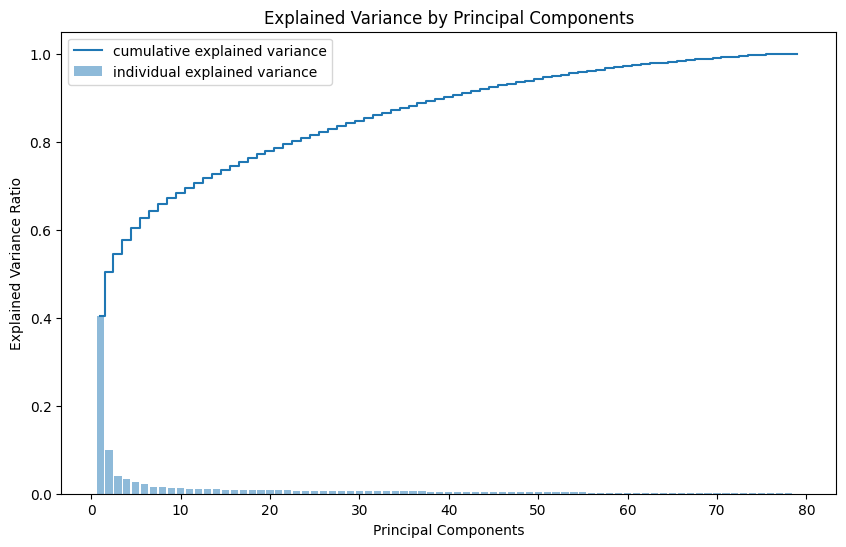

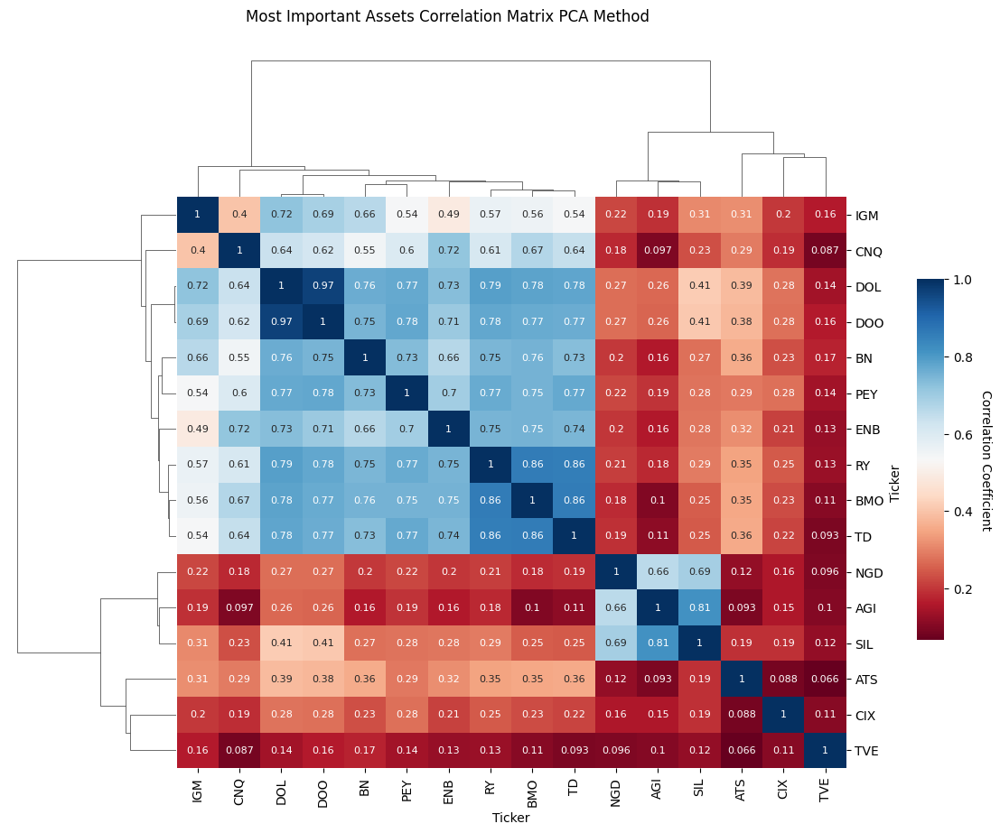

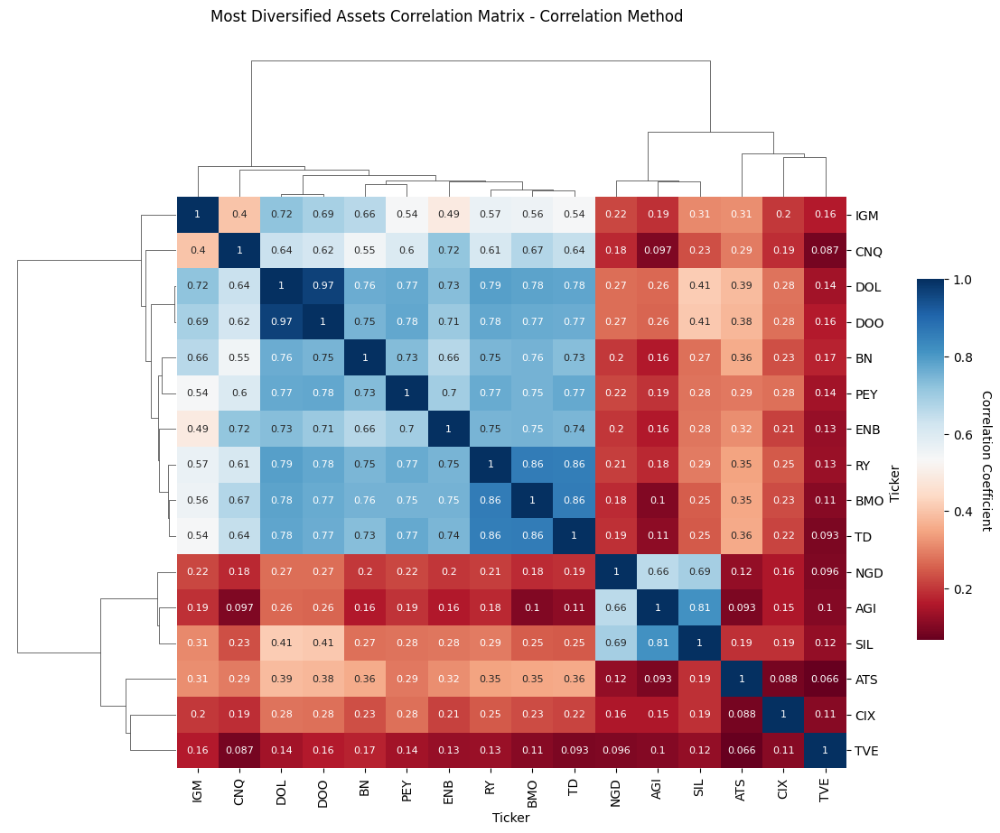

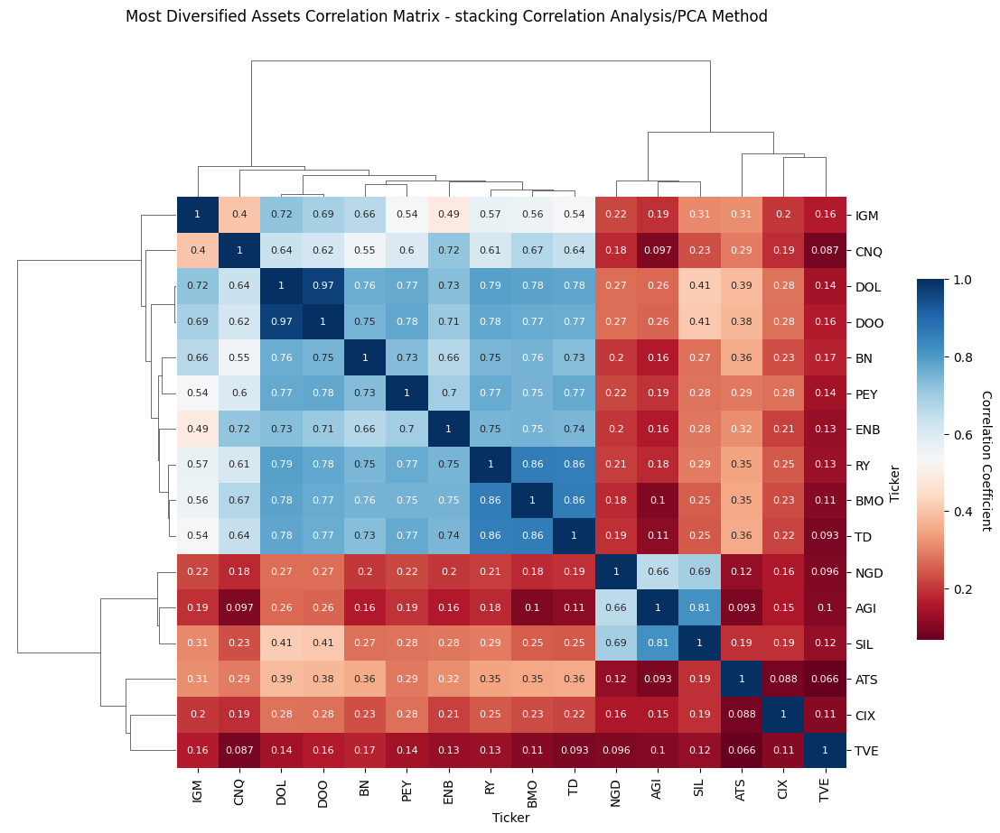

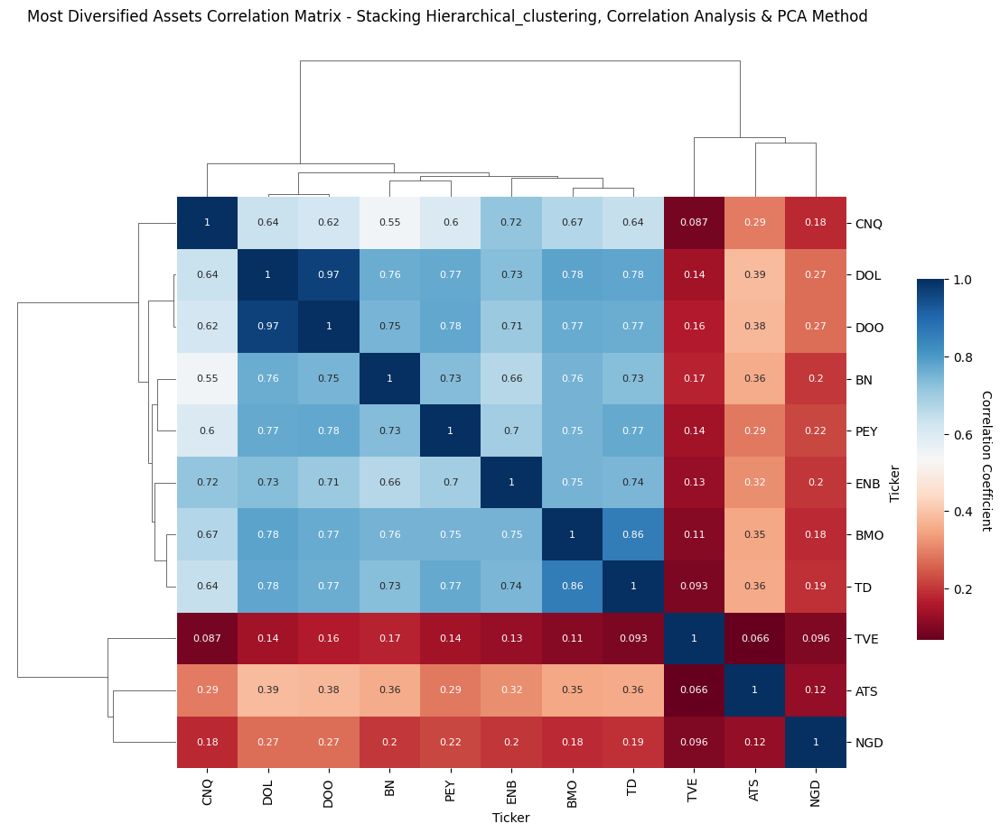

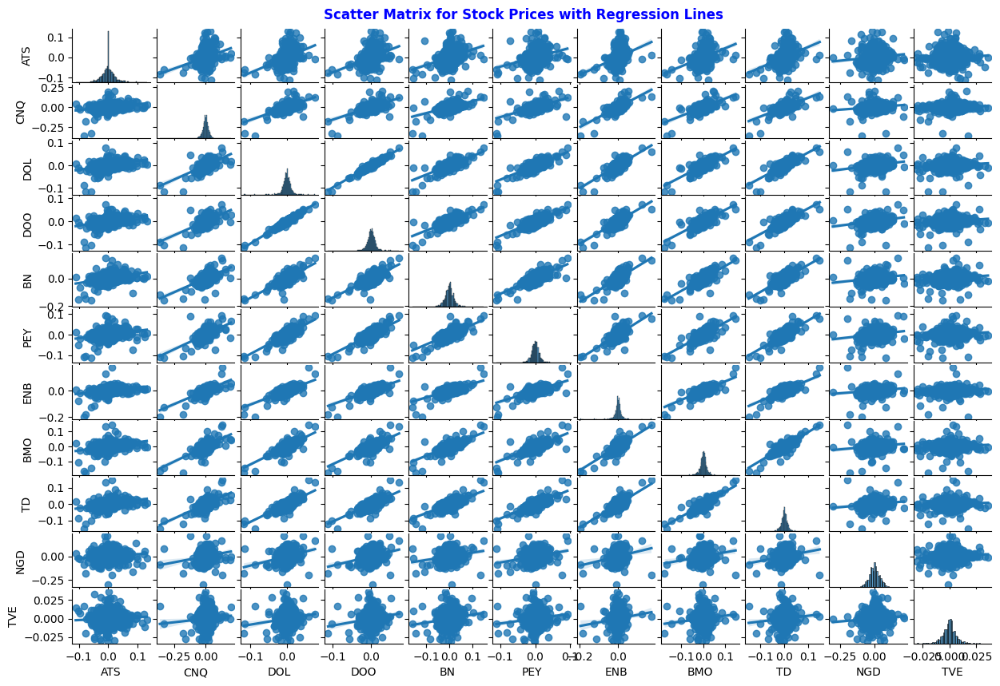

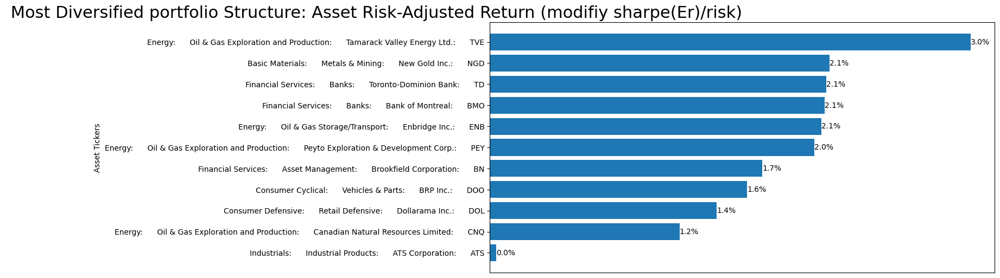

In [11]:
 #-------Data printing and recording --------------------------------------------------
warnings.filterwarnings("ignore")
print('\nInitial assets log returns\n')
display(log_returns)

plot_explained_variance_for_assets_selection(loadings_matrix_df, explained_variance)
print_explained_variance(loadings_matrix_df, explained_variance,cumulative_variance_treshold, num_components, threshold_for_highest_loadings)

print('\nMost Important Assets Log returns  using PCA\n')
display(most_important_assets_log_returns_df_PCA_method)
plotting_selected_assets_corr_mat_clustermap(most_important_assets_corr_matrix_PCA_method, 'Most Important Assets Correlation Matrix PCA Method')

print('\nMost Important Assets Log returns  using Correlation method\n')
display(selected_assets_log_return_df_correlation_method)
plotting_selected_assets_corr_mat_clustermap(selected_assets_log_return_Corr_matrix_correlation_method,
                                                 'Most Diversified Assets Correlation Matrix - Correlation Method')

print('\nMost Diversified Assets Log returns  using Stack Correlation Matrix/PCA Method\n')
display(most_diversify_portfolio_asset_log_return_df_stacking_PCA_and_corr)
plotting_selected_assets_corr_mat_clustermap(most_diversify_portfolio_assets_matrix_stacking_PCA_and_corr_method,
                                                 'Most Diversified Assets Correlation Matrix - stacking Correlation Analysis/PCA Method')

print('\nMost Diversified Assets Log returns  using Stacking Hierarchical Clustering, Correlation Analysis & PCA Method\n')
display(most_diversify_portfolio_assets_log_returns_df)
plotting_selected_assets_corr_mat_clustermap(most_diversify_portfolio_assets_corr_matrix,
                                                 'Most Diversified Assets Correlation Matrix - Stacking Hierarchical_clustering, Correlation Analysis & PCA Method')
print('\nDiversified Portfolio Assets Volatility \n')
display(selected_assets_volatility_df_stacking_corr_PCA_method)

plot_scatter_matrix(most_diversify_portfolio_assets_log_returns_df)

print('\nMost Diversified Portfolio arithmetics details\n')
display(most_divesified_portfolio_arihtmetics_df_details)
plot_portfolio_structure( most_divesified_portfolio_arihtmetics_df_details)






## **4. Asset Pricing, Profit & Loss simation and Risk Projection**
##### In  this section, we will focus on :
 - ##### Monte Carlo simulation of stock price using cov matrix and cholesky decomposition
 - ##### Profit & Lost simulation
 - ##### VaR/CVaR calculation under current macroeconomic factors
                            
Before going forward with our analysis, it is crucial to understand the form of the data distribution, here stock price and asset returns distribution over time in other to choose the appropriate model.
The daily adjust closed prices charts above show that the stock prices movement and their returns over time folow an independent random process, with stock prices always positive and ncrease indefinitely. The distribution exhibits positive skewnes.The future price movement doesn't depend on its history, but it is determined by  both its current state and some inherent randomness such as economic indicators, company performance, investor sentiment, geopolitical events, and unforeseen news. Therefore, the stock prices are considered stochastic. In general we don’t know the distribution of the stock prices, we only know that it is closed to the brownan motion stockastic process. Typically, the logarithm of the stock price follows a Brownian motion with drift.

Stochastic differential equation (SDE) of the stock price 𝑆(𝑡):
$$
dS(t) = \mu S(t) \, d(t) + \sigma S(t) \, dW(t)
$$
where:
- $dS(t)$  is the variation (absolute change) of the stock price over the time interval d(t)
- $\mu$ is the drift term (expected return),
- $\sigma$ is the volatility of the stock,
- $W(t)$ is a Wiener process (Geometric Brownian motion).

In a simple term, $dS(t) = S(t+d(t))$ , with $S(t)$ representing the stock price at the time $t$.
logarithmicly the continuous compounding return of the stock over the interval $d(t)$ is $ r(t) = \log\left(\frac{S(t+d(t))}{S(t)}\right)$.  
**The volatility** $\sigma$ is the square root of the variance. It provides a measure of the risk or uncertainty of the stock price. $\sigma$ is a key parameter of the Geometric Brownian motion that determines the stochastic variation of the stock price.  
**The variance** of the stock price over a given period is a measure of the magnitude of expected price fluctuations. It is the mathematical expectation of the squared deviation between the price and its mean.  
**$W(t)$ is a random variable  that follows a Wiener process.** It is the random component of the stock price movement and is related to the variation of time d(t). The mathematical expression of this relationship is : $dW(t)=\epsilon \sqrt{dt}$.
In this expression, the term "epsilon" represents a random variable whose distribution is normal with expected value of zero(mean zero) and variance equal 1. It's mathematical expection is $E(dW(t))=\sqrt{dt}E(epsilon)=0$ with the variance $Var(dW(t))=d(t)Var(epsilon)=d(t)$.  
The variations of $W(t)$ are independent over time. In the case the company associated with that stock does not distribute a portion of its profits to shareholders in the form of dividend payments,  the stochastic equation for the return of a stock is:$\frac{dS(t)}{S(t)} = \mu d(t) + \sigma dW(t)$.
Therefore, it makes sense that the return on a stock does not depend on the price of the stock.  


Let's now focus on the stochastic equation for the return. We will dig into this yow part : $\mu d(t) and \sigma dW(t)$.  
The first part, $\mu d(t)$, is deterministic meaning that, using the historical data, we can calculate the expected change in the stock price over the small time interval $dt$, assuming no randomness. Essentially, $mu$ is the expected rate of return per unit time, and when multiplied by the stock price $S(t)$ and the time interval $dt$, it gives the expected change in the stock price due to predictable factors like steady growth, interest rates, or dividends.  
Tthe second part, $\sigma dW(t)$, is the Stochastic or randomness part of the stock rate of return. It takes in to considaration the unpredictable fluctuations in the stock price due to various factors like market volatility, company-Specific news, or economic factors, geopolitical events,natural disasters and pandemic, investor behavior and sentiment, technological advances and disruptions, global economic interdependencies. The $dW(t)$ represents the random shock to the stock price, and $sigma$ scales this shock, making it more or less volatile. Let's look inside the solution of the stochatic equation of the stock price.

Quation1:
  $S(t) = S(0) \exp \left( \left(\mu - \frac{\sigma^2}{2}\right)t + \sigma W(t) \right)$

or in more details

Quation2:  $S(t) = S(0) \exp \left( \left(\mu - \frac{\sigma^2}{2}\right)dt + \sigma \phi \sqrt{dt} \right)$

In the equation2, the term $ \phi$ represent correlated normal distributions with standard deviation equal 1  and expected value of zero(mean zero). But from Geometric Brownian Motion prostective, the stock price movement is independent over time(uncorrelated) and follow a log-normal distribution with a mean of zero and a standard deviation that depends on the time interval dt. In order to come out of this situation, we will procide as follow:

- Calculate log returns of the stock prices
- Calculate the expected return, the variance and the volatility of each stock
- Calculate the variance-covariance matrix
- Calculate cholesky decomposition matrix.
- Simulate an uncorrelated random normal distribution with $mu = 0 and sigma = 1$(Z distribution)
- Apply the cholesky matrix to the uncorrelated random normal distribution(Z distribution) in order to get a correlated random normal normal distribution with with $mu = 0  and  sigma = 1$.
- Use correlated random normal normal distribution as input for the stock price function.

After then, we will simulate the portfolio Profit & Loss and finanly we will calculate the portfolio VaR(value at Rick and the CVaR(conditional Value at Risk)


#### Correlation - Covariance & Cholesky decomposition

- **Covariance**: Covariance measures the degree to which two variables (e.g., asset returns) move together. It tells us whether the returns of two assets tend to rise and fall together (positive covariance) or move in opposite directions (negative covariance). Zero Covariance means that there is  no linear relationship between the assets' returns. A mix of assets with low or negative covariances can reduce overall portfolio risk.
- **Mathematical Formula**:  
$$
  Cov(X, Y) = \frac{1}{n-1} \sum_{i=1}^{n} (X_i - \bar{X})(Y_i - \bar{Y})
$$
Where:

  - $( X_i )$ and $( Y_i )$ are the returns of assets $(X)$ and $(Y)$.
  - $( \bar{X} )$ and $( \bar{Y} )$ are the mean returns of $(X)$ and $(Y)$.  
  - \$( n )$ is the number of observations.  
  


 - **Correlation**: Correlation is a normalized version of covariance, which measures the strength and direction of the linear relationship between two variables (asset returns). Unlike covariance, correlation is dimensionless and always ranges between -1 and 1. Correlation is used to measure the degree of diversification in a portfolio. Combining assets with low or negative correlations can significantly reduce portfolio risk. Portfolio managers use correlation to understand how different assets are likely to behave relative to one another under various market conditions.

- **Mathematical Formula**:
$$
Correlation(X, Y) =
[
\frac{\text{Cov}(X, Y)}{\sigma_X \sigma_Y}
]
$$
Where:

  - $Cov(X, Y)$ is the covariance of $( X )$ and $( Y )$.
  - $( \sigma_X )$  and $( \sigma_Y )$ are the standard deviations of $( X )$ and $( Y )$.  
  
  
 - **Cholesky decomposition**: Cholesky decomposition is a mathematical technique used of decomposing a positive-definite matrix into the product of a lower triangular matrix and its transpose. We will use Cholesky decomposition methode to decompose  the covariance matrix into the product of a lower triangular matrix and its transpose(cholesky Matrix). This will help us to generate correlated asset returns and the stock price.

- **For a positive-definite matrix $( A )$, the Cholesky decomposition is expressed as:**
$$
A = LL^\top
$$
Where:


 - $( L )$ is a lower triangular matrix.
 - $( L^\top )$ is the transpose of $( L )$.  


 - **Suppose you have a covariance matrix of asset returns:**
$$
\Sigma = \begin{pmatrix}
\sigma_{11} & \sigma_{12} & \dots & \sigma_{1n} \\
\sigma_{21} & \sigma_{22} & \dots & \sigma_{2n} \\
\vdots & \vdots & \ddots & \vdots  \\
\sigma_{n1} & \sigma_{n2} & \dots & \sigma_{nn}
\end{pmatrix}
$$
The Cholesky decomposition would allow you to write:

$$\Sigma = LL^\top$$

Where:


 - \$( L )$ is used to generate correlated random variables from uncorrelated normal variables, which is essential for realistic financial simulations.  


&nbsp;&nbsp;&nbsp;&nbsp;The following is the process to predict the portfolio Value At RIsk(VaR and Conditional Valut At Risk(CVaR) using Monte Carlo Simulation  

 **1. Uncorrelated Normal Distribution Simulation**  
 &nbsp;&nbsp;&nbsp;&nbsp;An uncorrelated normal distribution describes a situation where random variables follow a normal distribution and have no linear relationship, resulting in a correlation of zero."


  &nbsp;&nbsp;&nbsp;&nbsp;**Why will we use uncorrelated normal distributions?**  As noted in the **Exploratory Data Analysis**, real-world stock prices move  
  &nbsp;&nbsp;&nbsp;&nbsp;independently and are non-stationary, meaning they generally increase over time, making the distribution time-dependent. Unlike normal  
  &nbsp;&nbsp;&nbsp;&nbsp;distributions, which are stationary, stock prices often show more extreme values, or 'fat tails,' indicating larger price changes than  
  &nbsp;&nbsp;&nbsp;&nbsp;a normal distribution would predict. Thus, uncorrelated normal distributions are used as a baseline to simulate real-world stock price  
  &nbsp;&nbsp;&nbsp;&nbsp;movements and to better undestand the tail risks. How to minimize the fat-tail risk?  
  
  
 **2. Correlated Normal Distribution using Cholrsky Decomposition**

 &nbsp;&nbsp;&nbsp;&nbsp;This problem can be solved by applying Cholesky Decomposition process to the asset covarience matrix and the uncorelated normal distributions of the asset log returns.  
  &nbsp;&nbsp;&nbsp;&nbsp;**Normal Distribution:** A symmetrical, bell-shaped distribution centered around the mean (μ), characterized by its mean and standard deviation (σ)  
 &nbsp;&nbsp;&nbsp;&nbsp;**Uncorrelated Variables:** Random variables with zero covariance, indicating no linear relationship. However, they are not necessarily independent unless normally distributed.


 **3. Daily Returns Simulation**  
    &nbsp;&nbsp;&nbsp;&nbsp;
    $Daily _returns = e^{\left( \left(\mu - \frac{\sigma^2}{2}\right)dt + \sigma \phi \sqrt{dt} \right)}$  
    &nbsp;&nbsp;&nbsp;&nbsp;In this formula $ \phi$ represent correlated normal distributions scaled by $sqrt{dt}$  
    
    
 **4. Future Stock Price Simulation**  

   &nbsp;&nbsp;&nbsp;&nbsp;$S(t) = S(0) \exp \left( \left(\mu - \frac{\sigma^2}{2}\right)dt + \sigma \phi \sqrt{dt} \right)$
   &nbsp;&nbsp;&nbsp;&nbsp; $S(0)$c is the initial asset price

 **5. Portfolio Price Simulation**

 &nbsp;&nbsp;&nbsp;&nbsp;P(t) is the sum of each asset's price multiplied by its weight. If there are 𝑛 assets, the portfolio price at time 𝑡  is calculated by adding up the weighted prices of all the assets.

 &nbsp;&nbsp;&nbsp;&nbsp;$( P(t) = \sum_{i=1}^{n} w_i S_i(t)$  

 &nbsp;&nbsp;&nbsp;&nbsp;Where:  
 &nbsp;&nbsp;&nbsp;&nbsp;$w_i$ is the weight of asset 𝑖 in the portfolio  
 &nbsp;&nbsp;&nbsp;&nbsp;$S_i(t)$ is the simulated price of asset𝑖 at time𝑡.

 **6. Portflio Profit & Loss Simulation**  
 &nbsp;&nbsp;&nbsp;&nbsp;Tthe Portflio Profit & Loss Simulation difference between the current asset prices and their initial prices, multiplied by their respective weights, to get the overall portfolio P&L.

 &nbsp;&nbsp;&nbsp;&nbsp;$\text{P&L}(t) = \sum_{i=1}^{n} w_i \times S_i(t) - S_i(0)$
 &nbsp;&nbsp;&nbsp;&nbsp;Where:  

 &nbsp;&nbsp;&nbsp;&nbsp;$\text{P&L}(t)$ is the profit or loss of the portfolio at time  
 &nbsp;&nbsp;&nbsp;&nbsp;$wi$ is the weight of asset 𝑖 in the portfolio.  
 &nbsp;&nbsp;&nbsp;&nbsp;𝑆 (t) is the price of asset 𝑖 at time 𝑡.  
 &nbsp;&nbsp;&nbsp;&nbsp;𝑆𝑖(0) is the initial price of asset 𝑖 (at time 0).  
 &nbsp;&nbsp;&nbsp;&nbsp;𝑛 is the number of assets in the portfolio

 **7. VaR and CVaR calculation**  

 - &nbsp;&nbsp;&nbsp;&nbsp;VaR representing the maximum loss at a given confidence level  
 &nbsp;&nbsp;&nbsp;&nbsp;$\text{VaR}_\alpha = - \inf \{ x \in \mathbb{R} : F(x) > \alpha \}$  
 &nbsp;&nbsp;&nbsp;&nbsp;Where:  
 &nbsp;&nbsp;&nbsp;&nbsp;$\alpha$ is the confidence level (e.g., 0.95 or 0.99).  
 &nbsp;&nbsp;&nbsp;&nbsp;$F(x)$ is the cumulative distribution function of portfolio losses.

 - &nbsp;&nbsp;&nbsp;&nbsp;CVaR providing the average of the losses exceeding VaR.  
  &nbsp;&nbsp;&nbsp;&nbsp;$\text{CVaR}_\alpha = \mathbb{E}[ X | X \leq \text{VaR}_\alpha ]$  
  &nbsp;&nbsp;&nbsp;&nbsp;Where:  
  &nbsp;&nbsp;&nbsp;&nbsp;$\mathbb{E}[ X | X \leq \text{VaR}_\alpha ]$is the expected loss given that the loss $𝐿$ exceeds the $VaR$ at confidence level $α$.





 Uncorrelated normal Z simulation



,ATS,CNQ,DOL,DOO,BN,PEY,ENB,BMO,TD,NGD,TVE
0,-0.612848,0.006579,-1.008127,0.833816,0.723192,0.526115,2.178964,-0.172713,-0.721307,-0.394360,1.677881
1,-0.299148,-0.984976,1.823199,0.443657,0.686429,0.196573,0.289669,0.693486,1.174488,0.381721,-0.430786
2,0.360258,1.882572,0.530491,0.385854,-0.890047,-1.307576,-2.399449,0.902628,0.415141,-1.395921,-1.523042
3,-0.280589,0.444868,1.351454,-1.076878,0.118455,-0.152401,0.519175,-1.342234,-0.353093,0.487734,0.610341
4,-0.484664,0.061354,-0.515542,-0.300994,-0.144958,1.593814,-1.533536,0.834698,0.398715,0.916438,1.574010
...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.691005,1.940263,0.172664,0.747024,0.684650,-0.500317,-0.381570,-1.372375,-0.236524,-0.616301,2.023322
9996,0.226724,1.574772,0.195096,1.602550,-1.906558,1.271251,-0.632921,1.931458,0.142892,-0.292148,-0.603149
9997,2.326661,0.031186,-0.262626,0.059399,0.258416,0.147255,1.004838,2.335500,-0.110422,1.561664,0.540547
9998,-0.629571,-1.403637,-0.652651,-0.518906,-0.222027,2.681121,-1.213785,-1.123873,-0.348484,0.340312,-0.220173



Correlated Normal Z distribution



,ATS,CNQ,DOL,DOO,BN,PEY,ENB,BMO,TD,NGD,TVE
0,-0.014644,-0.005256,-0.011898,-0.009047,-0.005150,-0.001851,0.015319,-0.004351,-0.008822,-0.026028,0.011900
1,-0.007148,-0.031626,0.008431,0.009372,0.017939,0.008617,0.002555,0.012606,0.018054,0.020199,-0.001975
2,0.008608,0.058566,0.019002,0.019353,0.016238,0.007206,-0.001997,0.024520,0.019613,-0.041414,-0.010451
3,-0.006705,0.010588,0.013800,0.010134,0.018377,0.009447,0.016753,0.001778,0.004819,0.034900,0.005381
4,-0.011581,-0.002505,-0.006502,-0.007130,-0.011439,0.007211,-0.017806,0.000867,0.001499,0.030054,0.009259
...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.016511,0.050915,0.011235,0.012894,0.027208,0.012795,0.016084,0.006399,0.008186,-0.010902,0.015725
9996,0.005417,0.048327,0.013309,0.017389,-0.005445,0.022446,0.012258,0.033934,0.024543,0.000493,-0.004169
9997,0.055595,0.021604,0.008764,0.008677,0.020102,0.010276,0.022771,0.039550,0.024472,0.068820,0.004524
9998,-0.015043,-0.046876,-0.018174,-0.018956,-0.030871,0.002572,-0.031080,-0.033391,-0.024615,0.001173,-0.002940



Daily returns simulation



,ATS,CNQ,DOL,DOO,BN,PEY,ENB,BMO,TD,NGD,TVE
0,0.999861,1.000292,1.000038,0.999962,1.000088,1.000173,1.000488,1.000045,0.999949,0.998680,1.000061
1,1.000040,0.999482,1.000285,1.000183,1.000610,1.000327,1.000264,1.000362,1.000401,1.000677,0.999966
2,1.000416,1.002255,1.000413,1.000303,1.000572,1.000306,1.000184,1.000585,1.000427,0.998016,0.999907
3,1.000051,1.000779,1.000350,1.000192,1.000620,1.000339,1.000513,1.000160,1.000178,1.001312,1.000016
4,0.999934,1.000376,1.000103,0.999985,0.999946,1.000306,0.999907,1.000143,1.000123,1.001103,1.000043
...,...,...,...,...,...,...,...,...,...,...,...
9995,0.999816,1.002019,1.000319,1.000226,1.000820,1.000389,1.000502,1.000246,1.000235,0.999333,1.000087
9996,1.000340,1.001940,1.000344,1.000280,1.000081,1.000530,1.000434,1.000762,1.000510,0.999825,0.999950
9997,1.001540,1.001117,1.000289,1.000175,1.000659,1.000351,1.000619,1.000867,1.000509,1.002781,1.000010
9998,0.999851,0.999013,0.999962,0.999843,0.999507,1.000238,0.999674,0.999502,0.999684,0.999854,0.999959



Future stock price simulation



,ATS,CNQ,DOL,DOO,BN,PEY,ENB,BMO,TD,NGD,TVE
0,13.798079,10.025536,38.653754,36.038935,27.739898,14.668041,25.520366,58.630055,46.112439,1.228376,22.430606
1,13.800551,10.017416,38.663291,36.046911,27.754380,14.670299,25.514651,58.648660,46.133263,1.230832,22.428463
2,13.805748,10.045213,38.668251,36.051233,27.753313,14.669995,25.512613,58.661737,46.134471,1.227560,22.427154
3,13.800697,10.030417,38.665811,36.047240,27.754655,14.670478,25.521008,58.636779,46.123007,1.231614,22.429599
4,13.799089,10.026383,38.656286,36.039765,27.735954,14.669996,25.505537,58.635780,46.120434,1.231357,22.430198
...,...,...,...,...,...,...,...,...,...,...,...
9995,13.797464,10.042852,38.664607,36.048436,27.760196,14.671200,25.520708,58.641850,46.125616,1.229179,22.431197
9996,13.804695,10.042053,38.665580,36.050383,27.739712,14.673282,25.518995,58.672072,46.138292,1.229785,22.428124
9997,13.821256,10.033812,38.663448,36.046610,27.755737,14.670657,25.523703,58.678237,46.138237,1.233421,22.429467
9998,13.797948,10.012724,38.650811,36.034645,27.723773,14.668995,25.499597,58.598205,46.100206,1.229821,22.428314


initial_portfolio_prices


294.82752084732056


Simulated Portfolio Prices - Profit & Lost


,simulated_portfolio_price,Simulated Portfolio Profit & Lost
0,294.846086,0.018565
1,294.908717,0.081197
2,294.957287,0.129766
3,294.911305,0.083784
4,294.850779,0.023258
...,...,...
9995,294.933304,0.105783
9996,294.962973,0.135452
9997,294.994585,0.167064
9998,294.745038,-0.082483


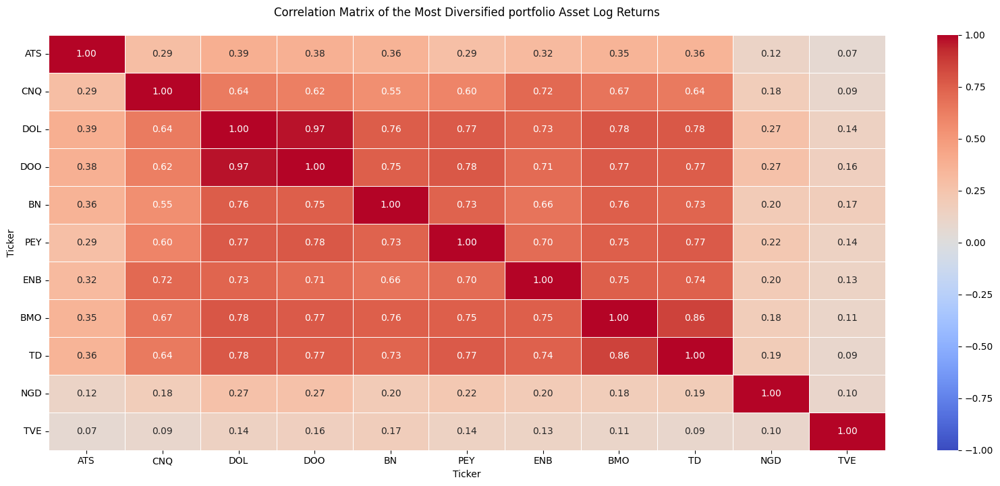

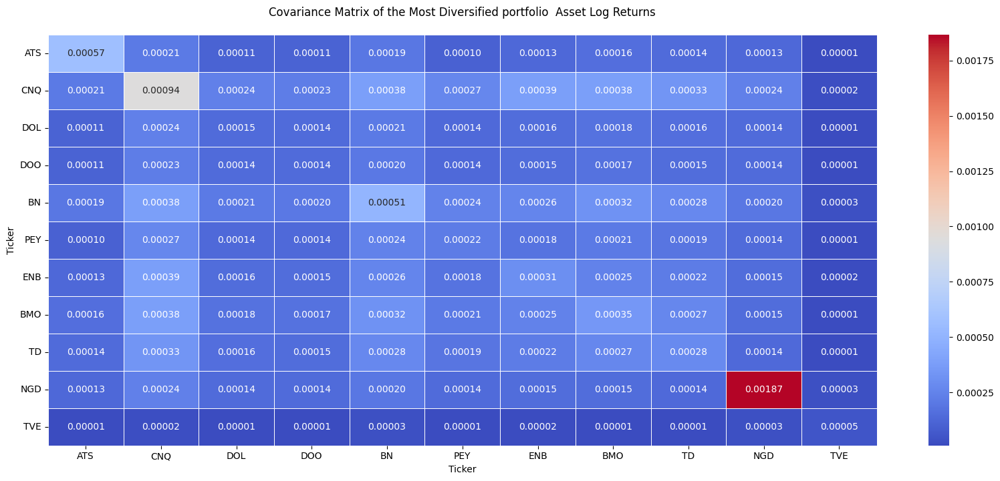

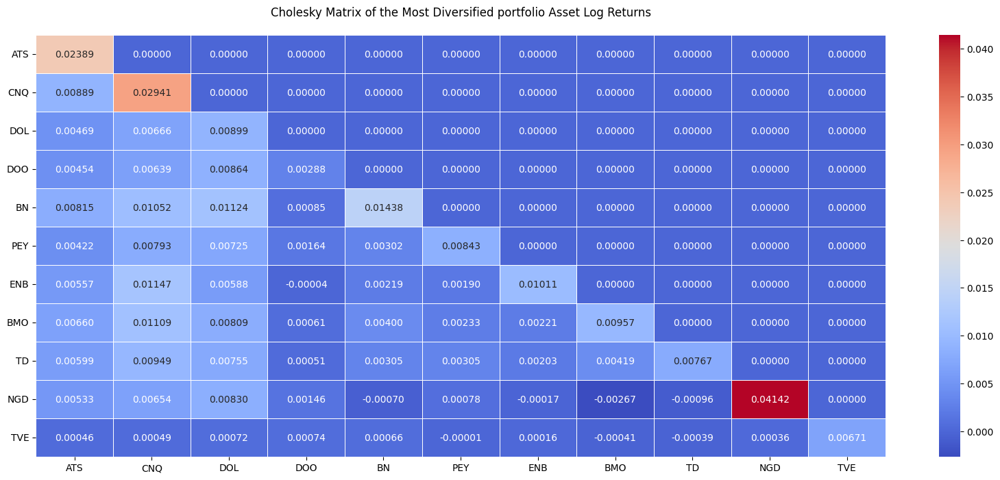

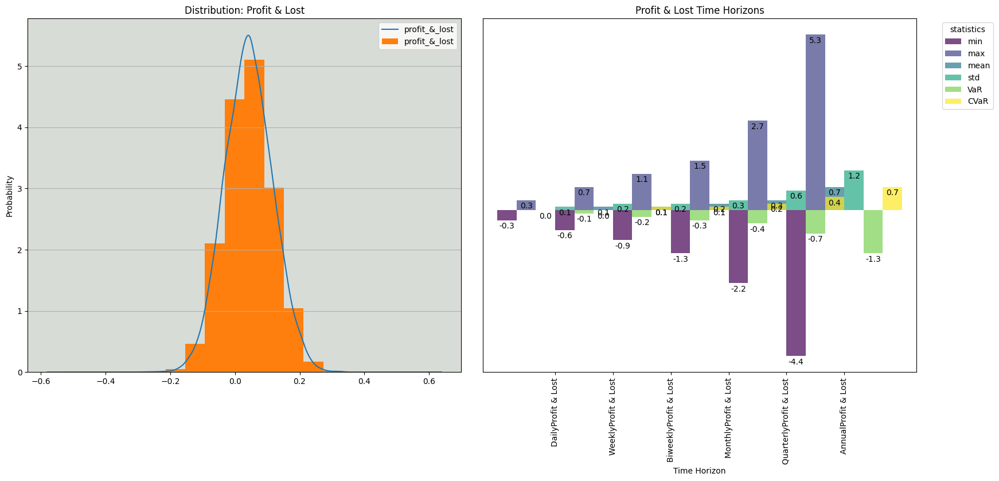

,DailyProfit & Lost,WeeklyProfit & Lost,BiweeklyProfit & Lost,MonthlyProfit & Lost,QuarterlyProfit & Lost,AnnualProfit & Lost
min,-0.3,-0.6,-0.9,-1.3,-2.2,-4.4
max,0.3,0.7,1.1,1.5,2.7,5.3
mean,0.0,0.1,0.1,0.2,0.3,0.7
std,0.1,0.2,0.2,0.3,0.6,1.2
VaR,-0.1,-0.2,-0.3,-0.4,-0.7,-1.3
CVaR,0.0,0.1,0.1,0.2,0.4,0.7


In [12]:
def plotting_heatmap_for_correlation_matrix(log_returns, title):
    plt.figure(figsize=(20, 8))
    #sns.heatmap(log_returns.corr(), annot=True)
    sns.heatmap(log_returns.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5, fmt=".2f")
    plt.yticks(rotation=360)
    plt.title(title, pad= 20)

def plotting_heatmap_for_covariance_matrix(covariance_matrix, title):
    plt.figure(figsize=(20, 8))
    sns.heatmap(covariance_matrix, annot=True, cmap='coolwarm', fmt=".5f",
            linewidths=0.5, vmin=covariance_matrix.min().min(), vmax=covariance_matrix.max().max())
    plt.yticks(rotation=360)
    plt.title(title, pad= 20)


def variance_covariance_matrix(log_returns):
    return log_returns.cov()


#-----------------------------------------------------------------------------------------------------------------------------------------------
#create cholesky matrice: let's apply cholesky decomposition to the covarience matrix
# Input: covarience matrice
# output: cholesky matrice data frame
#------------------------------------------------------------------------------------------------------------------------------------------------
def create_cholesky_matrix(covar_mat):
    cholesky_matrix_data = np.linalg.cholesky(covar_mat)
    return pd.DataFrame(cholesky_matrix_data[0:,0:], columns=covar_mat.columns.tolist(), index=covar_mat.columns.tolist())



#--------------------------------------------------------------------------------------------------------
# here let's simulate 10000 uncorelated normal distribution  iterations to calculate the stock price.
#input:covariance matrice and number of iteration
#output 10000 Z score for each stock price: uncorelated normal z core array and  it's  data frame
# here we simulate 10000 uncorelated normal distribution  iterations to calculate the stock price.
#t_intervals = 250
#number_of_assets = len(covar_mat.columns.tolist())
#Z = norm.ppf(np.random.rand(iterations,number_of_assets ))
#--------------------------------------------------------------------------------------------------------
def simulate_uncorelated_normal_distribution(covar_mat,iterations):
    number_of_assets = len(covar_mat.columns.tolist())
    #z score array
    Z = norm.ppf(np.random.rand(iterations,number_of_assets ))
    Z_df = pd.DataFrame(data=Z[0:,0:],index=[i for i in range(Z.shape[0])], columns=covar_mat.columns.tolist())
    return Z,Z_df

#-----------------------------------------------------------------------------------------------------
#Description: generate correlated normal distribution using transposed cholesky matrix and uncorelated
#normal Z score distribution
#=MMULT(unCorrelated_normal_distribution,TRANSPOSE(cholesky_matrix))
#------------------------------------------------------------------------------------------------------
def generate_correlated_normal_distribution(cholesky_matrix_data_df,Z):
    Correlated_Normals_Z = np.matmul(Z, cholesky_matrix_data_df.T)
    Correlated_Normals_Z_arr = np.array(Correlated_Normals_Z)
    return Correlated_Normals_Z, Correlated_Normals_Z_arr

#--------------------------------------------------------------------------------------------------------------
#Description: Daily returns simulation (returns simulation = 𝒆^(((𝝁𝒊−(𝟏/𝟐)𝝈𝒊𝟐)(𝒕𝟐−𝒕𝟏)+𝝈𝒊√((𝒕𝟐−𝒕𝟏) ) 𝝓)))
#Inputs:
#   𝝓 : Correlated_Normals_Z
#   𝝓_arr : Correlated_Normals_Z_array
#   𝝁 : log_returns.mean()
#   variance: log_returns.var()
#   𝝈 : log_returns.std()
#   𝓢1 : initial_prices
#   delta_t = 1
#output:
 #--------------------------------------------------------------------------------------------------------------
def simulate_daily_returns(𝝓,𝝓_arr, 𝝁,𝝈,delta_t):
    daily_returns_list_df = np.zeros_like(𝝓_arr)
    daily_returns_list_df = np.exp((𝝁 - 0.5 * 𝝈** 2) * delta_t + 𝝈* delta_t ** 0.5 *𝝓)
    return daily_returns_list_df

#--------------------------------------------------------------------------------------------------------------------------
# Description: Stock price simulation
def stock_prices_simulation(initial_prices,daily_returns_list_df ):
    𝓢1_list = []
    𝓢1_list = initial_prices.values
    expo_r = daily_returns_list_df
    future_stock_price_list_df= pd.DataFrame(data=daily_returns_list_df[0:0:],
                                             index=[i for i in range(daily_returns_list_df.shape[0])],
                                             columns=expo_r.columns.tolist())
    for (index, column) in enumerate(expo_r):
        future_stock_price_list_df[column] = pd.DataFrame(data=𝓢1_list[index]*expo_r[column].values)
    return future_stock_price_list_df


    #Initial portfolio price
def calculate_initial_portfolio_price(𝓢1):
    return 𝓢1.values.sum()

#Portfolio price simulation
def simulated_portfolio_price(future_stock_price_df):
    simulated_portfolio_price_row_sum = []
    for i in range(len(future_stock_price_df)):
        simulated_portfolio_price_row_sum.append(future_stock_price_df.iloc[i].sum())
    simulated_portfolio_price_df = pd.DataFrame(data = simulated_portfolio_price_row_sum, columns=['portfolio_prices'])
    return simulated_portfolio_price_df

#-----------------------------------------------------------------------------------------------------------
#Description: Portfolio Profit and loss calculation
# input:simulated_portfolio_price_df,portfolio_initial_price
# output :portfolio_profit_and_loss_df
#-----------------------------------------------------------------------------------------------------------
def calculate_prtfolio_profit_and_loss(simulated_portfolio_price_df, portfolio_initial_price):
    portfolio_profit_and_loss_df = simulated_portfolio_price_df - portfolio_initial_price
    portfolio_profit_and_loss_df.columns = ['profit_&_lost']
    return portfolio_profit_and_loss_df

def set_portfolio_price_profit_and_Loss_simulation_df(simulated_portfolio_price_df, portfolio_profit_and_loss_df):
    return  pd.DataFrame({'simulated_portfolio_price': simulated_portfolio_price_df['portfolio_prices'].values,
                          'Simulated Portfolio Profit & Lost': portfolio_profit_and_loss_df['profit_&_lost'].values})


#-------------------------------------------------------------------------------------------------------------------------
# Description:sorting profit and loss ascendante; confifence level rank; Var calculation;CVar calculation
# Input:
# Output:
#-------------------------------------------------------------------------------------------------------------------------

def calculate_portfolio_Var_and_CVar(portfolio_profit_and_loss_df, confidence_level):
    #sorting profit and loss ascendante
    lportfolio_profit_and_loss_df = portfolio_profit_and_loss_df.sort_values(by='profit_&_lost', ascending=True)
    lportfolio_profit_and_loss_df = portfolio_profit_and_loss_df.reset_index(drop=True)
    #confifence level rank ( 95% confidence lavel)
    rank = int((1-confidence_level)*len(lportfolio_profit_and_loss_df))-1
    #Var calculation
    VaR = portfolio_profit_and_loss_df.iloc[rank]['profit_&_lost']
    #CVar calculation
    port_folio_lost_beyond_VaR = portfolio_profit_and_loss_df[:rank]
    CVaR = np.average(port_folio_lost_beyond_VaR)
    return VaR, CVaR

#--------------------------------------------------------------------------------------------------------------------------
#Decription: Profit and loss summary statistics. Minimum lost, maximum lost, mean(moderate lost)lost standart deviation,
#            Value at risk(Var),Conditional value-at-risk (CVaR)
#Input :portfolio_profit_and_loss_df,VaR,CVaR
#Output:
#--------------------------------------------------------------------------------------------------------------------------
def profit_and_loss_summary_statistics(portfolio_profit_and_loss_df,VaR,CVaR):
    VaR_and_CVaR_df = pd.DataFrame([{'VaR':VaR, 'CVaR':CVaR}]).transpose()
    VaR_and_CVaR_df = VaR_and_CVaR_df.rename(columns={0:'profit_&_lost'})
    portfolio_profit_and_loss_stat_df =  portfolio_profit_and_loss_df.agg(['min', 'max', 'mean', 'std'])
    return pd.concat([portfolio_profit_and_loss_stat_df,VaR_and_CVaR_df], ignore_index=False)

# Plot a histogram
def profit_lost_summary(p_portfolio_profit_and_loss_df, p_portfolio_profit_and_loss_time_horizons_df):
    fig, ax = plt.subplots(1,2, figsize=(20, 8))
    p_portfolio_profit_and_loss_df.plot.kde(ax=ax[0], legend=True, title='Distribution: Profit & Lost')
    p_portfolio_profit_and_loss_df.plot.hist(density=True, ax=ax[0])
    ax[0].set_ylabel('Probability')
    ax[0].grid(axis='y')
    ax[0].set_facecolor('#d8dcd6')

    bars = p_portfolio_profit_and_loss_time_horizons_df.plot(kind='bar', ax=ax[1], colormap='viridis', alpha=0.7, width=2, title='Profit & Lost Time Horizons')

    # Customize the plot
    #ax.set_title('Marks by Period for Each Student')
    ax[1].set_xlabel('Time Horizon')
    ax[1].set_ylabel('Value')
    ax[1].grid( axis='y')
    ax[1].spines['top'].set_visible(True)
    ax[1].spines['right'].set_visible(True)
    ax[1].spines['bottom'].set_visible(True)
    ax[1].spines['left'].set_visible(True)
    ax[1].axes.get_yaxis().set_visible(False)


    # Display bar values on top of each bar
    for bar in bars.patches:
        height = bar.get_height()
        ax[1].text(
        bar.get_x() + bar.get_width() / 2,  # x-coordinate
        height - 0.3,                            # y-coordinate
        f'{height}',                       # text
        ha='center',                       # horizontal alignment
        va='bottom'                        # vertical alignment
         )

    ax[1].legend(title='statistics', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.subplots_adjust(wspace=0.05)
    plt.show()


def portfolio_profit_and_loss_time_horizons_df(p_portfolio_daily_profit_and_loss_df):

    time_horizons = {
    'Daily': 1,
    'Weekly': 5,
    'Biweekly': 10,
    'Monthly': 21,
    'Quarterly': 63,
    'Annual': 252
    }
    portfolio_profit_and_loss_time_horizons_list = []
    portfolio_profit_and_loss_time_horizons_df =pd.DataFrame()
    for horizon, days in time_horizons.items():
        portfolio_profit_and_loss_time_horizons_list = []
        for value in p_portfolio_daily_profit_and_loss_df['profit_&_lost']:
            scaling_factor = np.sqrt(days)
            portfolio_profit_and_loss_time_horizons_list.append(round(value * scaling_factor,1))
        portfolio_profit_and_loss_time_horizons_df[[ horizon + 'Profit & Lost']] =pd.DataFrame({ horizon + 'Profit & Lost': portfolio_profit_and_loss_time_horizons_list})
    portfolio_profit_and_loss_time_horizons_df.index = p_portfolio_daily_profit_and_loss_df.index
    portfolio_profit_and_loss_time_horizons_df = portfolio_profit_and_loss_time_horizons_df.rename(index={'Statistics': portfolio_profit_and_loss_time_horizons_df.index})
    return portfolio_profit_and_loss_time_horizons_df


def summary_statistics_graph_and_table(portfolio_profit_and_loss_df,portfolio_profit_and_loss_time_horizons_df):
    profit_lost_summary(portfolio_profit_and_loss_df,portfolio_profit_and_loss_time_horizons_df)
    profit_and_loss_summary_statistics_df = profit_and_loss_summary_statistics(portfolio_profit_and_loss_df,VaR,CVaR)
    display(portfolio_profit_and_loss_time_horizons_df.T)


#-------------------------------------------------------Data Setting----------------------------------------------------------
covar_mat = variance_covariance_matrix(most_diversify_portfolio_assets_log_returns_df)
cholesky_matrix_data_df = create_cholesky_matrix(covar_mat)

#daily_returns_list_df = simulate_daily_returns(Correlated_Normals_Z,Correlated_Normals_Z_arr, log_returns.mean(),log_returns.std(),1)
Z, Z_df = simulate_uncorelated_normal_distribution(covar_mat,10000)
Correlated_Normals_Z, Correlated_Normals_Z_arr= generate_correlated_normal_distribution(cholesky_matrix_data_df,Z)

daily_returns_df = simulate_daily_returns(Correlated_Normals_Z,Correlated_Normals_Z_arr,
                                               most_diversify_portfolio_assets_log_returns_df.mean(),
                                               most_diversify_portfolio_assets_log_returns_df.std(),1)


future_stock_price_df = stock_prices_simulation(most_diversify_portfolio_assets_initial_prices,daily_returns_df)

simulated_portfolio_price_df= simulated_portfolio_price(future_stock_price_df)
initial_portfolio_prices = calculate_initial_portfolio_price(most_diversify_portfolio_assets_initial_prices)
portfolio_profit_and_loss_df = calculate_prtfolio_profit_and_loss(simulated_portfolio_price_df, initial_portfolio_prices)

simulated_portfolio_price_profit_and_Loss_df = set_portfolio_price_profit_and_Loss_simulation_df(simulated_portfolio_price_df,
                                                                                                portfolio_profit_and_loss_df)
VaR, CVaR = calculate_portfolio_Var_and_CVar(portfolio_profit_and_loss_df, 0.95)
profit_and_loss_summary_statistics_df = profit_and_loss_summary_statistics(portfolio_profit_and_loss_df,VaR,CVaR)
portfolio_profit_and_loss_time_horizons_df = portfolio_profit_and_loss_time_horizons_df(profit_and_loss_summary_statistics_df)


#----------------------------------------------------------Data Printing ----------------------------------------------------
plotting_heatmap_for_correlation_matrix(most_diversify_portfolio_assets_log_returns_df,
                                        'Correlation Matrix of the Most Diversified portfolio Asset Log Returns')
plotting_heatmap_for_covariance_matrix(covar_mat, 'Covariance Matrix of the Most Diversified portfolio  Asset Log Returns')
plotting_heatmap_for_covariance_matrix(cholesky_matrix_data_df, 'Cholesky Matrix of the Most Diversified portfolio Asset Log Returns')
print('\n Uncorrelated normal Z simulation\n')
display(Z_df)
print('\nCorrelated Normal Z distribution\n')
display(Correlated_Normals_Z)
print('\nDaily returns simulation\n')
display(daily_returns_df)
print('\nFuture stock price simulation\n')
display(future_stock_price_df)
print('initial_portfolio_prices')
display(initial_portfolio_prices)
print('\nSimulated Portfolio Prices - Profit & Lost')
display(simulated_portfolio_price_profit_and_Loss_df)
summary_statistics_graph_and_table(portfolio_profit_and_loss_df, portfolio_profit_and_loss_time_horizons_df.T)



## A Portfolio Optimization Model
Portfolio optimization involves determining the most effective asset allocation to achieve specific investment objectives, typically aiming to maximize returns while minimizing risk.
In this section, we will calculate the portefolio expected return and volatility. We will then use Monte Carlo method to simulate 10000 trials the portefolio expected return and volatility. We will generate 10000 random portfolios with different asst allocations. we will plot these portfolios on a risk-return graph to create the Random Efficient Frontier.
Our aim here is to select the optimal portfolios. Portfolios with the highest expected return and minimal risk. In order to achieve this, will use machine learning techniques to approximate a 2 degree polynomial function that perfectly fit the uper-bound of the random efficient frontier plot. Finally, we will combined K-means clustering technique with efficient frontier modeling to dig into the random generated portfolios and predict different type of investment risk tolerance(very conservative, conservative, moderate, aggressive and very aggressive)



#### Portfolio Expected Return and Volatility Simulation - Random Efficient Frontier

In [13]:
def portfolio_random_weight_array_df(assets_returns_df):
    #random portfolio weigh simulation
    number_of_assets = len(assets_returns_df.columns.tolist())
    random_array = np.random.rand(1,number_of_assets )
    random_array_df = pd.DataFrame(random_array, columns = assets_returns_df.columns.tolist())
    random_weight_df = random_array_df/random_array_df.values.sum()
    return random_weight_df

def portfolio_expected_Return(random_weight_df,log_returns):
    assets_expected_returns = log_returns.mean()
    weited_expected_returns = assets_expected_returns * random_weight_df
    portfolio_expected_return_ = weited_expected_returns.values.sum()
    return 100*portfolio_expected_return_

def  portfolio_volatility(varcovar,w):
    transpose_w = w.T
    σp = np.sqrt(np.matmul(np.matmul(w,varcovar),w.T))
    return 100*σp[0][0]


In [14]:
def efficient_frontiere_plot(portfolio_trails_simulation_df):
    display(portfolio_trails_simulation_df)
    #fig, ax = plt.subplots()
    portfolio_trails_simulation_df.plot(x='σp', y='E_rp', kind='scatter', figsize=(10, 6));
    plt.xlabel('Expected Volatility')
    plt.ylabel('Expected Return')
    plt.title('Random portfolios Efficient Frontier')

#efficient_frontiere_plot(portfolio_trails_simulation_df)

In [15]:
def generate_excess_return(log_returns_df):
    𝝁 = log_returns_df.mean()
    𝝁_list = []
    𝝁_list = 𝝁.values
    X_df= pd.DataFrame(data=log_returns_df[0:0:],
                       index=log_returns_df.index.to_list(), #[i for i in range(log_returns_df.shape[0])],
                       columns=log_returns_df.columns.tolist())

    assets_list = log_returns_df.columns.tolist()
    for index in range(len(assets_list)):
            X_df[assets_list[index]] =  log_returns_df[assets_list[index]].values - 𝝁_list[index]
    return X_df

#Portfolio Statistics
def portfolio_arihtmetics(log_returns_df,index_adj_close_price_df):
    return pd.DataFrame({'mu expected_return':log_returns_df.mean(),
                        'variance':log_returns_df.var(),
                        'Sigmas(volatilities)':log_returns_df.std(),
                        'modifiy shape(Er)/𝝈':log_returns_df.mean()/log_returns_df.std(),
                        'initial price':index_adj_close_price_df.iloc[0]}).transpose()


def excess_return_varcovar(X_df):
    return X_df.cov()

def get_uncorrelated_assets_index_adj_close_price_df(index_adj_close_price_df, uncorrelated_assets_list):
    return index_adj_close_price_df[uncorrelated_assets_list]



In [16]:

def uncorelated_portfolio_trails_simulation(log_returns, most_diversify_portfolio_assets_list, trial):

    σp_list = []
    E_rp_list = []
    random_weight_array_df_rows_list = []
    excess_return_df = generate_excess_return(log_returns[most_diversify_portfolio_assets_list])

    for i in  range(0, trial):
        #random_weight_array_df = portfolio_random_weight_array_df(uncorrelated_assets_returns_log_returns_df(log_returns,
        #                                                                                most_diversify_portfolio_assets_list))
        random_weight_array_df = portfolio_random_weight_array_df(log_returns[most_diversify_portfolio_assets_list])

        random_weight_array_df_rows_list.append(random_weight_array_df)

        E_rp_list.append(portfolio_expected_Return(random_weight_array_df,log_returns[most_diversify_portfolio_assets_list]))

        σp_list.append(portfolio_volatility(excess_return_varcovar(excess_return_df),random_weight_array_df))

    uncorelated_portfolio_trails_simulation_df =  pd.DataFrame({'σp':σp_list,'E_rp':E_rp_list}, index=[i for i in range(0,trial)])
    σp = uncorelated_portfolio_trails_simulation_df['σp']
    E_rp = uncorelated_portfolio_trails_simulation_df['E_rp']
    sharpes_rat = E_rp/σp
    uncorelated_portfolio_trails_simulation_sharpes_ratio_df = pd.DataFrame({'σp':σp,'E_rp':E_rp,'sharpes_ratio':sharpes_rat})

    random_weight_array_all_rows_df = pd.concat(random_weight_array_df_rows_list, axis=0,ignore_index=True)
    uncorrelated_weighted_portfolio_trails_simulation_df = uncorelated_portfolio_trails_simulation_sharpes_ratio_df.merge(random_weight_array_all_rows_df,
                                                                                                                         left_index=True, right_index=True)

    return uncorelated_portfolio_trails_simulation_df,uncorelated_portfolio_trails_simulation_sharpes_ratio_df, \
                                        random_weight_array_all_rows_df,uncorrelated_weighted_portfolio_trails_simulation_df


,ATS,CNQ,DOL,DOO,BN,PEY,ENB,BMO,TD,NGD,TVE
ATS,0.000571,0.000212,0.000112,0.000109,0.000195,0.000101,0.000133,0.000158,0.000143,0.000127,0.000011
CNQ,0.000212,0.000944,0.000238,0.000228,0.000382,0.000271,0.000387,0.000385,0.000332,0.000240,0.000018
DOL,0.000112,0.000238,0.000147,0.000142,0.000209,0.000138,0.000155,0.000178,0.000159,0.000143,0.000012
DOO,0.000109,0.000228,0.000142,0.000144,0.000204,0.000137,0.000149,0.000172,0.000154,0.000142,0.000014
BN,0.000195,0.000382,0.000209,0.000204,0.000511,0.000244,0.000264,0.000319,0.000278,0.000197,0.000027
PEY,0.000101,0.000271,0.000138,0.000137,0.000244,0.000216,0.000180,0.000207,0.000191,0.000141,0.000014
ENB,0.000133,0.000387,0.000155,0.000149,0.000264,0.000180,0.000308,0.000247,0.000220,0.000152,0.000015
BMO,0.000158,0.000385,0.000178,0.000172,0.000319,0.000207,0.000247,0.000350,0.000270,0.000149,0.000014
TD,0.000143,0.000332,0.000159,0.000154,0.000278,0.000191,0.000220,0.000270,0.000282,0.000139,0.000011
NGD,0.000127,0.000240,0.000143,0.000142,0.000197,0.000141,0.000152,0.000149,0.000139,0.001867,0.000029


,σp,E_rp,sharpes_ratio,ATS,CNQ,DOL,DOO,BN,PEY,ENB,BMO,TD,NGD,TVE
0,1.378034,0.037425,0.027158,0.027904,0.099569,0.157316,0.102216,0.069151,0.091691,0.113984,0.001833,0.118390,0.110893,0.107053
1,1.488217,0.040051,0.026912,0.042205,0.100430,0.161313,0.011267,0.132483,0.055766,0.060417,0.108850,0.153416,0.099726,0.074128
2,1.619167,0.043341,0.026767,0.019988,0.079605,0.063432,0.018851,0.197599,0.073000,0.069809,0.003225,0.152919,0.208557,0.113017
3,1.403634,0.041768,0.029757,0.057601,0.205404,0.155303,0.048565,0.067752,0.012890,0.150678,0.000733,0.054891,0.064081,0.182100
4,1.286789,0.033881,0.026330,0.189366,0.023179,0.218152,0.128889,0.054168,0.030159,0.016084,0.014783,0.129955,0.099375,0.095891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.423044,0.037579,0.026408,0.128030,0.074778,0.063050,0.156876,0.005766,0.008850,0.013259,0.122399,0.130822,0.170611,0.125558
9996,1.431666,0.040047,0.027972,0.141707,0.037429,0.101861,0.044844,0.118108,0.088846,0.142094,0.023677,0.091231,0.134606,0.075597
9997,1.506756,0.041587,0.027600,0.124103,0.040144,0.010368,0.009781,0.127179,0.060489,0.154904,0.080681,0.096002,0.177167,0.119182
9998,1.437042,0.039489,0.027480,0.044829,0.117167,0.137337,0.128991,0.002774,0.079926,0.141860,0.027980,0.122120,0.127630,0.069388


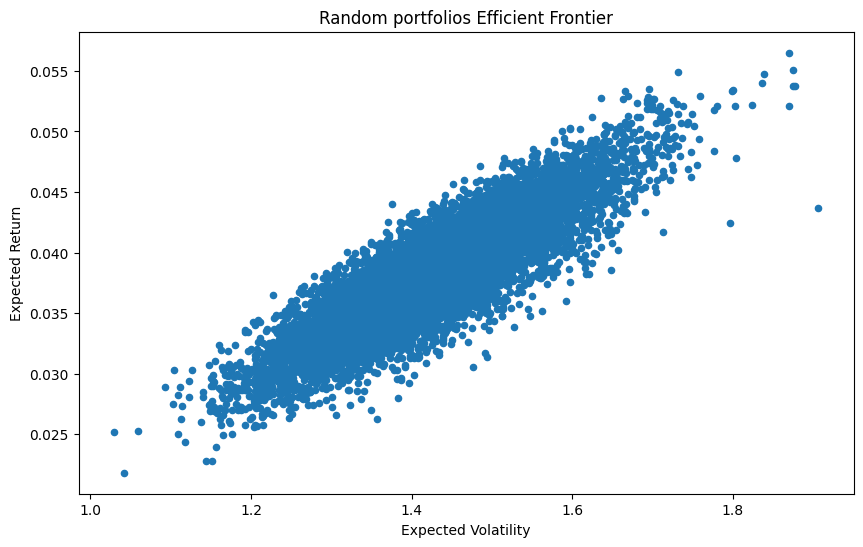

In [17]:

uncorelated_portfolio_trails_simulation_df,uncorelated_portfolio_trails_simulation_sharpes_ratio_df, random_weight_array_all_rows_df, \
                                   uncorrelated_weighted_portfolio_trails_simulation_df = \
                                   uncorelated_portfolio_trails_simulation(log_returns, most_diversify_portfolio_assets_list, 10000)


X_df =generate_excess_return(most_diversify_portfolio_assets_log_returns_df)
Excess_return_varcovar = excess_return_varcovar(X_df)
display(Excess_return_varcovar)
efficient_frontiere_plot(uncorrelated_weighted_portfolio_trails_simulation_df)

In [18]:
#--------------------------------------------------Efficient Frontiere Optimal Points-----------------------------------------------
# get data frame top1 portfolio
# selecting the optimal portfolios:portfolios with expected return higher or equal the minimun risky portfolio
#sort the optimal portfolio data frame by selected value:ascending=True
#return the data frame
#---------------------------------------------------------------------------------------------------------------------------------
def efficient_frontiere_selected_sharpe_ratio_portfolio_df(uncorrelated_weighted_portfolio_trails_simulation_df,selected_col):

    uncorrelated_weighted_portfolio_trails_simulation_sorted_df = uncorrelated_weited_portfolio_trails_simulation_df.sort_values(by='sharpes_ratio', ascending=False)
    uncorrelated_weighted_portfolio_trails_simulation_sorted_df = uncorrelated_weited_portfolio_trails_simulation_sorted_df.reset_index(drop=True)

    top1_sharpe_ratio_value = uncorrelated_weighted_portfolio_trails_simulation_sorted_df['sharpes_ratio'].values[0]
    top1_E_rp_value= uncorrelated_weighted_portfolio_trails_simulation_sorted_df['E_rp'].values[0]
    top1_σp_value = uncorrelated_weighted_portfolio_trails_simulation_sorted_df['σp'].values[0]

    # selecting the optimal portfolios:portfolios with expected return higher or equal the minimun risky portfolio
    if selected_col == 'sharpes_ratio':
        uncorrelated_weighted_portfolio_trails_simulation_selected_sharpes_ratio_optimal_portfolios_df = \
        uncorrelated_weighted_portfolio_trails_simulation_sorted_df[uncorrelated_weighted_portfolio_trails_simulation_sorted_df[selected_col] >= top1_sharpe_ratio_value]
    elif selected_col == 'E_rp':
        uncorrelated_weighted_portfolio_trails_simulation_selected_sharpes_ratio_optimal_portfolios_df = uncorrelated_weighted_portfolio_trails_simulation_sorted_df

    # sort the optimal portfolio data frame
    uncorrelated_weighted_portfolio_trails_simulation_selected_sharpes_ratio_optimal_portfolios_df = \
    uncorrelated_weighted_portfolio_trails_simulation_selected_sharpes_ratio_optimal_portfolios_df.sort_values(by='σp', ascending=True)
    uncorrelated_weighted_portfolio_trails_simulation_selected_sharpes_ratio_optimal_portfolios_df = \
    uncorrelated_weighted_portfolio_trails_simulation_selected_sharpes_ratio_optimal_portfolios_df.reset_index(drop=True)
    return uncorelated_portfolio_trails_simulation_selected_sharpes_ratio_optimal_portfolios_df

#----------------------------------------------------------------------------------------
def efficient_frontiere_optimal_sharpe_ratio_portfolios_model_points(uncorrelated_weighted_portfolio_trails_simulation_df,number_of_top_points = 35):
    #sort from maximum sharpe ratio and get top sharpe ratio portfolios
    portfolio_trails_simulation_sharpes_ratio_top_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='sharpes_ratio',
                                                                                                                        ascending=False)
    portfolio_trails_simulation_sharpes_ratio_top_df = portfolio_trails_simulation_sharpes_ratio_top_df.reset_index(drop=True)
    uncorelated_portfolio_trails_simulation_sharpes_ratio_top_df =portfolio_trails_simulation_sharpes_ratio_top_df.head(number_of_top_points)
    xpoints_list = []
    ypoints_list = []
    top_sharpe_ratio_value_points_list = []

    for portfolio_number in range(number_of_top_points):
        #top shape ratio
        top_sharpe_ratio_value_points_list.append(portfolio_trails_simulation_sharpes_ratio_top_df['sharpes_ratio'].values[portfolio_number])
        xpoints_list.append(portfolio_trails_simulation_sharpes_ratio_top_df['σp'].values[portfolio_number])
        ypoints_list.append(portfolio_trails_simulation_sharpes_ratio_top_df['E_rp'].values[portfolio_number])

    xpoints = np.array(xpoints_list)
    ypoints = np.array(ypoints_list)
    top_sharpe_ratio_value_points = np.array(top_sharpe_ratio_value_points_list)

    return xpoints, ypoints, top_sharpe_ratio_value_points

def get_maximun_return_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df):

    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='E_rp',
                                                                                                                                ascending=False)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df.reset_index(drop=True)

    max_E_rp_sharpe_ratio = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['sharpes_ratio'].values[0]
    max_E_rp = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['E_rp'].values[0]
    max_E_rp_σp = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['σp'].values[0]

    return max_E_rp_sharpe_ratio, max_E_rp, max_E_rp_σp

def get_maximun_risk_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df):
    # here  the portfolios are sotrted from maximum risk
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df = \
                                uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='σp', ascending=False)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df = \
                                        portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df.reset_index(drop=True)

    max_σp_E_rp_sharpe_ratio = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df['sharpes_ratio'].values[0]
    max_σp_E_rp = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df['E_rp'].values[0]
    max_σp = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df['σp'].values[0]

    return max_σp_E_rp_sharpe_ratio, max_σp_E_rp, max_σp

def get_minimum_risk_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df):
    # here  the portfolios are sotrted from minimum risk
    portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df = \
                                            uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='σp', ascending=True)
    portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df.reset_index(drop=True)
    minimun_σp_E_rp_sharpe_ratio = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['sharpes_ratio'].values[0]
    minimun_σp_E_rp = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['E_rp'].values[0]
    minimun_σp = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['σp'].values[0]
    return minimun_σp_E_rp_sharpe_ratio, minimun_σp_E_rp, minimun_σp

def get_maximum_sharpe_ratio(uncorrelated_weighted_portfolio_trails_simulation_df):
    #sort from maximum sharpe ratio and get top sharpe ratio portfolios
    portfolio_trails_simulation_sharpes_ratio_top_df = \
                                        uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='sharpes_ratio', ascending=False)
    portfolio_trails_simulation_sharpes_ratio_top_df = portfolio_trails_simulation_sharpes_ratio_top_df.reset_index(drop=True)
    maximum_sharpe_ratio = portfolio_trails_simulation_sharpes_ratio_top_df['sharpes_ratio'].values[0]
    maximum_sharpe_ratio_σp_E_rp = portfolio_trails_simulation_sharpes_ratio_top_df['E_rp'].values[0]
    maximum_sharpe_ratio_σp = portfolio_trails_simulation_sharpes_ratio_top_df['σp'].values[0]
    return maximum_sharpe_ratio, maximum_sharpe_ratio_σp_E_rp, maximum_sharpe_ratio_σp


#-----------------------------------------------------------------------------------------------------------------------------------
def efficient_frontiere_optimal_portfolios_model_points(uncorrelated_weighted_portfolio_trails_simulation_df,number_of_top_points = 35):

    #number_of_top_points = 35
    #sort from maximum sharpe ratio and get top sharpe ratio portfolios
    portfolio_trails_simulation_sharpes_ratio_top_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='sharpes_ratio', ascending=False)
    portfolio_trails_simulation_sharpes_ratio_top_df = portfolio_trails_simulation_sharpes_ratio_top_df.reset_index(drop=True)
    uncorelated_portfolio_trails_simulation_sharpes_ratio_top_df =portfolio_trails_simulation_sharpes_ratio_top_df.head(number_of_top_points)

    # minimum risk portfolio: here  the portfolios are sotrted from minimum risk
    portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='σp', ascending=True)
    portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df.reset_index(drop=True)
    portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df.head(number_of_top_points)

    minimun_σp_E_rp_sharpe_ratio = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['sharpes_ratio'].values[0]
    minimun_σp_E_rp = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['E_rp'].values[0]
    minimun_σp = portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['σp'].values[0]

    # maximun return portfolio
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='E_rp', ascending=False)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df.reset_index(drop=True)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df.head(number_of_top_points)

    max_E_rp_sharpe_ratio = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['sharpes_ratio'].values[0]
    max_E_rp = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['E_rp'].values[0]
    max_E_rp_σp = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['σp'].values[0]

    # maximun risk portfolio: here  the portfolios are sotrted from maximum risk
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(by='σp', ascending=False)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df.reset_index(drop=True)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_selecte_df.head(number_of_top_points)



    xpoints_list = []
    ypoints_list = []
    top_sharpe_ratio_value_points_list = []

    for portfolio_number in range(number_of_top_points):

        #top shape ratio
        top_sharpe_ratio_value_points_list.append(portfolio_trails_simulation_sharpes_ratio_top_df['sharpes_ratio'].values[portfolio_number])
        xpoints_list.append(portfolio_trails_simulation_sharpes_ratio_top_df['σp'].values[portfolio_number])
        ypoints_list.append(portfolio_trails_simulation_sharpes_ratio_top_df['E_rp'].values[portfolio_number])

        # minimum risk portfolio:
        top_sharpe_ratio_value_points_list.append(portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['sharpes_ratio'].values[portfolio_number])
        xpoints_list.append(portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['σp'].values[portfolio_number])
        ypoints_list.append(portfolio_trails_simulation_sharpes_ratio_minun_σp_E_rp_df['E_rp'].values[portfolio_number])

        # maximun return portfolio
        top_sharpe_ratio_value_points_list.append(portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['sharpes_ratio'].values[portfolio_number])
        xpoints_list.append(portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['σp'].values[portfolio_number])
        ypoints_list.append(portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df['E_rp'].values[portfolio_number])


    xpoints = np.array(xpoints_list)
    ypoints = np.array(ypoints_list)
    top_sharpe_ratio_value_points = np.array(top_sharpe_ratio_value_points_list)


    return xpoints.clip(minimun_σp,max_E_rp_σp),ypoints.clip(minimun_σp_E_rp,max_E_rp), \
                    top_sharpe_ratio_value_points.clip(minimun_σp_E_rp_sharpe_ratio,max_E_rp_sharpe_ratio)

def get_maximun_minimum_points(df):

    # maximun return portfolio
    max_df = df.sort_values(by='E_rp', ascending=False)
    max_df = max_df.reset_index(drop=True)
    max_df = max_df.head(1)
    max_E_rp_σp = max_df['σp']
    max_E_rp    = max_df['E_rp']
    max_E_rp_sharpe_ratio = max_df['sharpes_ratio']

    # minimum return portfolio
    min_df = df.sort_values(by='E_rp', ascending=True)
    min_df = min_df.reset_index(drop=True)
    min_df = min_df.head(1)
    minimun_σp = min_df['σp']
    minimun_σp_E_rp    = min_df['E_rp']
    minimun_σp_E_rp_sharpe_ratio = min_df['sharpes_ratio']

    return max_E_rp_σp, max_E_rp, max_E_rp_sharpe_ratio, minimun_σp, minimun_σp_E_rp, minimun_σp_E_rp_sharpe_ratio

#-----------------------------------------Efficient Frontiere Model Plotting-----------------------------------------------------------------------------------
#call efficient_frontiere_optimal_portfolios_df to include sharpe ration dataframe to the trails protfolios dataframe
#and select the optimal portfolios
#prepare data for plotting and create the scatter plot
#include sharpe ration dataframe to the trails protfolios dataframe
#select the optimal portfolios(portfolios with expected return higher or equal to the minimumal risk portfolio)
#sorted by sharpe ration efficient_frontiere_selected_sharpe_ratio_portfolio_df
#------------------------------------------------------------------------------------------------------------------------------
def plot_fitted_curve(uncorrelated_weighted_portfolio_trails_simulation_df,fig, ax, label, marker, color ):
    #points plotting

    xpoints,ypoints,top_sharpe_ratio_value_points = \
                efficient_frontiere_optimal_portfolios_model_points(uncorrelated_weighted_portfolio_trails_simulation_df,7)

    row, col = uncorrelated_weighted_portfolio_trails_simulation_df.shape
    #--model definition---
    mymodel = np.poly1d(np.polyfit(xpoints, ypoints,2))
    popt = np.polyfit(xpoints, ypoints,2)
    a, b, c = popt
    poly_d2_form = str('y =%.5f * x^2 + %.5f * x + %.5f' % (a, b, c))
    display(np.polyfit(xpoints, ypoints,2))
    myline = np.linspace(xpoints.min(), xpoints.max(), row)

    # optimal portfolios plotting
    ypred = mymodel(myline)
    ax.plot(xpoints,ypoints,'*',color='red',label='Optimal portfolios')
    ax.plot(myline, mymodel(myline),'.',color="blue",label=label + ':\n'+poly_d2_form)
    print(r2_score(ypoints, mymodel(xpoints)))

def plot_random_portfolios(uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax, colorbar = 'yes'):

    #random portfolio plotting
    optimal_portfolios_df = uncorrelated_weighted_portfolio_trails_simulation_df
    sharpes_ratio_optimal_portfolios_σp_col = optimal_portfolios_df['σp']
    sharpes_ratio_optimal_portfolios_E_rp_col = optimal_portfolios_df['E_rp']
    optimal_portfolios_sharpes_ratio_col = optimal_portfolios_df['sharpes_ratio']

    scplt = ax.scatter(sharpes_ratio_optimal_portfolios_σp_col, sharpes_ratio_optimal_portfolios_E_rp_col, marker="o",
                       c=optimal_portfolios_sharpes_ratio_col, cmap="viridis",label='Random Portfolios')
    if colorbar == 'yes':
        cb = fig.colorbar(scplt, ax=ax, label='Sharpe Ratio')
    ax.set_title("Towards an Efficient Frontier Model - Random portfolios Efficient Frontier")


def plot_fitted_curve_and_random_portfolios(uncorrelated_weighted_portfolio_trails_simulation_df):
    fig, ax =plt.subplots(figsize=(12, 5))
    plot_fitted_curve(uncorrelated_weighted_portfolio_trails_simulation_df,fig, ax, label='Model to Approximate', marker= '*', color='red')
    plot_random_portfolios(uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax)
    ax.legend(prop = { "size": 8 })

#plot_fitted_curve_and_random_portfolios(uncorrelated_weighted_portfolio_trails_simulation_df)

array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


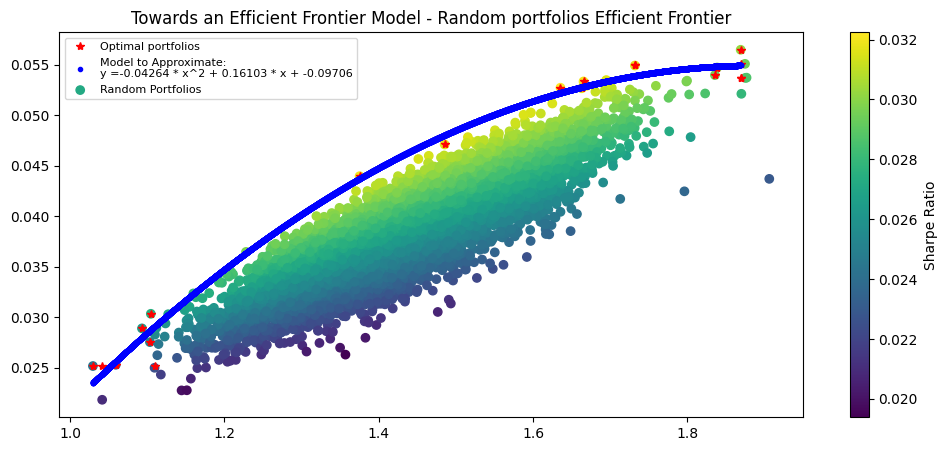

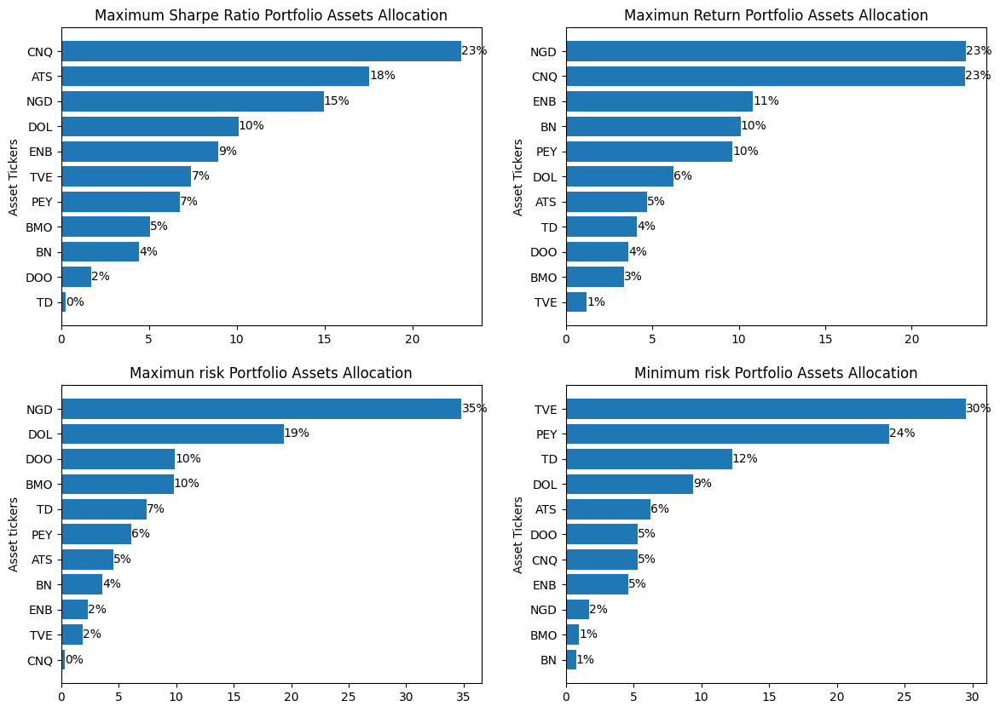

In [19]:
#----------------------------------------------------------------------------------
# minimum risk portfolio: here  the portfolios are sotrted from minimum risk
#-----------------------------------------------------------------------------------
def portfolio_strategy_minimum_risk(uncorrelated_weighted_portfolio_trails_simulation_df,number_of_top_points, most_diversify_portfolio_assets_list):

    portfolio_trails_simulation_minimum_risk_σp_E_rp_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(
                                                        by='σp', ascending=True)
    portfolio_trails_simulation_minimum_risk_σp_E_rp_df = portfolio_trails_simulation_minimum_risk_σp_E_rp_df.reset_index(drop=True)
    portfolio_trails_simulation_minimum_risk_σp_E_rp_df = portfolio_trails_simulation_minimum_risk_σp_E_rp_df.head(number_of_top_points)

    portfolio_weight_df = portfolio_trails_simulation_minimum_risk_σp_E_rp_df[most_diversify_portfolio_assets_list]

    portfolio_weight_df = portfolio_weight_df*100

    portfolio_weight_df1 = portfolio_weight_df.head(1)
    portfolio_weight =portfolio_weight_df1.columns.values.tolist()
    asset_tickers = portfolio_weight_df1.iloc[0].tolist()
    portfolio_investment_strategy_df = pd.DataFrame({'Portfolio Weight':portfolio_weight,'Asset Tickers':asset_tickers})
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Asset Tickers',ascending=True)

    portfolio_investment_strategy_Trans_df = portfolio_investment_strategy_df.transpose()
    strategy_Weight = portfolio_investment_strategy_df['Portfolio Weight']
    strategy_tickers = portfolio_investment_strategy_df['Asset Tickers']

    return strategy_Weight, strategy_tickers, portfolio_trails_simulation_minimum_risk_σp_E_rp_df

#----------------------------------------------------------------------------
#maximun risk portfolio: here  the portfolios are sotrted from minimum risk
#----------------------------------------------------------------------------
def portfolio_strategy_maximun_risk(uncorrelated_weighted_portfolio_trails_simulation_df,number_of_top_points):
    #log_returns,threshold
    portfolio_trails_simulation_max_risk_σp_E_rp_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(
                                                        by='σp', ascending=False)
    portfolio_trails_simulation_max_risk_σp_E_rp_df = portfolio_trails_simulation_max_risk_σp_E_rp_df.reset_index(drop=True)
    portfolio_trails_simulation_max_risk_σp_E_rp_df = portfolio_trails_simulation_max_risk_σp_E_rp_df.head(number_of_top_points)
    portfolio_weight_df = portfolio_trails_simulation_max_risk_σp_E_rp_df[most_diversify_portfolio_assets_list]
    portfolio_weight_df = portfolio_weight_df*100

    portfolio_weight_df1 = portfolio_weight_df.head(1)
    portfolio_weight =portfolio_weight_df1.columns.values.tolist()
    asset_tickers = portfolio_weight_df1.iloc[0].tolist()
    portfolio_investment_strategy_df = pd.DataFrame({'Portfolio Weight':portfolio_weight,'Asset Tickers':asset_tickers})
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Asset Tickers',ascending=True)

    portfolio_investment_strategy_Trans_df = portfolio_investment_strategy_df.transpose()
    #display(portfolio_investment_strategy_Trans_df)
    strategy_Weight = portfolio_investment_strategy_df['Portfolio Weight']
    strategy_tickers = portfolio_investment_strategy_df['Asset Tickers']

    return strategy_Weight, strategy_tickers, portfolio_trails_simulation_max_risk_σp_E_rp_df

#---------------------------------
# maximun return portfolio
#--------------------------------
def portfolio_strategy_maximun_return(uncorrelated_weighted_portfolio_trails_simulation_df,number_of_top_points):

    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(
                                                        by='E_rp', ascending=False)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df.reset_index(drop=True)
    portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df.head(number_of_top_points)

    portfolio_weight_df = portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df[most_diversify_portfolio_assets_list]

    portfolio_weight_df = portfolio_weight_df*100

    portfolio_weight_df1 = portfolio_weight_df.head(1)
    portfolio_weight =portfolio_weight_df1.columns.values.tolist()
    asset_tickers = portfolio_weight_df1.iloc[0].tolist()
    portfolio_investment_strategy_df = pd.DataFrame({'Portfolio Weight':portfolio_weight,'Asset Tickers':asset_tickers})
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Asset Tickers',ascending=True)

    portfolio_investment_strategy_Trans_df = portfolio_investment_strategy_df.transpose()
    #display(portfolio_investment_strategy_Trans_df)
    strategy_Weight = portfolio_investment_strategy_df['Portfolio Weight']
    strategy_tickers = portfolio_investment_strategy_df['Asset Tickers']

    return strategy_Weight, strategy_tickers, portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df

#-------------------------------------------------------------------------
#sort from maximum sharpe ration and get top sharpe ratio portfolios
#-------------------------------------------------------------------------
def portfolio_strategy_top_sharpe_ratio(uncorrelated_weighted_portfolio_trails_simulation_df,number_of_top_points):

    portfolio_trails_simulation_sharpes_ratio_top_df = uncorrelated_weighted_portfolio_trails_simulation_df.sort_values(
                                                        by='sharpes_ratio', ascending=False)
    portfolio_trails_simulation_sharpes_ratio_top_df = portfolio_trails_simulation_sharpes_ratio_top_df.reset_index(drop=True)
    uncorrelated_portfolio_trails_simulation_sharpes_ratio_top_df = portfolio_trails_simulation_sharpes_ratio_top_df.head(number_of_top_points)

    portfolio_weight_df = uncorrelated_portfolio_trails_simulation_sharpes_ratio_top_df[most_diversify_portfolio_assets_list]
    portfolio_weight_df = portfolio_weight_df*100

    portfolio_weight_df1 = portfolio_weight_df.head(1)
    portfolio_weight =portfolio_weight_df1.columns.values.tolist()
    asset_tickers = portfolio_weight_df1.iloc[0].tolist()
    portfolio_investment_strategy_df = pd.DataFrame({'Portfolio Weight':portfolio_weight,'Asset Tickers':asset_tickers})
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Asset Tickers',ascending=True)

    portfolio_investment_strategy_Trans_df = portfolio_investment_strategy_df.transpose()
    #display(portfolio_investment_strategy_Trans_df)
    strategy_Weight = portfolio_investment_strategy_df['Portfolio Weight']
    strategy_tickers = portfolio_investment_strategy_df['Asset Tickers']

    return strategy_Weight, strategy_tickers, uncorrelated_portfolio_trails_simulation_sharpes_ratio_top_df


#------------------------------------------------------------------------
#sort from maximum sharpe ratio and get top sharpe ratio portfolios
#------------------------------------------------------------------------
def portfolio_strategy_plotting(uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, number_of_top_points):
    fig, ax =plt.subplots(2,2, figsize=(14, 10))

    strategy_Weight, strategy_tickers,uncorrelated_portfolio_trails_simulation_sharpes_ratio_top_df = \
        portfolio_strategy_top_sharpe_ratio(uncorrelated_weighted_portfolio_trails_simulation_df, number_of_top_points)

    bar_container= ax[0,0].barh(strategy_Weight,strategy_tickers)
    # setting label of y-axis
    ax[0,0].set_ylabel("Asset Tickers")
    # setting label of x-axis
    #ax[0,0].set_xlabel("Portfolio Weight")
    ax[0,0].set_title("Maximum Sharpe Ratio Portfolio Assets Allocation")
    ax[0,0].bar_label(bar_container, fmt='{:,.0f}%')


    # maximun return portfolio
    strategy_Weight, strategy_tickers,portfolio_trails_simulation_sharpes_ratio_max_σp_E_rp_df = \
        portfolio_strategy_maximun_return(uncorrelated_weighted_portfolio_trails_simulation_df, number_of_top_points)
    bar_container= ax[0,1].barh(strategy_Weight,strategy_tickers)

    # setting label of y-axis
    ax[0,1].set_ylabel("Asset Tickers")
    # setting label of x-axis
    #ax[0,1].set_xlabel("Portfolio Weight")
    ax[0,1].set_title("Maximun Return Portfolio Assets Allocation")
    ax[0,1].bar_label(bar_container, fmt='{:,.0f}%')

     # maximun risk portfolio: here  the portfolios are sotrted from minimum risk
    strategy_Weight, strategy_tickers,portfolio_trails_simulation_max_risk_σp_E_rp_df = \
        portfolio_strategy_maximun_risk(uncorrelated_weighted_portfolio_trails_simulation_df, number_of_top_points)

    bar_container= ax[1,0].barh(strategy_Weight,strategy_tickers)
    # setting label of y-axis
    ax[1,0].set_ylabel("Asset tickers")
    # setting label of x-axis
    #ax[1,0].set_xlabel("Portfolio Weight")
    ax[1,0].set_title("Maximun risk Portfolio Assets Allocation")
    ax[1,0].bar_label(bar_container, fmt='{:,.0f}%')

    # minimum risk portfolio: here  the portfolios are sotrted from maximun risk
    strategy_Weight, strategy_tickers,portfolio_trails_simulation_minimum_risk_σp_E_rp_df = \
        portfolio_strategy_minimum_risk(uncorrelated_weighted_portfolio_trails_simulation_df, number_of_top_points, most_diversify_portfolio_assets_list)

    bar_container= ax[1,1].barh(strategy_Weight,strategy_tickers)
    # setting label of y-axis
    ax[1,1].set_ylabel("Asset Tickers")
    # setting label of x-axis
    #ax[1,1].set_xlabel("Portfolio Weight")
    ax[1,1].set_title("Minimum risk Portfolio Assets Allocation")
    ax[1,1].bar_label(bar_container, fmt='{:,.0f}%')

    plt.show()

plot_fitted_curve_and_random_portfolios(uncorrelated_weighted_portfolio_trails_simulation_df)
portfolio_strategy_plotting(uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, 10)

## Efficient Frontier modelling using Machine Learning techniques

#### Data Splitting / Model Selection

In [20]:
# Build the model
def model_poly_d2(x, a, b, c):
    return b * x**2 + a * x + c

# Data Splitting / Model Selection
def polynomial_degree2_model(uncorrelated_weighted_portfolio_trails_simulation_df):
     # Load the data : original random portfolios data points
    xpoints, ypoints, original_random_sharpe_ratio = \
    efficient_frontiere_optimal_portfolios_model_points( uncorrelated_weighted_portfolio_trails_simulation_df)

    #Split tranning, validation and testing data
    x_train_poly_d2, x_test_poly_d2, y_train_poly_d2, y_test_poly_d2 = \
    train_test_split(xpoints, ypoints, test_size=0.3, random_state=42)
    x_model_validation_poly_d2, x_model_testing_poly_d2 = train_test_split(np.linspace(min(xpoints), max(xpoints),
                                                                                       len(xpoints)), test_size=0.3, random_state=42)

    # model traning to get paarameters
    popt_poly_d2, pcov_poly_d2 = curve_fit(model_poly_d2, x_train_poly_d2,y_train_poly_d2, maxfev=50000)
    a, b, c = popt_poly_d2

    poly_d2_form  = str('y =%.5f * x^2 + %.5f * x + %.5f' % (a, b, c))

    return x_train_poly_d2, x_test_poly_d2, y_train_poly_d2, y_test_poly_d2,popt_poly_d2, \
                pcov_poly_d2, x_model_validation_poly_d2, x_model_testing_poly_d2, model_poly_d2, poly_d2_form

#x_train_poly_d2, x_test_poly_d2, y_train_poly_d2, y_test_poly_d2,popt_poly_d2, \
#                pcov_poly_d2, x_model_validation_poly_d2, x_model_testing_poly_d2, model_poly_d2, poly_d2_form = \
#                                            polynomial_degree2_model(uncorrelated_weighted_portfolio_trails_simulation_df)


In [21]:
 # Build the model
def model_poly_d3_log(x, a, b, c, d, e):
    return a * np.log(abs(b )* x) + c*x**3 +d*x**2 + e

def polynomial_degree3_log_model(uncorrelated_weighted_portfolio_trails_simulation_df):
    # Load the data : original random portfolios data points
    xpoints,ypoints,original_random_sharpe_ratio = efficient_frontiere_optimal_portfolios_model_points(uncorrelated_weighted_portfolio_trails_simulation_df)

    #Split tranning and testing data
    x_train_poly_d3_log, x_test_poly_d3_log, y_train_poly_d3_log, y_test_poly_d3_log = \
                                                    train_test_split(xpoints, ypoints, test_size=0.3, random_state=42)
    x_model_validation_poly_d3_log, x_model_testing_poly_d3_log = \
                                train_test_split(np.linspace(min(xpoints), max(xpoints), len(xpoints)), test_size=0.3, random_state=42)

    # model validation data
    #x_model_validation = np.linspace(min(x_train), max(x_train), number_of_top_points*3)

    # model traning to get parameters
    popt_poly_d3_log, pcov_poly_d3_log = curve_fit(model_poly_d3_log, x_train_poly_d3_log,y_train_poly_d3_log, maxfev=50000)
    a, b, c, d, e = popt_poly_d3_log

    poly_d3_log_form = str('y =%.5f * np.log( %.5f*x) + %.5f * x**3 + %.5f * x + %.5f' % (a, b, c, d, e))


    return x_train_poly_d3_log, x_test_poly_d3_log, y_train_poly_d3_log, y_test_poly_d3_log,popt_poly_d3_log, pcov_poly_d3_log, \
                                x_model_validation_poly_d3_log, x_model_testing_poly_d3_log, model_poly_d3_log, poly_d3_log_form

#x_train_poly_d3_log, x_test_poly_d3_log, y_train_poly_d3_log, y_test_poly_d3_log,popt_poly_d3_log, pcov_poly_d3_log, \
#                                x_model_validation_poly_d3_log, x_model_testing_poly_d3_log, model_poly_d3_log, poly_d3_log_form = \
#                                                            polynomial_degree3_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)


In [22]:
# Build the model
def model_poly_d5_log(x, a, b, c):
    return a*np.log(abs(b)*x) + c*x**5

def polynomial_degree5_log_model(uncorrelated_weighted_portfolio_trails_simulation_df):
     # Load the data : original random portfolios data points
    xpoints,ypoints,original_random_sharpe_ratio = efficient_frontiere_optimal_portfolios_model_points(uncorrelated_weighted_portfolio_trails_simulation_df)

    #Split tranning and testing data
    x_train_poly_d5_log, x_test_poly_d5_log, y_train_poly_d5_log, y_test_poly_d5_log = \
                                        train_test_split(xpoints, ypoints, test_size=0.3, random_state=42)
    x_model_validation_poly_d5_log, x_model_testing_poly_d5_log = \
                                train_test_split(np.linspace(min(xpoints), max(xpoints), len(xpoints)), test_size=0.3, random_state=42)

    popt_poly_d5_log, pcov_poly_d5_log = curve_fit(model_poly_d5_log, x_train_poly_d5_log,y_train_poly_d5_log, maxfev=50000)
    a, b, c = popt_poly_d5_log

    poly_d5_log_form = str('y =%.5f * np.log( %.5f*x) + %.5f * x**5' % (a, b, c))

    return x_train_poly_d5_log, x_test_poly_d5_log, y_train_poly_d5_log, y_test_poly_d5_log, popt_poly_d5_log, pcov_poly_d5_log, \
                                x_model_validation_poly_d5_log, x_model_testing_poly_d5_log, model_poly_d5_log, poly_d5_log_form

#x_train_poly_d5_log, x_test_poly_d5_log, y_train_poly_d5_log, y_test_poly_d5_log, popt_poly_d5_log, pcov_poly_d5_log, \
#                                x_model_validation_poly_d5_log, x_model_testing_poly_d5_log, model_poly_d5_log, poly_d5_log_form = \
#                polynomial_degree5_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)



In [23]:
def models_plotting(x, y, uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax, model_form):
    #------Random portfolio data plotting
    plot_random_portfolios(uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax,'no')
    cspl = ax.scatter(x=x, y=y, c=y/x, cmap="viridis",label='Efficient Frontier:\n'+model_form)
    #-----------model to approximate
    plot_fitted_curve(uncorrelated_weighted_portfolio_trails_simulation_df,fig, ax, label='Fitted Curve', marker= '*', color='red')

    ax.legend(bbox_to_anchor=(0.72, 1.38), ncol=1, prop = { "size": 8})
    return cspl

In [24]:
def dataframe_clipping(x_σp, y_E_rp, y_E_rp_pred ):

    clipped_df = pd.DataFrame({'σp':x_σp,'E_rp':y_E_rp,'y_E_rp_pred':y_E_rp_pred,'error':y_E_rp_pred - y_E_rp})
    clipped_df = clipped_df.sort_values(by='error',ascending=False)
    clipped_df['y_optimal_E_rp'] = np.where(clipped_df['E_rp'] <= clipped_df['y_E_rp_pred'], clipped_df['E_rp'],clipped_df['y_E_rp_pred'] )
    clipped_df['sharpes_ratio'] = clipped_df['y_optimal_E_rp']/clipped_df['σp']
    return clipped_df[clipped_df['error'] >= 0]

def model_uperBound_efficient_frontier( uncorrelated_weighted_portfolio_trails_simulation_df, model, model_popt,
                                       ax , mode_form, random_points = 0):

    optimal_portfolios_df = uncorrelated_weighted_portfolio_trails_simulation_df
    x_σp = uncorrelated_weighted_portfolio_trails_simulation_df['σp']
    y_E_rp = uncorrelated_weighted_portfolio_trails_simulation_df['E_rp']
    row, col = uncorrelated_weighted_portfolio_trails_simulation_df.shape

    #here the original data frame is clipped to eliminate the upper bound Outlier
    y_E_rp_pred = model(x_σp, *model_popt)
    clipped_df = dataframe_clipping(x_σp, y_E_rp, y_E_rp_pred )

    xpoints,ypoints,top_sharpe_ratio_value_points = efficient_frontiere_optimal_portfolios_model_points(clipped_df,7)

    #------Random portfolio data plotting
    if random_points == 0:

        scplt = ax.scatter(clipped_df['σp'], clipped_df['E_rp'], marker="o", c=clipped_df['E_rp']/clipped_df['σp'],
                       cmap="viridis",label='Random Portfolios')

    else:
        xrandom_points,yrandom_points,random_sharpe_ratio_value_points = \
                        efficient_frontiere_optimal_sharpe_ratio_portfolios_model_points(clipped_df,random_points)
        scplt = ax.scatter(x=xrandom_points, y=yrandom_points, marker="o", c= random_sharpe_ratio_value_points,
                       cmap="viridis",label='Random Portfolios')


    #efficient frontier plotting
    x_model_σp = np.linspace(xpoints.min(), xpoints.max(), row)
    y_model_E_rp_pred = model(x_model_σp, *model_popt)
    cspl = ax.scatter(x=x_model_σp, y=y_model_E_rp_pred, marker="*", c= y_E_rp_pred/x_model_σp,
                      cmap="viridis",label='Efficient Frontier:\n'+mode_form)

    ax.set_title("Boundary Random portfolios Efficient Frontier")
    ax.legend(bbox_to_anchor=(0.72, 1.38), ncol=1, prop = { "size": 8})

    return scplt

#### Model Evaluation
##### Model validation
we validate the model(model parameters) on the training and the validation data.

In [25]:

def evalute_model_parameters(uncorrelated_weighted_portfolio_trails_simulation_df):

    #polynoial degree 2 model  b * x**2 + a * x + c
    x_train_poly_d2, x_test_poly_d2, y_train_poly_d2, y_test_poly_d2,popt_poly_d2, \
                pcov_poly_d2, x_model_validation_poly_d2, x_model_testing_poly_d2, model_poly_d2, poly_d2_form = \
                                                            polynomial_degree2_model(uncorrelated_weighted_portfolio_trails_simulation_df)
    # model parameters
    a, b, c = popt_poly_d2
    #model prediction
    y_model_validation_pred_poly_d2 = model_poly_d2(x_model_validation_poly_d2, a, b, c)

    #polynomial degree 3 log model: a * np.log(b * x) + c*x**3 +d*x**2 + e
    x_train_poly_d3_log, x_test_poly_d3_log, y_train_poly_d3_log, y_test_poly_d3_log,popt_poly_d3_log, pcov_poly_d3_log, \
                                x_model_validation_poly_d3_log, x_model_testing_poly_d3_log, model_poly_d3_log, poly_d3_log_form = \
                                                            polynomial_degree3_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)
    # model parameters
    a, b, c, d, e = popt_poly_d3_log
    y_model_validation_pred_poly_d3_log = model_poly_d3_log(x_model_validation_poly_d3_log, a, abs(b), c, d, e)

    #polynomial degree 5 log model: a*np.log(b*x) + c*x**5
    x_train_poly_d5_log, x_test_poly_d5_log, y_train_poly_d5_log, y_test_poly_d5_log, popt_poly_d5_log, pcov_poly_d5_log, \
                                x_model_validation_poly_d5_log, x_model_testing_poly_d5_log, model_poly_d5_log, poly_d5_log_form = \
                polynomial_degree5_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)
    # model parameters
    a, b, c = popt_poly_d5_log
    y_model_validation_pred_poly_d5_log = model_poly_d5_log(x_model_validation_poly_d5_log, a,abs(b), c)


    return popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2,x_model_validation_poly_d3_log, \
           x_model_validation_poly_d5_log, y_train_poly_d2, y_model_validation_pred_poly_d2, y_train_poly_d3_log, \
           y_model_validation_pred_poly_d3_log, y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, model_poly_d2, \
           model_poly_d3_log, model_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form

#popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2,x_model_validation_poly_d3_log, \
#x_model_validation_poly_d5_log, y_train_poly_d2, y_model_validation_pred_poly_d2, y_train_poly_d3_log, \
#y_model_validation_pred_poly_d3_log, y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, model_poly_d2, \
#model_poly_d3_log, model_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form = \
#                                        evalute_model_parameters(uncorrelated_weighted_portfolio_trails_simulation_df)

array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


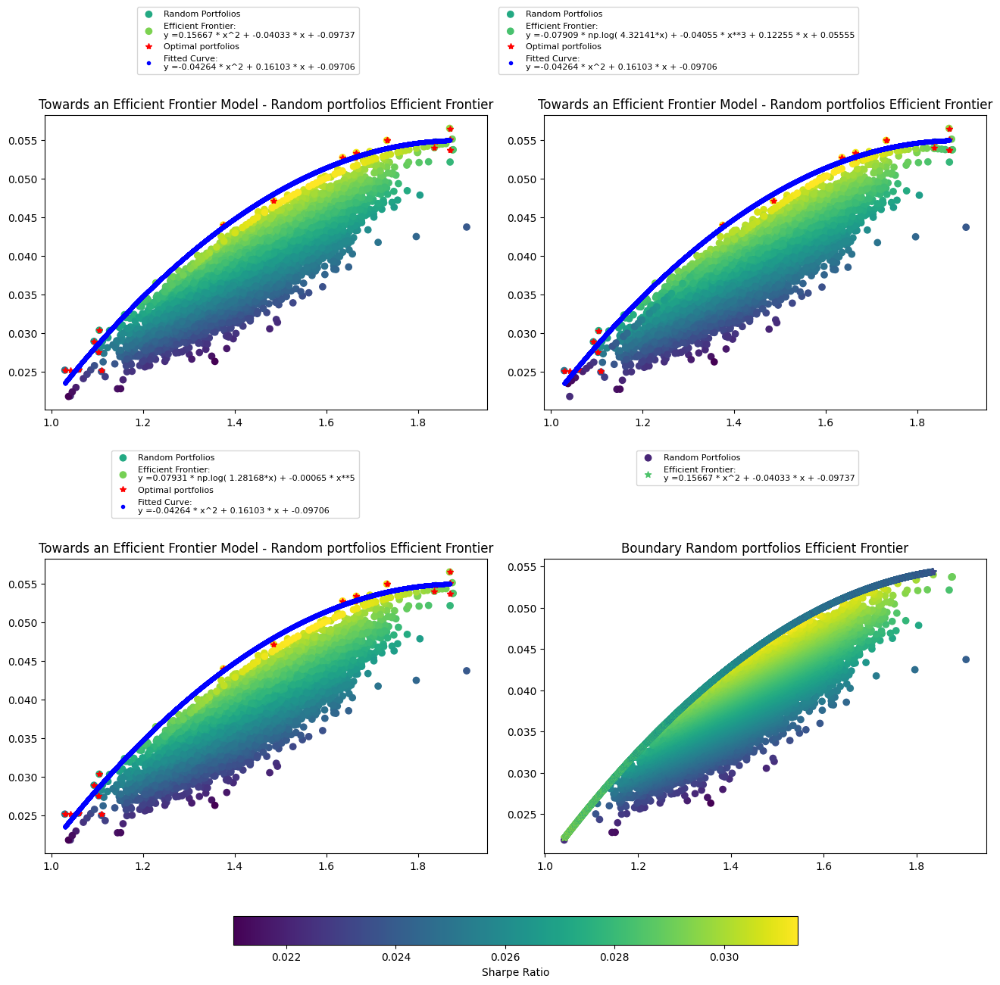

In [26]:
def model_validation_plotting(uncorrelated_weighted_portfolio_trails_simulation_df):

    fig, ax =plt.subplots(2,2,figsize=(13, 13), constrained_layout=True)

    popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2,x_model_validation_poly_d3_log, \
    x_model_validation_poly_d5_log, y_train_poly_d2, y_model_validation_pred_poly_d2, y_train_poly_d3_log, \
    y_model_validation_pred_poly_d3_log, y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, model_poly_d2, \
    model_poly_d3_log, model_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form = \
                                        evalute_model_parameters(uncorrelated_weighted_portfolio_trails_simulation_df)

    cspl1 = models_plotting(x_model_validation_poly_d2, y_model_validation_pred_poly_d2,
                           uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[0,0], poly_d2_form)
    cspl2 = models_plotting(x_model_validation_poly_d3_log, y_model_validation_pred_poly_d3_log,
                               uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[0,1],poly_d3_log_form)
    cspl = models_plotting(x_model_validation_poly_d5_log, y_model_validation_pred_poly_d5_log,
                               uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[1,0], poly_d5_log_form)
    cplt4 =  model_uperBound_efficient_frontier(uncorrelated_weighted_portfolio_trails_simulation_df, model_poly_d2,popt_poly_d2,
                                       ax[1,1], poly_d2_form)

    cb = fig.colorbar(cspl, ax=ax, label='Sharpe Ratio',orientation='horizontal',shrink=0.6)

model_validation_plotting(uncorrelated_weighted_portfolio_trails_simulation_df)

#### Model fine-tuning

In [27]:
def fine_tune_hyperparmeters(uncorrelated_weighted_portfolio_trails_simulation_df):

     #polynoial degree 2 model  b * x**2 + a * x + c
    x_train_poly_d2, x_test_poly_d2, y_train_poly_d2, y_test_poly_d2,popt_poly_d2, \
                pcov_poly_d2, x_model_validation_poly_d2, x_model_testing_poly_d2, model_poly_d2, poly_d2_form = \
                                             polynomial_degree2_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    y_model_turning_pred_poly_d2 = model_poly_d2(x_model_validation_poly_d2, 0.075, -0.019, -0.007)
    poly_d2_form  = str('y =%.5f * x^2 + %.5f * x + %.5f' % (0.07, -0.016, -0.009))

    #polynomial degree 3 log model: a * np.log(b * x) + c*x**3 +d*x**2 + e
    x_train_poly_d3_log, x_test_poly_d3_log, y_train_poly_d3_log, y_test_poly_d3_log,popt_poly_d3_log, pcov_poly_d3_log, \
                                x_model_validation_poly_d3_log, x_model_testing_poly_d3_log, model_poly_d3_log, poly_d3_log_form = \
                                         polynomial_degree3_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    y_model_tuning_pred_poly_d3_log = model_poly_d3_log(x_model_validation_poly_d3_log,  0.256, 0.348, 0.00793, -0.060, 0.343)
    poly_d3_log_form = str('y =%.5f * np.log( %.5f*x) + %.5f * x**3 + %.5f * x + %.5f' % (0.256, 0.348, 0.00793, -0.060, 0.343))

    #polynomial degree 5 log model: a*np.log(b*x) + c*x**5
    x_train_poly_d5_log, x_test_poly_d5_log, y_train_poly_d5_log, y_test_poly_d5_log, popt_poly_d5_log, pcov_poly_d5_log, \
                                x_model_validation_poly_d5_log, x_model_testing_poly_d5_log, model_poly_d5_log, poly_d5_log_form = \
                polynomial_degree5_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    y_model_turning_pred_poly_d5_log = model_poly_d5_log(x_model_validation_poly_d5_log,  0.085, 1.44, -0.00058)
    poly_d5_log_form = str('y =%.5f * np.log( %.5f*x) + %.5f * x**5' % (0.085, 1.44, -0.00058))

    return model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2, \
           x_model_validation_poly_d3_log, x_model_validation_poly_d5_log, y_train_poly_d2, y_model_turning_pred_poly_d2, y_train_poly_d3_log, \
           y_model_tuning_pred_poly_d3_log, y_train_poly_d5_log, y_model_turning_pred_poly_d5_log, poly_d2_form, \
           poly_d3_log_form, poly_d5_log_form

#model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2, x_model_validation_poly_d3_log, \
#x_model_validation_poly_d5_log, y_train_poly_d2, y_model_tuning_pred_poly_d2, y_train_poly_d3_log, \
#y_model_tuning_pred_poly_d3_log, y_train_poly_d5_log, y_model_tuning_pred_poly_d5_log, poly_d2_form, \
#poly_d3_log_form, poly_d5_log_form= fine_tune_hyperparmeters(uncorrelated_weighted_portfolio_trails_simulation_df)


 Models Fine-tuning 


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


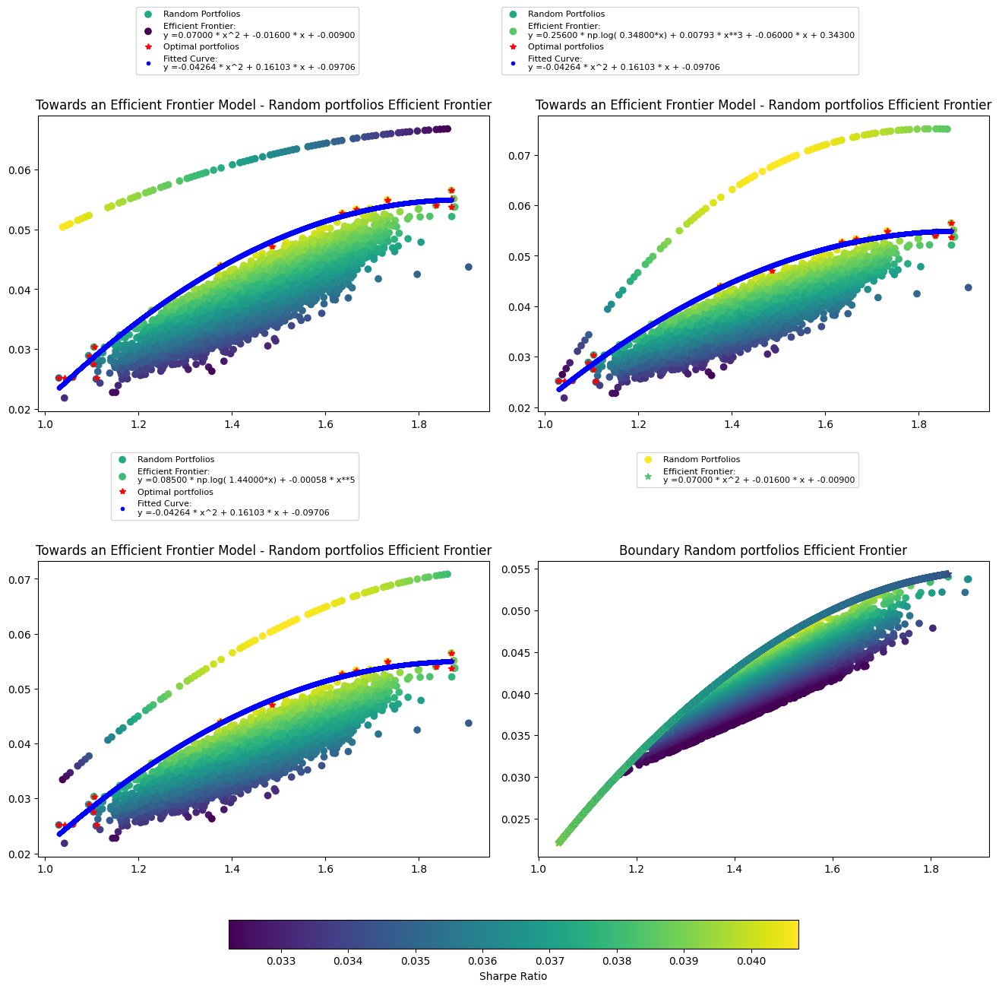

In [28]:
def model_tuning_plotting(uncorrelated_weighted_portfolio_trails_simulation_df):

    fig, ax =plt.subplots(2,2,figsize=(13, 13), constrained_layout=True)

    print(" Models Fine-tuning ")

    model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2, x_model_validation_poly_d3_log, \
    x_model_validation_poly_d5_log, y_train_poly_d2, y_model_tuning_pred_poly_d2, y_train_poly_d3_log, \
    y_model_tuning_pred_poly_d3_log, y_train_poly_d5_log, y_model_tuning_pred_poly_d5_log, poly_d2_form, \
    poly_d3_log_form, poly_d5_log_form= fine_tune_hyperparmeters(uncorrelated_weighted_portfolio_trails_simulation_df)

    cspl1 = models_plotting(x_model_validation_poly_d2, y_model_tuning_pred_poly_d2,
                           uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[0,0], poly_d2_form)
    cspl2 = models_plotting(x_model_validation_poly_d3_log, y_model_tuning_pred_poly_d3_log,
                               uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[0,1], poly_d3_log_form)
    cspl = models_plotting(x_model_validation_poly_d5_log, y_model_tuning_pred_poly_d5_log,
                               uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[1,0], poly_d5_log_form)
    cplt4 = model_uperBound_efficient_frontier(uncorrelated_weighted_portfolio_trails_simulation_df,
                                       model_poly_d2,popt_poly_d2, ax[1,1], poly_d2_form,7000)

    cb = fig.colorbar(cspl, ax=ax, label='Sharpe Ratio',orientation='horizontal',shrink=0.6)

model_tuning_plotting(uncorrelated_weighted_portfolio_trails_simulation_df)

#### Model Testing

In [29]:
def test_the_model(uncorrelated_weighted_portfolio_trails_simulation_df):
     #polynoial degree 2 model  b * x**2 + a * x + c
    x_train_poly_d2, x_test_poly_d2, y_train_poly_d2, y_test_poly_d2,popt_poly_d2, \
                pcov_poly_d2, x_model_validation_poly_d2, x_model_testing_poly_d2, model_poly_d2, poly_d2_form = \
                                             polynomial_degree2_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    y_model_test_pred_poly_d2 = model_poly_d2(x_test_poly_d2, 0.07, -0.016, -0.009)
    poly_d2_form  = str('y =%.5f * x^2 + %.5f * x + %.5f' % (0.07, -0.016, -0.009))

    #polynomial degree 3 log model: a * np.log(b * x) + c*x**3 +d*x**2 + e
    x_train_poly_d3_log, x_test_poly_d3_log, y_train_poly_d3_log, y_test_poly_d3_log,popt_poly_d3_log, pcov_poly_d3_log, \
                                x_model_validation_poly_d3_log, x_model_testing_poly_d3_log, model_poly_d3_log, poly_d3_log_form = \
                                         polynomial_degree3_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    y_model_test_pred_poly_d3_log = model_poly_d3_log(x_test_poly_d3_log,  0.256, 0.348, 0.00793, -0.060, 0.343)
    poly_d3_log_form = str('y =%.5f * np.log( %.5f*x) + %.5f * x**3 + %.5f * x + %.5f' % (0.256, 0.348, 0.00793, -0.060, 0.343))

    #polynomial degree 5 log model: a*np.log(b*x) + c*x**5
    x_train_poly_d5_log, x_test_poly_d5_log, y_train_poly_d5_log, y_test_poly_d5_log, popt_poly_d5_log, pcov_poly_d5_log, \
                                x_model_validation_poly_d5_log, x_model_testing_poly_d5_log, model_poly_d5_log, poly_d5_log_form = \
                polynomial_degree5_log_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    y_model_test_pred_poly_d5_log = model_poly_d5_log(x_test_poly_d5_log,  0.085, 1.44, -0.00058)
    poly_d5_log_form = str('y =%.5f * np.log( %.5f*x) + %.5f * x**5' % (0.085, 1.44, -0.00058))

    return model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_test_poly_d2, x_test_poly_d3_log, x_test_poly_d5_log, \
           y_test_poly_d2, y_model_test_pred_poly_d2,y_test_poly_d3_log, y_model_test_pred_poly_d3_log, y_test_poly_d5_log, \
           y_model_test_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form

model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_test_poly_d2, x_test_poly_d3_log, x_test_poly_d5_log, \
y_test_poly_d2, y_model_test_pred_poly_d2,y_test_poly_d3_log, y_model_test_pred_poly_d3_log, y_test_poly_d5_log, \
y_model_test_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form= \
                test_the_model(uncorrelated_weighted_portfolio_trails_simulation_df)

 Model Testing 


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


array([-0.04264037,  0.16102508, -0.09706129])

0.9900990094360076


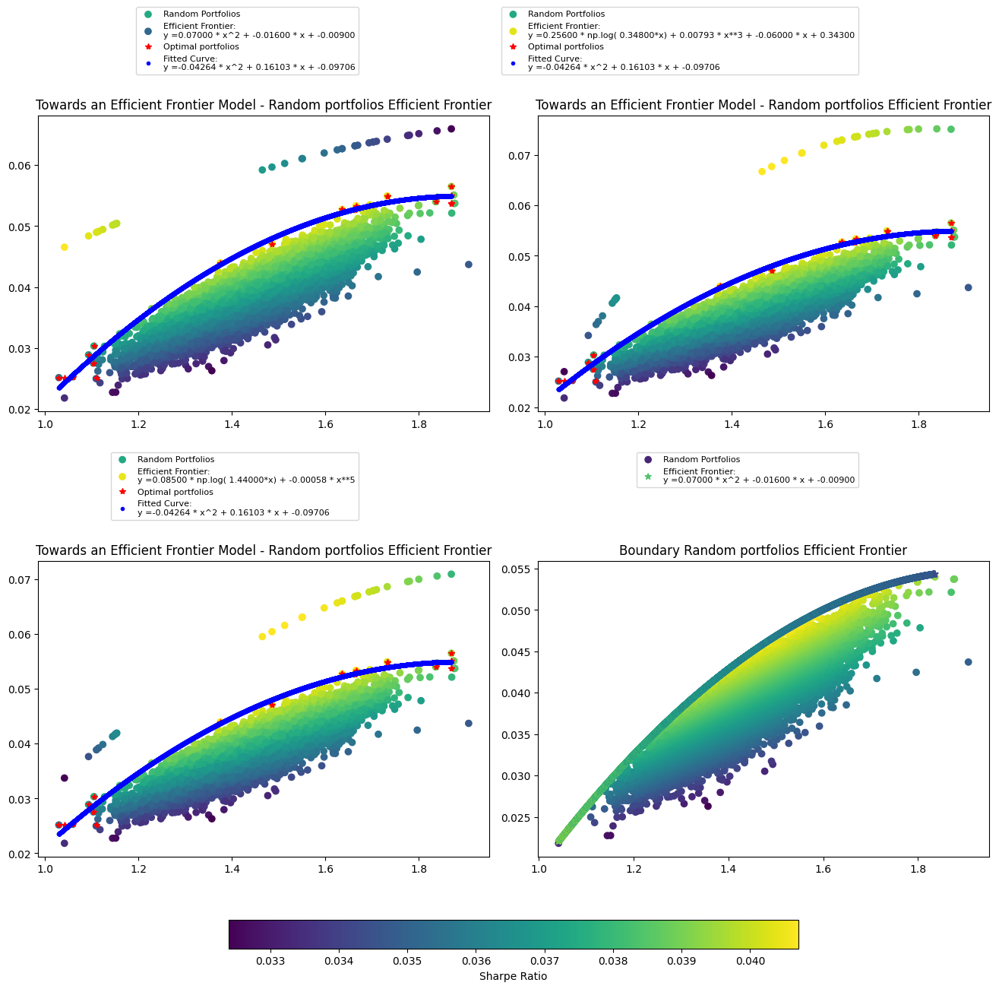

In [30]:
def model_testing_plotting(uncorrelated_weighted_portfolio_trails_simulation_df):

    fig, ax =plt.subplots(2,2,figsize=(13, 13), constrained_layout=True)

    print(" Model Testing ")
    model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_test_poly_d2, x_test_poly_d3_log, x_test_poly_d5_log, \
    y_test_poly_d2, y_model_test_pred_poly_d2,y_test_poly_d3_log, y_model_test_pred_poly_d3_log, y_test_poly_d5_log, \
    y_model_test_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form= \
                test_the_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    cspl1 = models_plotting(x_test_poly_d2, y_model_test_pred_poly_d2,
                           uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[0,0], poly_d2_form)
    cspl2 = models_plotting(x_test_poly_d3_log, y_model_test_pred_poly_d3_log,
                               uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[0,1], poly_d3_log_form)
    cspl = models_plotting(x_test_poly_d5_log, y_model_test_pred_poly_d5_log,
                               uncorrelated_weighted_portfolio_trails_simulation_df, fig, ax[1,0], poly_d5_log_form)
    cplt4 = model_uperBound_efficient_frontier(uncorrelated_weighted_portfolio_trails_simulation_df, \
                                        model_poly_d2,popt_poly_d2, ax[1,1], poly_d2_form)

    cb = fig.colorbar(cspl, ax=ax, label='Sharpe Ratio',orientation='horizontal',shrink=0.6)

model_testing_plotting(uncorrelated_weighted_portfolio_trails_simulation_df)

#### Goodness of Fit Statistics

In [31]:

def error_metrics_statistics(y_true_0, y_pred_0,y_true_1, y_pred_1,y_true_2, y_pred_2,  poly_d2_form, poly_d3_log_form, poly_d5_log_form ):

    display('Poly_d2 : '+poly_d2_form)
    display('Poly_d3_log: '+poly_d3_log_form)
    display('Poly_d5_log: '+poly_d5_log_form)

    error_metrics_table = [['Type Error', 'Poly_d2 Error', 'Poly_d3_log Error','Poly_d5_log Error'],
         ['Mean Absolute Error(MAE)', mean_absolute_error(y_true_0, y_pred_0),mean_absolute_error(y_true_1, y_pred_1),mean_absolute_error(y_true_2, y_pred_2)],
         ['Mean Absolute Percentage Error(MAPE)', mean_absolute_percentage_error(y_true_0, y_pred_0),mean_absolute_percentage_error(y_true_1, y_pred_1),mean_absolute_percentage_error(y_true_2, y_pred_2)],
         ['Neg.Mean Squared Error(RMSE)', -mean_squared_error(y_true_0, y_pred_0),-mean_squared_error(y_true_1, y_pred_1),-mean_squared_error(y_true_2, y_pred_2)],
         ['R-squared score', r2_score(y_true_0, y_pred_0),r2_score(y_true_1, y_pred_1),r2_score(y_true_2, y_pred_2)],
         ['Mean Squared Error(MSE)',mean_squared_error(y_true_0, y_pred_0),mean_squared_error(y_true_1, y_pred_1),mean_squared_error(y_true_2, y_pred_2)],
         ['Mean Squared Log Error(MSLE)', mean_squared_log_error(y_true_0, y_pred_0),mean_squared_log_error(y_true_1, y_pred_1),mean_squared_log_error(y_true_2, y_pred_2)]]

    return error_metrics_table

In [32]:
def model_residual_metrics(y_train, y_model_validation_pred, y_model_tuning_pred, y_test, y_model_test_pred):

    validation_residual = y_train - y_model_validation_pred
    residuals_tuning_train = y_train - y_model_tuning_pred
    residuals_test = y_test - y_model_test_pred
    return validation_residual, residuals_tuning_train, residuals_test

def model_residual_plotting(y_train, y_model_validation_pred, y_model_tuning_pred, y_test, y_model_test_pred, ax, title):

    validation_residual, residuals_tuning_train, residuals_test = \
                                    model_residual_metrics(y_train, y_model_validation_pred, y_model_tuning_pred, y_test, y_model_test_pred)


    sns.scatterplot(ax=ax,x=y_model_validation_pred, y=validation_residual, label='Validation')
    sns.scatterplot(ax=ax,x=y_model_tuning_pred, y=residuals_tuning_train, label='Tuning')
    sns.scatterplot(ax=ax,x=y_model_test_pred, y=residuals_test, label='Test')

    ax.hlines(0, min(y_model_validation_pred), max(y_model_validation_pred), colors='r', linestyles='dashed')
    ax.hlines(0, min(y_model_tuning_pred), max(y_model_tuning_pred), colors='r', linestyles='dashed')
    ax.hlines(0, min(y_model_test_pred), max(y_model_test_pred), colors='r', linestyles='dashed')

    ax.set_xlabel('Predicted Values')
    ax.set_ylabel('Residuals')
    ax.set_title(title)


In [33]:
def error_distribution(y_train, y_model_validation_pred, y_model_tuning_pred, y_test, y_model_test_pred, ax, title):
    #residual calculation
    validation_residual, residuals_tuning_train, residuals_test = \
                                    model_residual_metrics(y_train, y_model_validation_pred, y_model_tuning_pred, y_test, y_model_test_pred)

    # Calculate errors
    error_validation = -1*validation_residual
    tuning_error_train = -1*residuals_tuning_train
    error_test = -1*residuals_test

    # Plot error distribution

    sns.histplot(ax=ax, x=error_validation, kde=True, label='Validation errors', color='blue')
    sns.histplot(ax=ax, x=tuning_error_train, kde=True, label='Tuning errors', color='orange')
    sns.histplot(ax=ax, x=error_test, kde=True, label='Test errors', color='green')

    ax.set_xlabel('Error')
    ax.set_ylabel('Frequency')
    ax.set_title(title)
    ax.legend()



In [34]:

def residual_and_error_plotting(uncorrelated_weighted_portfolio_trails_simulation_df):

    fig, ax =plt.subplots(2,3,figsize=(23, 17))
    #model validation
    popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2,x_model_validation_poly_d3_log, \
    x_model_validation_poly_d5_log, y_train_poly_d2, y_model_validation_pred_poly_d2, y_train_poly_d3_log, \
    y_model_validation_pred_poly_d3_log, y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, model_poly_d2, \
    model_poly_d3_log, model_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form = \
                                        evalute_model_parameters(uncorrelated_weighted_portfolio_trails_simulation_df)
    # Model Fine-tuning
    model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2, \
    x_model_validation_poly_d3_log, x_model_validation_poly_d5_log, y_train_poly_d2, y_model_tuning_pred_poly_d2, y_train_poly_d3_log, \
    y_model_tuning_pred_poly_d3_log, y_train_poly_d5_log, y_model_tuning_pred_poly_d5_log, poly_d2_form, \
    poly_d3_log_form, poly_d5_log_form= fine_tune_hyperparmeters(uncorrelated_weighted_portfolio_trails_simulation_df)


    # Model Testing
    model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_test_poly_d2, x_test_poly_d3_log, x_test_poly_d5_log, \
    y_test_poly_d2, y_model_test_pred_poly_d2,y_test_poly_d3_log, y_model_test_pred_poly_d3_log, y_test_poly_d5_log, \
    y_model_test_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form= \
                                    test_the_model(uncorrelated_weighted_portfolio_trails_simulation_df)

    #-------------------------------------residual plotting---------------------------------------------------------------
    #model validation

    # poly_d2_residual
    model_residual_plotting(y_train_poly_d2, y_model_validation_pred_poly_d2, y_model_tuning_pred_poly_d2,
                        y_test_poly_d2, y_model_test_pred_poly_d2, ax[0,0], poly_d2_form)
    #poly_d3_log
    model_residual_plotting(y_train_poly_d3_log, y_model_validation_pred_poly_d3_log, y_model_tuning_pred_poly_d3_log,
                        y_test_poly_d3_log, y_model_test_pred_poly_d3_log, ax[0,1], poly_d3_log_form)
    #poly_d5_log
    model_residual_plotting(y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, y_model_tuning_pred_poly_d5_log,
                        y_test_poly_d5_log, y_model_test_pred_poly_d5_log, ax[0,2], poly_d5_log_form)

    #-----------error plotting---------------------------------------------------------------------------------------------
    # poly_d2_residual
    error_distribution(y_train_poly_d2, y_model_validation_pred_poly_d2, y_model_tuning_pred_poly_d2,
                        y_test_poly_d2, y_model_test_pred_poly_d2, ax[1,0],poly_d2_form)
    #poly_d3_log
    error_distribution(y_train_poly_d3_log, y_model_validation_pred_poly_d3_log, y_model_tuning_pred_poly_d3_log,
                        y_test_poly_d3_log, y_model_test_pred_poly_d3_log, ax[1,1], poly_d3_log_form)
    #poly_d5_log
    error_distribution(y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, y_model_tuning_pred_poly_d5_log,
                        y_test_poly_d5_log, y_model_test_pred_poly_d5_log, ax[1,2], poly_d5_log_form)



In [35]:
def model_evalution_report(uncorrelated_weighted_portfolio_trails_simulation_df):

    print(" Model Validation ")
    popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2,x_model_validation_poly_d3_log, \
    x_model_validation_poly_d5_log, y_train_poly_d2, y_model_validation_pred_poly_d2, y_train_poly_d3_log, \
    y_model_validation_pred_poly_d3_log, y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, model_poly_d2, \
    model_poly_d3_log, model_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form = \
                                        evalute_model_parameters(uncorrelated_weighted_portfolio_trails_simulation_df)

    print(tabulate(error_metrics_statistics(y_train_poly_d2, y_model_validation_pred_poly_d2, y_train_poly_d3_log, y_model_validation_pred_poly_d3_log,
                y_train_poly_d5_log, y_model_validation_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form), headers='firstrow',
                   tablefmt='fancy_grid', maxcolwidths=[None, 8]))

    print(" Model Fine-tuning ")
    model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_model_validation_poly_d2, \
    x_model_validation_poly_d3_log, x_model_validation_poly_d5_log, y_train_poly_d2, y_model_tuning_pred_poly_d2, y_train_poly_d3_log, \
    y_model_tuning_pred_poly_d3_log, y_train_poly_d5_log, y_model_tuning_pred_poly_d5_log, poly_d2_form, \
    poly_d3_log_form, poly_d5_log_form= fine_tune_hyperparmeters(uncorrelated_weighted_portfolio_trails_simulation_df)

    print(tabulate(error_metrics_statistics(y_train_poly_d2, y_model_tuning_pred_poly_d2, y_train_poly_d3_log, y_model_tuning_pred_poly_d3_log, y_train_poly_d5_log,
                        y_model_tuning_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form), headers='firstrow',
                   tablefmt='fancy_grid', maxcolwidths=[None, 8]))

    print(" Model Testing ")
    model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, x_test_poly_d2, x_test_poly_d3_log, x_test_poly_d5_log, \
    y_test_poly_d2, y_model_test_pred_poly_d2,y_test_poly_d3_log, y_model_test_pred_poly_d3_log, y_test_poly_d5_log, \
    y_model_test_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form= \
                test_the_model(uncorrelated_weighted_portfolio_trails_simulation_df)


    print(tabulate(error_metrics_statistics(y_test_poly_d2, y_model_test_pred_poly_d2,y_test_poly_d3_log, y_model_test_pred_poly_d3_log, y_test_poly_d5_log,
                        y_model_test_pred_poly_d5_log,  poly_d2_form, poly_d3_log_form, poly_d5_log_form  ), headers='firstrow',
                   tablefmt='fancy_grid', maxcolwidths=[None, 8]))

    residual_and_error_plotting(uncorrelated_weighted_portfolio_trails_simulation_df)


####  Model Evalution Report

 Model Validation 


'Poly_d2 : y =0.15667 * x^2 + -0.04033 * x + -0.09737'

'Poly_d3_log: y =-0.07909 * np.log( 4.32141*x) + -0.04055 * x**3 + 0.12255 * x + 0.05555'

'Poly_d5_log: y =0.07931 * np.log( 1.28168*x) + -0.00065 * x**5'

╒══════════════════════════════════════╤═════════════════╤═════════════════════╤═════════════════════╕
│ Type Error                           │   Poly_d2 Error │   Poly_d3_log Error │   Poly_d5_log Error │
╞══════════════════════════════════════╪═════════════════╪═════════════════════╪═════════════════════╡
│ Mean Absolute Error(MAE)             │     0.0118555   │         0.0118845   │         0.0118566   │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ Mean Absolute Percentage Error(MAPE) │     0.315055    │         0.313573    │         0.314912    │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ Neg.Mean Squared Error(RMSE)         │    -0.000229419 │        -0.000228723 │        -0.000229403 │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ R-squared score                      │    -0.797773    │        -0.7923

'Poly_d2 : y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'Poly_d3_log: y =0.25600 * np.log( 0.34800*x) + 0.00793 * x**3 + -0.06000 * x + 0.34300'

'Poly_d5_log: y =0.08500 * np.log( 1.44000*x) + -0.00058 * x**5'

╒══════════════════════════════════════╤═════════════════╤═════════════════════╤═════════════════════╕
│ Type Error                           │   Poly_d2 Error │   Poly_d3_log Error │   Poly_d5_log Error │
╞══════════════════════════════════════╪═════════════════╪═════════════════════╪═════════════════════╡
│ Mean Absolute Error(MAE)             │     0.0182255   │         0.0225681   │         0.018029    │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ Mean Absolute Percentage Error(MAPE) │     0.545546    │         0.628722    │         0.516136    │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ Neg.Mean Squared Error(RMSE)         │    -0.000472484 │        -0.000679524 │        -0.000455971 │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ R-squared score                      │    -2.70247     │        -4.3248

'Poly_d2 : y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'Poly_d3_log: y =0.25600 * np.log( 0.34800*x) + 0.00793 * x**3 + -0.06000 * x + 0.34300'

'Poly_d5_log: y =0.08500 * np.log( 1.44000*x) + -0.00058 * x**5'

╒══════════════════════════════════════╤═════════════════╤═════════════════════╤═════════════════════╕
│ Type Error                           │   Poly_d2 Error │   Poly_d3_log Error │   Poly_d5_log Error │
╞══════════════════════════════════════╪═════════════════╪═════════════════════╪═════════════════════╡
│ Mean Absolute Error(MAE)             │     0.0148401   │         0.017967    │         0.0141818   │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ Mean Absolute Percentage Error(MAPE) │     0.40665     │         0.40567     │         0.341774    │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ Neg.Mean Squared Error(RMSE)         │    -0.000244803 │        -0.000355131 │        -0.000206317 │
├──────────────────────────────────────┼─────────────────┼─────────────────────┼─────────────────────┤
│ R-squared score                      │    -0.923449    │        -1.7903

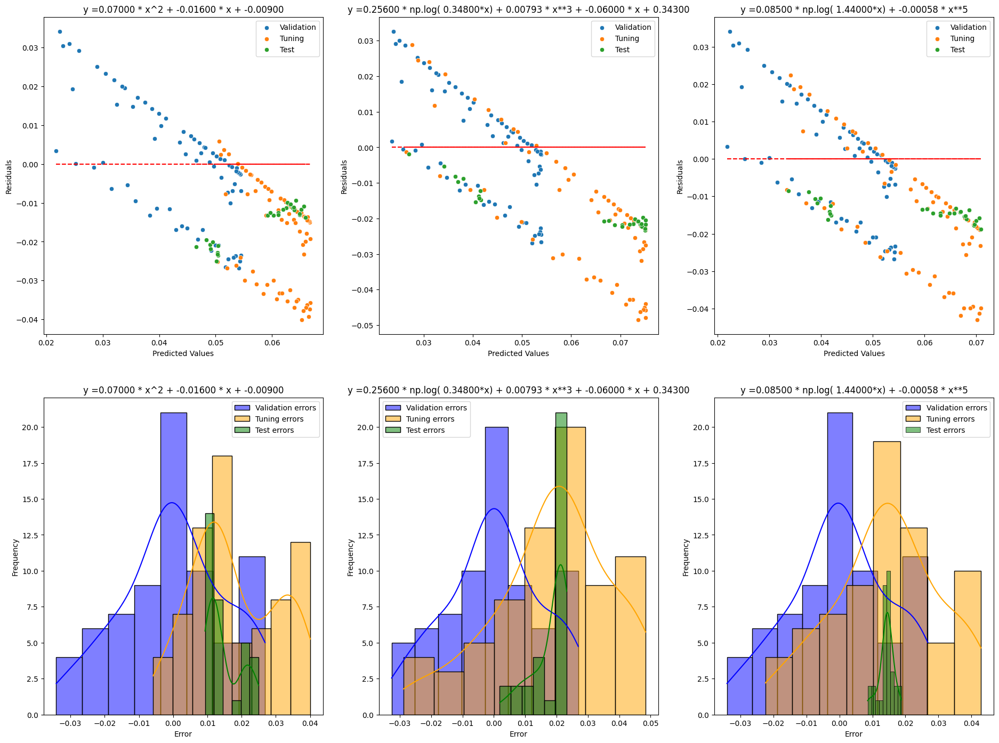

In [36]:
 model_evalution_report(uncorrelated_weighted_portfolio_trails_simulation_df)

#### Winning Model

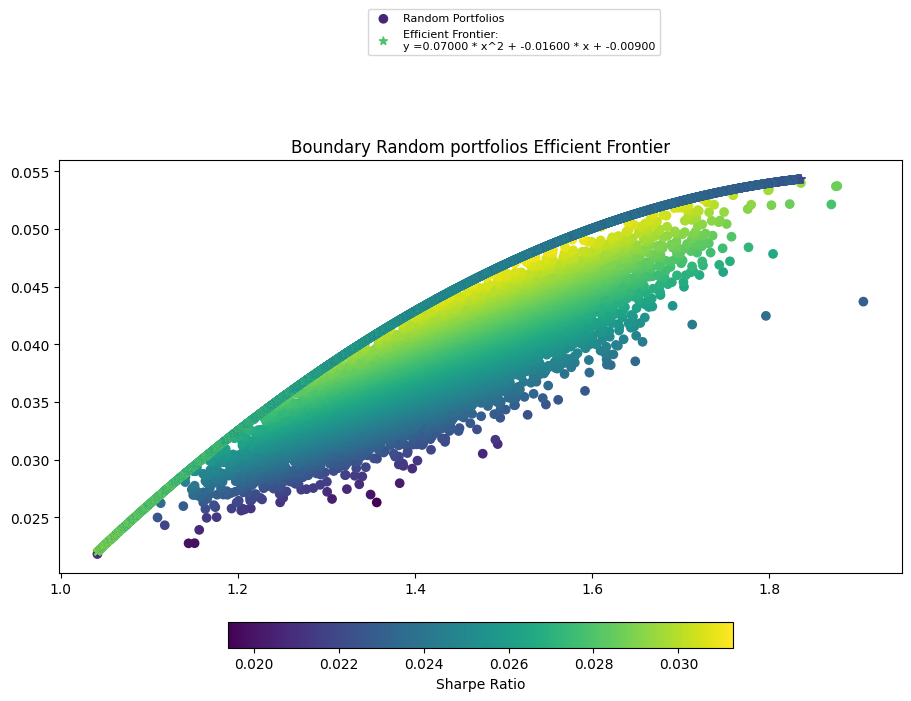

In [37]:
def get_wining_model(uncorrelated_weighted_portfolio_trails_simulation_df):
    model_poly_d2, model_poly_d3_log, model_poly_d5_log, popt_poly_d2, popt_poly_d3_log, popt_poly_d5_log, \
    x_test_poly_d2, x_test_poly_d3_log, x_test_poly_d5_log, y_test_poly_d2, y_model_test_pred_poly_d2, \
    y_test_poly_d3_log, y_model_test_pred_poly_d3_log, y_test_poly_d5_log, \
    y_model_test_pred_poly_d5_log, poly_d2_form, poly_d3_log_form, poly_d5_log_form= test_the_model(uncorrelated_weighted_portfolio_trails_simulation_df)


    return model_poly_d2, popt_poly_d2, poly_d2_form


def plotting_wining_model(uncorrelated_weighted_portfolio_trails_simulation_df, model_poly_d2,popt_poly_d2, poly_d2_form):
    fig, ax =plt.subplots(figsize=(9, 7), constrained_layout=True)
    cplt = model_uperBound_efficient_frontier(uncorrelated_weighted_portfolio_trails_simulation_df, model_poly_d2,popt_poly_d2, ax, poly_d2_form)

    cb = fig.colorbar(cplt, ax=ax, label='Sharpe Ratio',orientation='horizontal',shrink=0.6)

model_poly_d2, popt_poly_d2, poly_d2_form = get_wining_model(uncorrelated_weighted_portfolio_trails_simulation_df)
plotting_wining_model(uncorrelated_weighted_portfolio_trails_simulation_df, model_poly_d2,popt_poly_d2, poly_d2_form)

### Prediction when the investor's risk level metric (portfolio standard deviation) is known
Here we will use the wining efficient frontier model to predict the portfolio expected return. Then will calculater the portfolio weightsand and investment strategy
The following 2 Strategies will be implemented to manage the volatility:

1. Asset Allocation: Adjusting the proportion of different asset classes in a portfolio to balance risk.
2. Diversification: Spreading investments across various sectors.

In [38]:
def plotting_selected_efficient_frontier_predicted_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df,risk):
    fig, ax =plt.subplots(figsize=(12, 5))
    text = ["A", "B", "C", "D", "E", "F"]
    model_poly_d2, popt_poly_d2, poly_d2_form = get_wining_model(uncorrelated_weighted_portfolio_trails_simulation_df)
    predicted_return = model_poly_d2(risk, *popt_poly_d2)
    ax.plot(risk, predicted_return,'*',color='red',label='Optimal portfolios')
    scplt = model_uperBound_efficient_frontier(uncorrelated_weighted_portfolio_trails_simulation_df, model_poly_d2,popt_poly_d2, ax, poly_d2_form)
    portfolio_annotation(risk, predicted_return, text, ax)
    cb = fig.colorbar(scplt, ax=ax, label='Sharpe Ratio')

In [39]:
def predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, risk):
    model_poly_d2, popt_poly_d2, poly_d2_form = get_wining_model(uncorrelated_weighted_portfolio_trails_simulation_df)
    display(poly_d2_form)
    return model_poly_d2(risk, *popt_poly_d2)


pred_portfolio_expected_return  = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, 1.3)


'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

In [40]:

def get_assets_expected_returns_and_tickers(log_returns, most_diversify_portfolio_assets_list):

    uncorrelated_assets_log_returns = log_returns[most_diversify_portfolio_assets_list]
    uncorrelated_assets_expected_return = uncorrelated_assets_log_returns.mean()
    #display(uncorrelated_assets_espected_return)
    #type(uncorrelated_assets_espected_return)
    assets_ticker_list = uncorrelated_assets_expected_return.index.tolist()
    #display(assets_ticker_list)
    assets_expected_returns_list = uncorrelated_assets_expected_return.to_list()
    return assets_expected_returns_list, assets_ticker_list

assets_expected_returns_list, assets_ticker_list = get_assets_expected_returns_and_tickers(log_returns,most_diversify_portfolio_assets_list)

In [41]:

def get_portfolio_investment_strategy_df( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                         most_diversify_portfolio_assets_list, portfolio_risk):

    sum_weight_and_portfolio_return_list = []

    #stocks expected return
    assets_expected_returns_list, assets_ticker_list = get_assets_expected_returns_and_tickers(log_returns,most_diversify_portfolio_assets_list)
    assets_expected_returns_list = np.array(assets_expected_returns_list)*100
    assets_expected_returns_list = list(np.round(assets_expected_returns_list, 3))

    #predicted portfolio expected return, given the portfolio volatility(risk)
    portfolio_return_predicted_value= round(predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk),3)

    #assets expected return absolute deviation from the portfolio expected return
    assets_expected_return_absolute_deviation_list = abs(portfolio_return_predicted_value - assets_expected_returns_list)
    assets_expected_return_absolute_deviation_list = list(np.round(assets_expected_return_absolute_deviation_list, 3))
    sum_expected_return_absolute_deviation = round(sum(assets_expected_return_absolute_deviation_list),3)

    #assets weight coefficients list
    assets_weight_list = assets_expected_return_absolute_deviation_list/sum_expected_return_absolute_deviation
    assets_weight_list = list(np.round(assets_weight_list, 3))

    #include the index content into the portfolio strategy data frame
    portfolio_content_df = index_content_df[index_content_df['Ticker'].isin(assets_ticker_list)]

    #portfolio strategy data frame
    portfolio_investment_strategy_df = pd.DataFrame({'Ticker':assets_ticker_list,'Weight':assets_weight_list,
                                                     'Asset Espected Returns':assets_expected_returns_list})
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Weight',ascending=True)

    #merge content data frame and the weght data frame
    portfolio_investment_strategy_df = pd.merge(portfolio_content_df, portfolio_investment_strategy_df, how="inner", on=["Ticker"])

    return portfolio_investment_strategy_df


portfolio_investment_strategy_df = get_portfolio_investment_strategy_df( log_returns,
                                                    uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, 1.3)

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

In [42]:
def portfolio_annotation(x, y, text, ax):
    # Loop for annotation of all points
    for i in range(len(x)):
        ax.annotate(text[i]+'(σp='+str(round(x[i],3))+';E_rp='+ str(round(y[i],3))+')',
                    xy=(x[i], y[i]),xycoords='data', xytext= (x[i], y[i] ))


In [43]:
def plot_investment_strategy_pie_chart(log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                       most_diversify_portfolio_assets_list, portfolio_risk, risk_profile = ''):

    portfolio_investment_strategy_df = get_portfolio_investment_strategy_df( \
                log_returns,uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, portfolio_risk)
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Weight',ascending=True)

    industry_labels = portfolio_investment_strategy_df['Industry'].values
    sector_labels = portfolio_investment_strategy_df['Sector'].values
    weight_values = portfolio_investment_strategy_df['Weight'].values

    # Create subplots: use 'domain' type for Pie subplot
    fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

    fig.add_trace(go.Pie(labels=industry_labels, values=weight_values, name="Industry",
                        legendgroup="Industry",  # this can be any string, not just "group"
                        legendgrouptitle_text="Industry"), 1, 1)
    fig.add_trace(go.Pie(labels=sector_labels, values=weight_values, name="Sector",
                        legendgroup="Sector",  # this can be any string, not just "group"
                        legendgrouptitle_text="Sector"), 1, 2)



    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hole=.5, hoverinfo="label+percent+name")

    fig.update_layout(
    title_text= risk_profile+" Suggested Investment by Industry & Sector",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Industry', x=0.14, y=0.5, font_size=20, showarrow=False),
                 dict(text='Sector', x=0.84, y=0.5, font_size=20, showarrow=False)],
    height=500,
    width=800,
    autosize=True,
    margin=dict(t=0, b=0, l=50, r=0),
    legend_tracegroupgap = 0,
    legend=dict(
                    orientation="v",
                    yanchor="bottom",
                    y=0,
                    xanchor="right",
                    x=1.5),
     title=dict(
                    y=0.9,
                    x=0.1,
                    xanchor= 'left',
                    yanchor= 'top'))

    fig.show()

In [44]:
def plot_asset_return_pie_chart(log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                most_diversify_portfolio_assets_list, portfolio_risk, risk_profile = ''):

    portfolio_investment_strategy_df = get_portfolio_investment_strategy_df( \
                log_returns,uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, portfolio_risk)
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Asset Espected Returns',ascending=True)

    industry_labels = portfolio_investment_strategy_df['Industry'].values
    sector_labels = portfolio_investment_strategy_df['Sector'].values
    weight_values = portfolio_investment_strategy_df['Asset Espected Returns'].values

    # Create subplots: use 'domain' type for Pie subplot
    fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

    fig.add_trace(go.Pie(labels=industry_labels, values=weight_values, name="Industry",
                        legendgroup="Industry",  # this can be any string, not just "group"
                        legendgrouptitle_text="Industry"), 1, 1)
    fig.add_trace(go.Pie(labels=sector_labels, values=weight_values, name="Sector",
                        legendgroup="Sector",  # this can be any string, not just "group"
                        legendgrouptitle_text="Sector"), 1, 2)

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hole=.5, hoverinfo="label+percent+name")

    fig.update_layout(
    title_text=risk_profile+" Asset Returns by Industry & Sector",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Industry', x=0.14, y=0.5, font_size=20, showarrow=False),
                 dict(text='Sector', x=0.84, y=0.5, font_size=20, showarrow=False)],
    height=500,
    width=800,
    autosize=True,
    margin=dict(t=0, b=0, l=50, r=0),
    legend_tracegroupgap = 0,
    legend=dict(
                    orientation="v",
                    yanchor="bottom",
                    y=0,
                    xanchor="right",
                    x=1.5),
     title=dict(
                    y=0.9,
                    x=0.1,
                    xanchor= 'left',
                    yanchor= 'top'))

    fig.show()

In [45]:
#Finding weights of portfolio when return given
def plot_asset_return( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                      most_diversify_portfolio_assets_list, portfolio_risk,risk_profile = ''):
    fig, ax =plt.subplots(figsize=(12, 6))

    #plotting Asset Espected Returns
    portfolio_investment_strategy_df = get_portfolio_investment_strategy_df( \
                log_returns,uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, portfolio_risk)
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Asset Espected Returns',ascending=True)
    column_list = [':      ' for i in range(len(portfolio_investment_strategy_df))]
    column_df = pd.DataFrame({'colum': column_list})

    asset_return = portfolio_investment_strategy_df['Asset Espected Returns']
    strategy_Tickers = portfolio_investment_strategy_df['Sector'] + column_df['colum'] + \
                        portfolio_investment_strategy_df['Industry'] + column_df['colum'] + \
                        portfolio_investment_strategy_df['Company'] + \
                        column_df['colum'] + portfolio_investment_strategy_df['Ticker']

    bar_container= ax.barh(strategy_Tickers, asset_return*100)
    ax.axes.get_xaxis().set_visible(False)
    # setting label of y-axis
    ax.set_ylabel("Asset Tickers")
    # setting label of x-axis
    ax.set_xlabel("Asset Return")
    ax.set_title(risk_profile+" Asset Return",fontsize=22,  horizontalalignment='right',fontweight='roman')
    ax.bar_label(bar_container, fmt='{:,.1f}%')


    plt.show()
    #Asset return pie chart
    plot_asset_return_pie_chart( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                most_diversify_portfolio_assets_list, portfolio_risk, risk_profile)


In [46]:
#Finding weights of portfolio when return given
def plot_predicted_portfolio_weight( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                    most_diversify_portfolio_assets_list, portfolio_risk, risk_profile = ''):
    fig, ax =plt.subplots(figsize=(12, 6))
    portfolio_investment_strategy_df = get_portfolio_investment_strategy_df( \
                log_returns,uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, portfolio_risk)
    portfolio_investment_strategy_df = portfolio_investment_strategy_df.sort_values(by='Weight',ascending=True)
    column_list = [':      ' for i in range(len(portfolio_investment_strategy_df))]
    column_df = pd.DataFrame({'colum': column_list})

    #plotting
    display(portfolio_investment_strategy_df.style.hide(axis='index'))

    strategy_Weight = portfolio_investment_strategy_df['Weight']
    strategy_Tickers = portfolio_investment_strategy_df['Sector'] + column_df['colum'] + \
                        portfolio_investment_strategy_df['Industry'] + column_df['colum'] + \
                        portfolio_investment_strategy_df['Company'] + \
                        column_df['colum'] + portfolio_investment_strategy_df['Ticker']
    bar_container= ax.barh(strategy_Tickers, strategy_Weight*100)

    ax.axes.get_xaxis().set_visible(False)
    #setting label of y-axis
    ax.set_ylabel("Asset Tickers")
    # setting label of x-axis
    ax.set_xlabel("Portfolio Weight")
    ax.set_title(risk_profile+" suggested Portfolio Allocation", fontsize=22, horizontalalignment='right')
    ax.bar_label(bar_container, fmt='{:,.1f}%')

    plt.show()

    #Investement strategy pie chart
    plot_investment_strategy_pie_chart( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                       most_diversify_portfolio_assets_list, portfolio_risk, risk_profile)


In [47]:

def get_portolio_risk_input(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk):
    predited_portfolio_return = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk)
    prediction_df = pd.DataFrame([{'portfolio_risk':portfolio_risk,'Predited Portfolio Return':predited_portfolio_return}])
    display(prediction_df.style.hide(axis='index'))


In [48]:
def plot_risk_tolerence_treshold(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk = 1.3):
    risk_tolerence_threshold_df = risk_tolerence_threshold(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk)

    print('\n                                              **********************************************************************\n'+
              '                                               Optimal Portfolio Table - Winning Model and Efficient Frontier\n'+
              '                                              **********************************************************************\n')
    display(risk_tolerence_threshold_df)
    portfolio_risk_values =  risk_tolerence_threshold_df['Portfolio Risk(volatility)'].values
    plotting_selected_efficient_frontier_predicted_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df,portfolio_risk_values)


In [49]:
def risk_tolerence_threshold(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk = 1.3):
    #define threshold to track the investor risk tolerence:High risk tolerance (aggressive investors), Moderate risk tolerance (moderate investors)
    #Low risk tolerance (conservative investors)
    pred_random_portfolio_return = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk)

    max_E_rp_sharpe_ratio, max_E_rp, max_E_rp_σp = get_maximun_return_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df)
    pred_maximun_return_portfolio = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, max_E_rp_σp)

    max_σp_E_rp_sharpe_ratio, max_σp_E_rp, max_σp = get_maximun_risk_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df)
    pred_maximun_risk_portfolio = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, max_σp)

    maximum_sharpe_ratio, maximum_sharpe_ratio_σp_E_rp, maximum_sharpe_ratio_σp =  get_maximum_sharpe_ratio(uncorrelated_weighted_portfolio_trails_simulation_df)
    pred_maximum_sharpe_ratio = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, maximum_sharpe_ratio_σp)

    minimum_σp_E_rp_sharpe_ratio, minimum_σp_E_rp, minimum_σp = get_minimum_risk_portfolio(uncorrelated_weighted_portfolio_trails_simulation_df)
    pred_minimum_risk_portfolio = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, minimum_σp)
    avg_risk = uncorrelated_weighted_portfolio_trails_simulation_df['σp'].mean()
    pred_avg_risk_Expected_return = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, avg_risk)

    index = ['A', 'B', 'C', 'D', 'E', 'F']
    risk_tolerence_threshold_df =pd.DataFrame({'Portfolio Type': ['Random Portfolio', 'Maximun Return Portfolio','Maximun Risk Portfolio',
                                                                  'Maximum Sharpe Ratio(Tangent Portfolio)',
                                              'Minimum Risk Portfolio', 'Average Volatilty'],
                              'Predicted Expected Return': [pred_random_portfolio_return, pred_maximun_return_portfolio, pred_maximun_risk_portfolio,
                                                            pred_maximum_sharpe_ratio, pred_minimum_risk_portfolio, pred_avg_risk_Expected_return ],
                              'Portfolio Risk(volatility)':[portfolio_risk, max_E_rp_σp, max_σp, maximum_sharpe_ratio_σp, minimum_σp, avg_risk],
                              'Sharpe Ratio':[pred_random_portfolio_return/portfolio_risk, pred_maximun_return_portfolio/maximum_sharpe_ratio_σp,
                                              pred_maximun_risk_portfolio/max_σp, pred_maximum_sharpe_ratio/maximum_sharpe_ratio_σp ,
                                              pred_minimum_risk_portfolio/ minimum_σp, pred_avg_risk_Expected_return/avg_risk]},
                                           index=index)

    return risk_tolerence_threshold_df


In [50]:

def plot_suggested_portfolio_structure( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                       most_diversify_portfolio_assets_list, portfolio_risk):

    risk_tolerence_threshold_df =  risk_tolerence_threshold(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk)

    for i in range(len(risk_tolerence_threshold_df)):
        portfolio_risk = risk_tolerence_threshold_df['Portfolio Risk(volatility)'][i]
        predicted_expected_return = risk_tolerence_threshold_df['Predicted Expected Return'][i]
        sharpe_ratio = risk_tolerence_threshold_df['Sharpe Ratio'][i]
        print('\n                                    *************************************\n'+
              '                                      Portfolio Risk(volatility)  : '+str(round(portfolio_risk,3))+'\n'+
              '                                      Predicted Expected Return   : '+str(round(predicted_expected_return,3))+'\n'+
              '                                      Sharpe Ratio                : '+str(round(sharpe_ratio,3))+'\n'
              '                                     *************************************\n')
        plot_predicted_portfolio_weight( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                        most_diversify_portfolio_assets_list, portfolio_risk)
        plot_asset_return( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df, most_diversify_portfolio_assets_list, portfolio_risk)

In [51]:
def risk_tolerence_encoding(uncorrelated_weighted_portfolio_trails_simulation_df):

    risk_tolerence_threshold_df = risk_tolerence_threshold(uncorrelated_weighted_portfolio_trails_simulation_df)
    max_Erp = risk_tolerence_threshold_df['Portfolio Risk(volatility)']['B']
    max_riskp = risk_tolerence_threshold_df['Portfolio Risk(volatility)']['C']
    max_shape_ratiop = risk_tolerence_threshold_df['Portfolio Risk(volatility)']['D']
    min_riskp = risk_tolerence_threshold_df['Portfolio Risk(volatility)']['E']
    avg_riskp = risk_tolerence_threshold_df['Portfolio Risk(volatility)']['F']
    #σp	E_rp

    simulated_risk_list =  uncorrelated_weighted_portfolio_trails_simulation_df['σp']
    pred_Expected_return_list = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, simulated_risk_list)
    sharpe_ratio_list =pred_Expected_return_list/simulated_risk_list

    risk_profile_list = []
    risk_profile_encoding_list = []

    for i in range(len(simulated_risk_list)):
        portfolio_risk = simulated_risk_list[i]
        if portfolio_risk >= max_shape_ratiop and portfolio_risk <=avg_riskp :
            risk_profile_list.append('Moderate')
            risk_profile_encoding_list.append(1)
        elif portfolio_risk <max_shape_ratiop:
            risk_profile_list.append('Conservative')
            risk_profile_encoding_list.append(2)
        elif portfolio_risk  > avg_riskp:
            risk_profile_list.append('Aggressive')
            risk_profile_encoding_list.append(3)

    risk_tolerence_rating_df= pd.DataFrame({'Simulated Risk': simulated_risk_list, 'Predicted Expected Return':pred_Expected_return_list,
                                            'Sharpe Ratio':sharpe_ratio_list, 'Risk Profile':risk_profile_list,
                                            'Risk Profile Encoding Value':risk_profile_encoding_list})
    return  risk_tolerence_rating_df

risk_tolerence_encoding_df = risk_tolerence_encoding(uncorrelated_weighted_portfolio_trails_simulation_df)
display(risk_tolerence_encoding_df)

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

,Simulated Risk,Predicted Expected Return,Sharpe Ratio,Risk Profile,Risk Profile Encoding Value
0,1.378034,0.041941,0.030435,Conservative,2
1,1.488217,0.046466,0.031223,Conservative,2
2,1.619167,0.050571,0.031233,Conservative,2
3,1.403634,0.043080,0.030692,Conservative,2
4,1.286789,0.037452,0.029105,Conservative,2
...,...,...,...,...,...
9995,1.423044,0.043908,0.030855,Conservative,2
9996,1.431666,0.044266,0.030919,Conservative,2
9997,1.506756,0.047132,0.031280,Conservative,2
9998,1.437042,0.044486,0.030957,Conservative,2


In [52]:
def get_risk_profile_matrix(uncorrelated_weighted_portfolio_trails_simulation_df):
    risk_tolerence_encoding_df = risk_tolerence_encoding(uncorrelated_weighted_portfolio_trails_simulation_df)
    risk_profile_matrix =  risk_tolerence_encoding_df.groupby('Risk Profile')[['Simulated Risk','Predicted Expected Return','Sharpe Ratio']].mean()
    return pd.DataFrame(risk_profile_matrix)

risk_profile_matrix = get_risk_profile_matrix(uncorrelated_weighted_portfolio_trails_simulation_df)
risk_profile_matrix

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

,Simulated Risk,Predicted Expected Return,Sharpe Ratio
Risk Profile,,,
Aggressive,1.683263,0.051984,0.030893
Conservative,1.424303,0.043572,0.030531


In [53]:

def plot_suggested_risk_profile_portfolio_structure( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                                    most_diversify_portfolio_assets_list, portfolio_risk=1.3):

    #risk_tolerence_threshold_df =  risk_tolerence_threshold(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk)
    risk_profile_matrix = get_risk_profile_matrix(uncorrelated_weighted_portfolio_trails_simulation_df)

    print('\n                                              **********************************************************************\n'+
              '                                                    Investment Profile Simulation And Portfolio Allocation \n'+
              '                                              **********************************************************************\n')
    display(risk_profile_matrix)
    for i in range(len(risk_profile_matrix)):
        risk_profile = risk_profile_matrix.index[i]
        portfolio_risk = risk_profile_matrix['Simulated Risk'][i]
        predicted_expected_return = risk_profile_matrix['Predicted Expected Return'][i]
        sharpe_ratio = risk_profile_matrix['Sharpe Ratio'][i]
        print('\n                                    *****************************************************\n'+
              '                                      Risk Profile                : '+risk_profile+' Investment \n'+
              '                                      Simulated Risk              : '+str(round(portfolio_risk,3))+'\n'+
              '                                      Predicted Expected Return   : '+str(round(predicted_expected_return,3))+'\n'+
              '                                      Sharpe Ratio                : '+str(round(sharpe_ratio,3))+'\n'
              '                                     *****************************************************\n')
        plot_predicted_portfolio_weight( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                        most_diversify_portfolio_assets_list, portfolio_risk,risk_profile)
        plot_asset_return( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                          most_diversify_portfolio_assets_list, portfolio_risk,risk_profile)

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                              **********************************************************************
                                               Optimal Portfolio Table - Winning Model and Efficient Frontier
                                              **********************************************************************



,Portfolio Type,Predicted Expected Return,Portfolio Risk(volatility),Sharpe Ratio
A,Random Portfolio,0.038144,1.300000,0.029341
B,Maximun Return Portfolio,0.054567,1.869268,0.033363
C,Maximun Risk Portfolio,0.054730,1.906337,0.028710
D,Maximum Sharpe Ratio(Tangent Portfolio),0.050988,1.635567,0.031174
E,Minimum Risk Portfolio,0.021171,1.029397,0.020566
F,Average Volatilty,0.044281,1.432020,0.030922


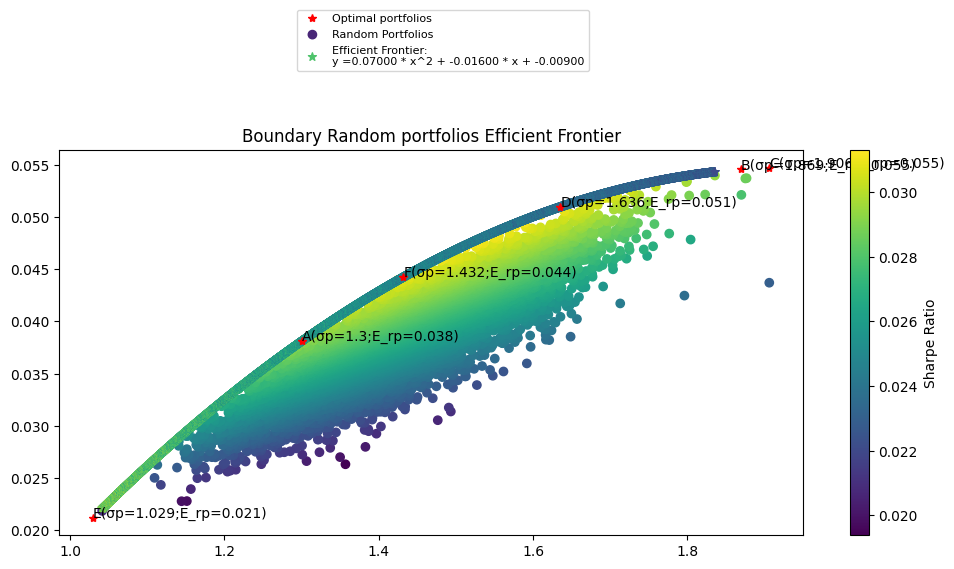

In [54]:
plot_risk_tolerence_treshold(uncorrelated_weighted_portfolio_trails_simulation_df)

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *************************************
                                      Portfolio Risk(volatility)  : 1.3
                                      Predicted Expected Return   : 0.038
                                      Sharpe Ratio                : 0.029
                                     *************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.005000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.033000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.037000,0.030000
BN,Brookfield Corporation,Financial Services,Asset Management,0.037000,0.046000
ATS,ATS Corporation,Industrials,Industrial Products,0.056000,0.050000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.056000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.065000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.112000,0.014000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.167000,0.074000
TVE,Tamarack Valley Energy Ltd.,Energy,Oil & Gas Exploration and Production,0.177000,0.000000


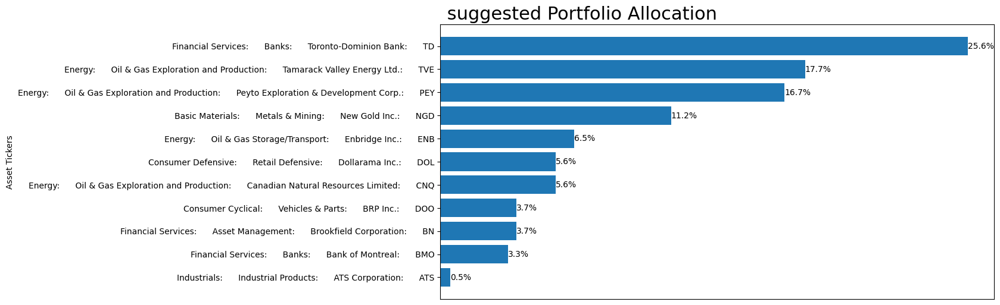

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

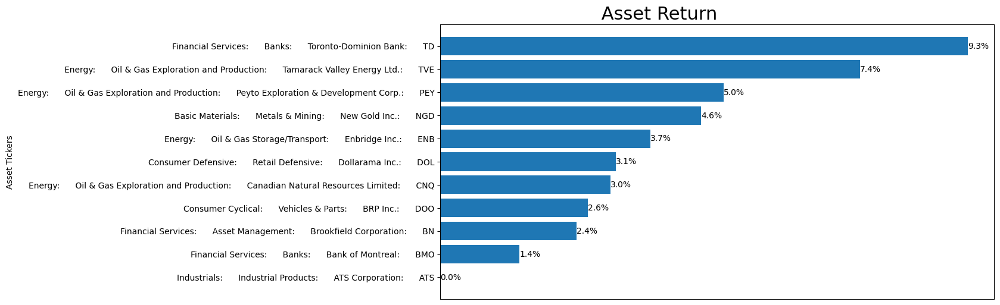

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *************************************
                                      Portfolio Risk(volatility)  : 1.869
                                      Predicted Expected Return   : 0.055
                                      Sharpe Ratio                : 0.033
                                     *************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ATS,ATS Corporation,Industrials,Industrial Products,0.017000,0.050000
BN,Brookfield Corporation,Financial Services,Asset Management,0.031000,0.046000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.061000,0.037000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.065000,0.074000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.082000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.085000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.099000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.105000,0.024000
CNQ,Canadian Natural Resources Limited,Energy,Oil & Gas Exploration and Production,0.129000,0.093000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.139000,0.014000


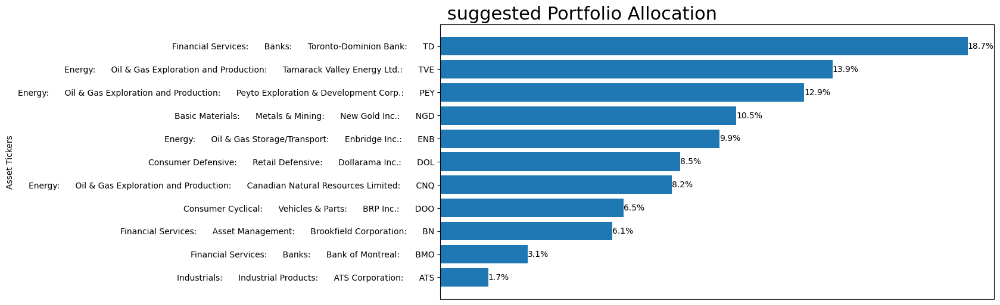

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

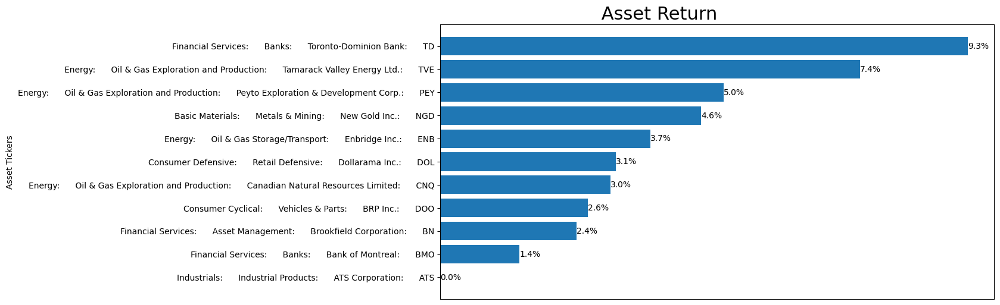

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *************************************
                                      Portfolio Risk(volatility)  : 1.906
                                      Predicted Expected Return   : 0.055
                                      Sharpe Ratio                : 0.029
                                     *************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ATS,ATS Corporation,Industrials,Industrial Products,0.017000,0.050000
BN,Brookfield Corporation,Financial Services,Asset Management,0.031000,0.046000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.061000,0.037000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.065000,0.074000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.082000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.085000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.099000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.105000,0.024000
CNQ,Canadian Natural Resources Limited,Energy,Oil & Gas Exploration and Production,0.129000,0.093000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.139000,0.014000


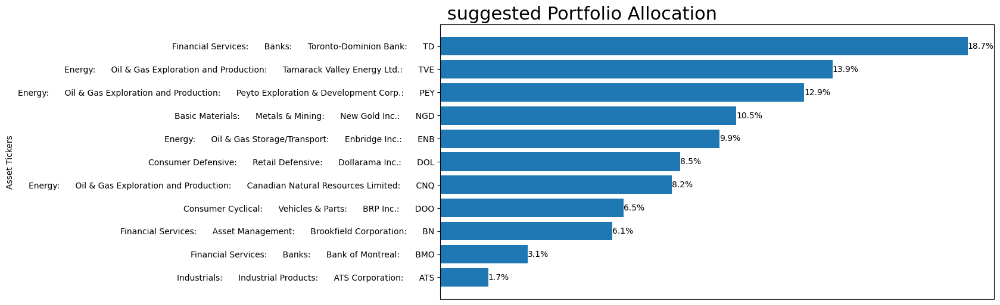

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

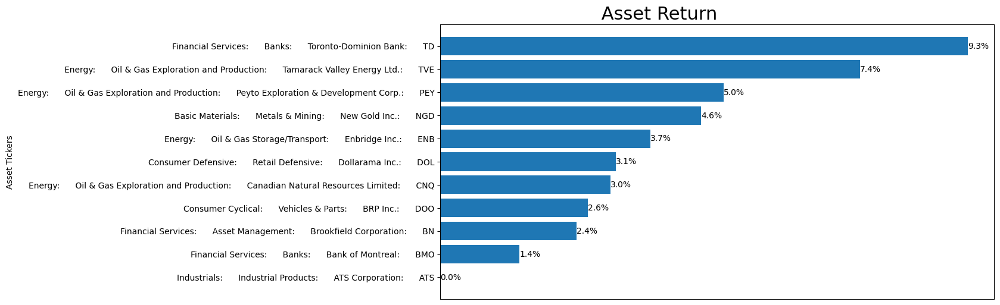

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *************************************
                                      Portfolio Risk(volatility)  : 1.636
                                      Predicted Expected Return   : 0.051
                                      Sharpe Ratio                : 0.031
                                     *************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ATS,ATS Corporation,Industrials,Industrial Products,0.004000,0.050000
BN,Brookfield Corporation,Financial Services,Asset Management,0.019000,0.046000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.053000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.075000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.079000,0.030000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.086000,0.074000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.094000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.102000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.139000,0.014000
CNQ,Canadian Natural Resources Limited,Energy,Oil & Gas Exploration and Production,0.158000,0.093000


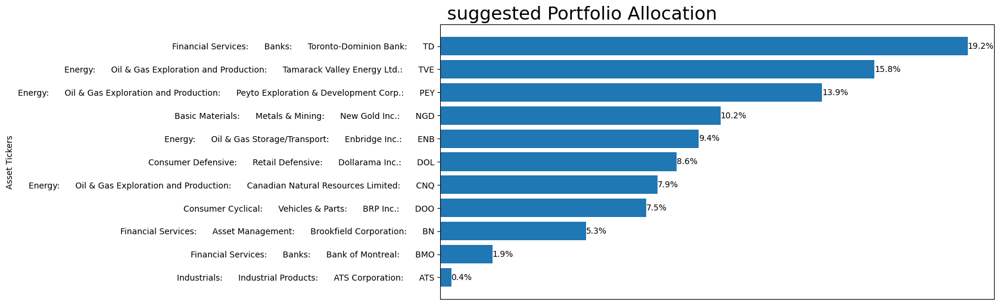

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

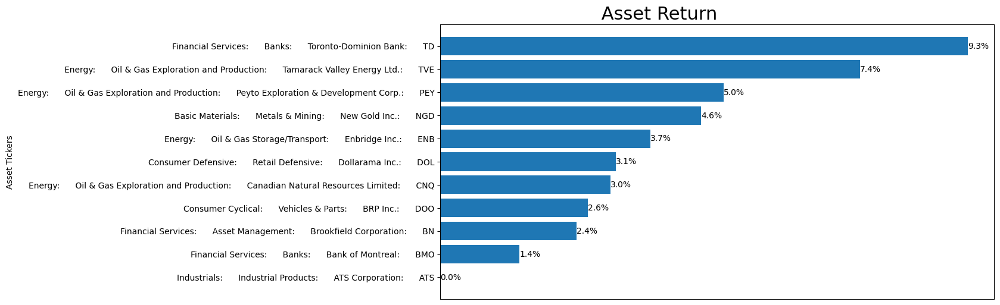

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *************************************
                                      Portfolio Risk(volatility)  : 1.029
                                      Predicted Expected Return   : 0.021
                                      Sharpe Ratio                : 0.021
                                     *************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
TD,Toronto-Dominion Bank,Financial Services,Banks,0.012000,0.024000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.020000,0.026000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.028000,0.014000
BMO,Bank of Montreal,Financial Services,Banks,0.036000,0.030000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.040000,0.031000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.064000,0.037000
TVE,Tamarack Valley Energy Ltd.,Energy,Oil & Gas Exploration and Production,0.084000,0.000000
BN,Brookfield Corporation,Financial Services,Asset Management,0.100000,0.046000
ATS,ATS Corporation,Industrials,Industrial Products,0.116000,0.050000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.212000,0.074000


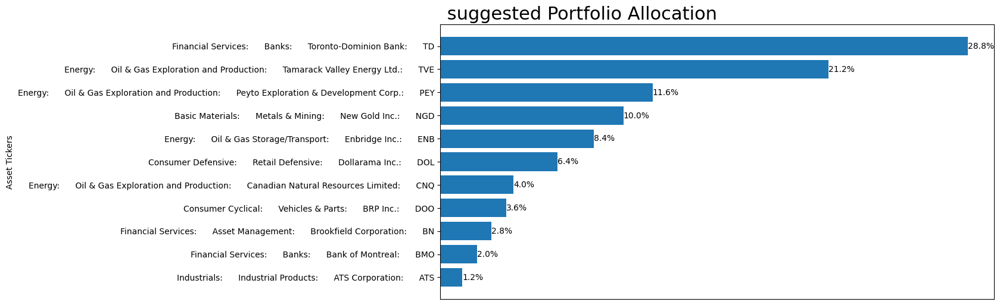

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

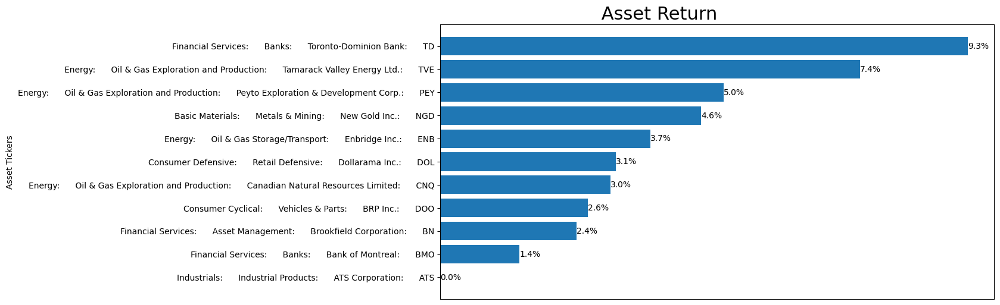

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *************************************
                                      Portfolio Risk(volatility)  : 1.432
                                      Predicted Expected Return   : 0.044
                                      Sharpe Ratio                : 0.031
                                     *************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
BN,Brookfield Corporation,Financial Services,Asset Management,0.009000,0.046000
ATS,ATS Corporation,Industrials,Industrial Products,0.026000,0.050000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.030000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.056000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.060000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.077000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.086000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.129000,0.014000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.129000,0.074000
TVE,Tamarack Valley Energy Ltd.,Energy,Oil & Gas Exploration and Production,0.189000,0.000000


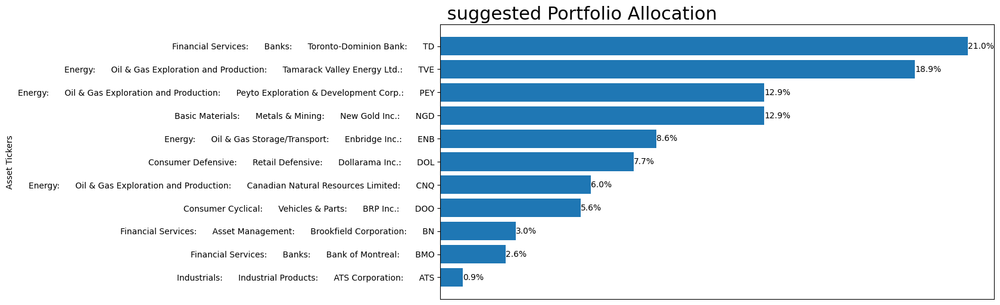

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

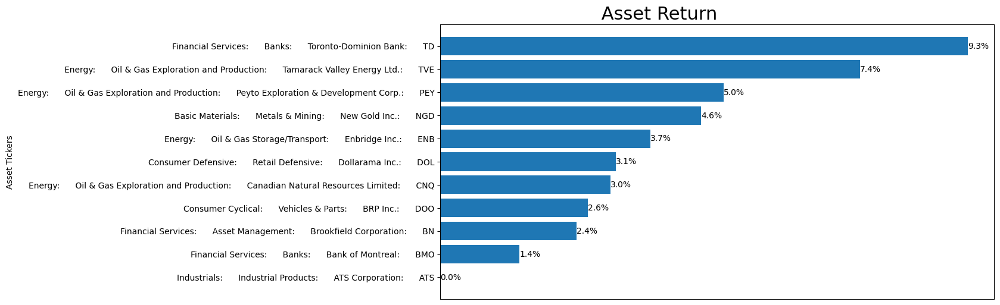

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

In [55]:
plot_suggested_portfolio_structure( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                   most_diversify_portfolio_assets_list, 1.3)

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                              **********************************************************************
                                                    Investment Profile Simulation And Portfolio Allocation 
                                              **********************************************************************



,Simulated Risk,Predicted Expected Return,Sharpe Ratio
Risk Profile,,,
Aggressive,1.683263,0.051984,0.030893
Conservative,1.424303,0.043572,0.030531



                                    *****************************************************
                                      Risk Profile                : Aggressive Investment 
                                      Simulated Risk              : 1.683
                                      Predicted Expected Return   : 0.052
                                      Sharpe Ratio                : 0.031
                                     *****************************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ATS,ATS Corporation,Industrials,Industrial Products,0.007000,0.050000
BN,Brookfield Corporation,Financial Services,Asset Management,0.022000,0.046000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.055000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.077000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.081000,0.030000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.081000,0.074000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.095000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.103000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.139000,0.014000
CNQ,Canadian Natural Resources Limited,Energy,Oil & Gas Exploration and Production,0.150000,0.093000


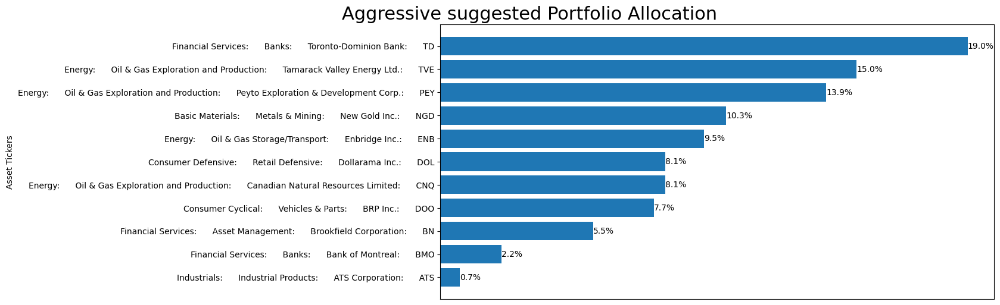

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

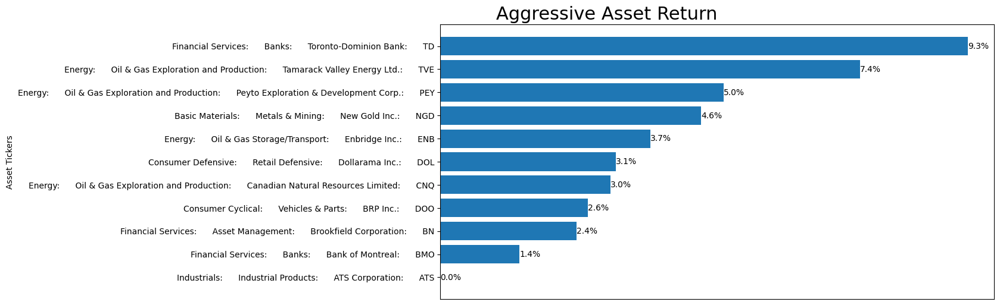

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *****************************************************
                                      Risk Profile                : Conservative Investment 
                                      Simulated Risk              : 1.424
                                      Predicted Expected Return   : 0.044
                                      Sharpe Ratio                : 0.031
                                     *****************************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
BN,Brookfield Corporation,Financial Services,Asset Management,0.009000,0.046000
ATS,ATS Corporation,Industrials,Industrial Products,0.026000,0.050000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.030000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.056000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.060000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.077000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.086000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.129000,0.014000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.129000,0.074000
TVE,Tamarack Valley Energy Ltd.,Energy,Oil & Gas Exploration and Production,0.189000,0.000000


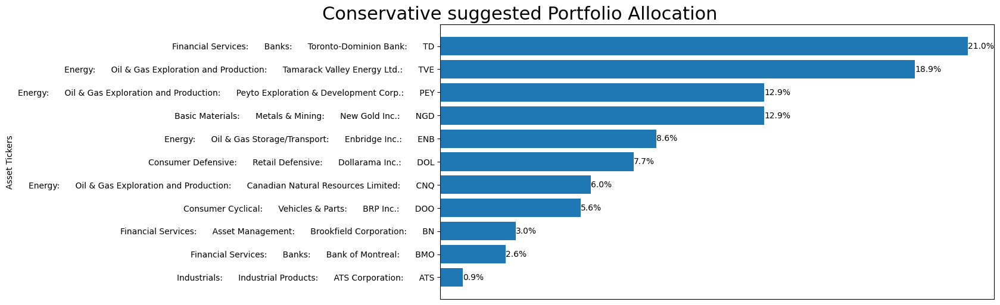

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

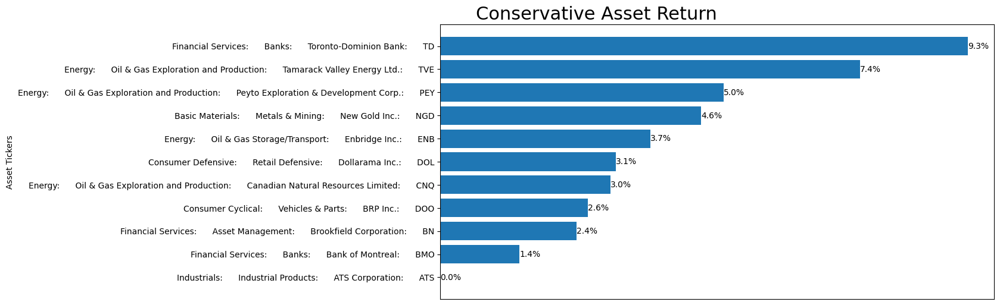

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

In [56]:
plot_suggested_risk_profile_portfolio_structure( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                                most_diversify_portfolio_assets_list, portfolio_risk=1.3)

### Investment Risk Profiles Simulation and Portfolio Strategy Using K-means Clustering

My main objective is to use  K-means clustering to found out the investment type of risk tolerance: very conservative, conservative, moderate, aggressive and very aggressive. From the Elbow model, I will  assume the optimal number of clusters is 5

In this section, I will combine K-means clustering with efficient frontier modeling to dig into the random generated portfolios.  In order to simulate the investors risk tolerance, I will use K-means clustering and optimal portfolio modeling on top of the previous covariance matrix technique that I used along with the covariance threshold  to reduce the volume of the assets. I used the covariance coefficient to filter uncorrelated assets.   Then I will recommend an investment strategy that optimize return for each type for risk tolerance.
I'm using the wining model 'y =0.07000 * x^2 + -0.01600 * x + -0.00900' to predict the portfolio expected returns. The simulated portfolio risk is combined with the simulated the portfolio expected return and the predicted expected return to set the random efficient frontier data. The random efficient frontier data is then used as input for the  K-means cluster models. The cluster centroid corresponding to each type of risk tolerance is projected on the winning efficient frontier model in order to find out the optimal portfolio that corresponds to each type of risk tolerance.


In [57]:
def calculate_number_of_cluster(uncorrelated_weighted_portfolio_trails_simulation_df, n_components, ax):
    # Randomn efficient frontier data collection
    portfolio_risk_list = uncorrelated_weighted_portfolio_trails_simulation_df['σp']
    portefolio_return_list = uncorrelated_weighted_portfolio_trails_simulation_df['E_rp']
    predited_portfolio_return_list = predict_portfolio_expectded_return(uncorrelated_weighted_portfolio_trails_simulation_df, portfolio_risk_list)
    clipped_df = dataframe_clipping(portfolio_risk_list, portefolio_return_list, predited_portfolio_return_list )

    range_nbr_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
    # Step 2: Standardize the data
    scaler = StandardScaler()
    scaled_efficient_Frontier_data = scaler.fit_transform(clipped_df)


    #Determine the Number of clusters using Within Cluster Sum of Squares(wcss)
    wcss = [] # (Within Cluster Sum of Squares:inertia)
    silhouette_average_list = []

    for n2 in range_nbr_clusters:
        kmeans = KMeans(n_clusters=n2, init ='k-means++', max_iter=300,  n_init=10,random_state=0 )

        kmeans.fit(clipped_df)
        wcss.append(kmeans.inertia_)
        cluster_labels = kmeans.fit_predict(clipped_df)
        silhouette_average_list.append(silhouette_score(clipped_df, cluster_labels))

    ax1 = ax.twinx()
    ax.plot(range_nbr_clusters, wcss, 'b-', marker='o')
    ax1.plot(range_nbr_clusters,silhouette_average_list, 'g-', marker='o')

    ax.set_xlabel('Number of Clusters')
    ax.set_ylabel('Within Cluster Sum of Squares(wcss)')
    ax1.set_ylabel('Silhouette score')
    ax.set_title('Elbow Method & Silhouette Analysis for Optimal Number of Clusters')
    #plt.show()

    return clipped_df


In [58]:

def implement_k_means_clusters(uncorrelated_weighted_portfolio_trails_simulation_df, clipped_df, fig, ax):
    # our main objective is to use K-means clustering to found out investment risk profile: very conservative, conservative, moderate, aggressive and very aggressive.
    # So from the Elbow model, let's assume the optimal number of clusters is 5

    kmeans = KMeans(n_clusters=5, init ='k-means++', max_iter=300, n_init=10,random_state=0 )
    #clusters = kmeans.fit_predict(pca_data)
    pred_clusters = kmeans.fit_predict(clipped_df)

    rand_data_point_and_cluster_df = clipped_df
    rand_data_point_and_cluster_df['cluster'] = pred_clusters


    #investment profile
    investment_profiles_index = ['Moderate', 'Conservative', 'Agressive', 'Very Aggressive', 'Very Conservative']
    investment_profiles_color = ['purple', 'gold', 'limegreen', 'green', 'yellow']
    display(rand_data_point_and_cluster_df)

    #plot cluster
    for i in range(len(investment_profiles_index)):
        cspl = ax.scatter(x=rand_data_point_and_cluster_df.loc[(rand_data_point_and_cluster_df['cluster'] ==i), ['σp']],
                      y=rand_data_point_and_cluster_df.loc[(rand_data_point_and_cluster_df['cluster'] ==i), ['E_rp']],
                      c= investment_profiles_color[i], cmap="viridis",label=investment_profiles_index[i])

    # find clusters centratides
    cluster_centers_df = pd.DataFrame(kmeans.cluster_centers_)
    cluster_centers_df = cluster_centers_df.set_axis( kmeans.feature_names_in_ , axis=1)
    cluster_centers_df.index =  investment_profiles_index
    cluster_centers_df.index.names = ['Investment Profile']

    #plot clusters centroid.
    ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker=".", s=100, c='red', label = 'Cluster Centroids')

    #plot efficienr frontier model
    model_poly_d2, popt_poly_d2, poly_d2_form = get_wining_model(uncorrelated_weighted_portfolio_trails_simulation_df)
    xpoints,ypoints,top_sharpe_ratio_value_points = efficient_frontiere_optimal_portfolios_model_points(clipped_df,7)
    row, col = uncorrelated_weighted_portfolio_trails_simulation_df.shape
    x_model_σp = np.linspace(xpoints.min(), xpoints.max(), row)
    y_model_E_rp_pred = model_poly_d2(x_model_σp, *popt_poly_d2)
    scplt = ax.scatter(x=x_model_σp, y=y_model_E_rp_pred, marker="D", c= y_model_E_rp_pred/x_model_σp,
                     cmap="viridis",label='Efficient Frontier:\n'+poly_d2_form)
    cb = fig.colorbar(scplt, ax=ax, label='Sharpe Ratio')

    #find model predicted centroide expected return
    pred_centroide_Expr_list = []
    pred_centroide_Expr_list = model_poly_d2(cluster_centers_df['σp'], *popt_poly_d2)


    cluster_centers_df['Pred Centroide Expr'] =pred_centroide_Expr_list
    cluster_centers_df['Pred Centroide Sharpe Ratio'] =pred_centroide_Expr_list/cluster_centers_df['σp']
    display(cluster_centers_df)

    #plotting model centroide
    ax.scatter(cluster_centers_df['σp'], pred_centroide_Expr_list, marker=".", s=100, c='blue', label = 'Model Centroids')

    ax.set_title('Simulated Porfolio Clusters')
    ax.set_xlabel('Volatility(Risk)')
    ax.set_ylabel('Expected Return ')
    ax.legend(prop = { "size": 8 })
    plt.show()

    # Silhouette Score to evaluate the clustering
    sil_score = silhouette_score(clipped_df, pred_clusters)
    print(f'Silhouette Score: {sil_score}')
    return cluster_centers_df


In [59]:

def plot_predicted_clusters_risk_profile_portfolio_allocation( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                                              most_diversify_portfolio_assets_list, cluster_centers_df):


    print('\n                           **********************************************************************\n'+
              '                                 Investment Profile Simulation And Portfolio Allocation \n'+
              '                           **********************************************************************\n')
    for i in range(len(cluster_centers_df)):
        risk_profile = cluster_centers_df.index[i]
        portfolio_risk = cluster_centers_df['σp'][i]
        predicted_expected_return = cluster_centers_df['Pred Centroide Expr'][i]
        sharpe_ratio = cluster_centers_df['Pred Centroide Sharpe Ratio'][i]
        print('\n                                    *****************************************************\n'+
              '                                      Risk Profile                : '+risk_profile+' Investment \n'+
              '                                      Simulated Risk              : '+str(round(portfolio_risk,3))+'\n'+
              '                                      Predicted Expected Return   : '+str(round(predicted_expected_return,3))+'\n'+
              '                                      Sharpe Ratio                : '+str(round(sharpe_ratio,3))+'\n'
              '                                     *****************************************************\n')
        plot_predicted_portfolio_weight( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                        most_diversify_portfolio_assets_list, portfolio_risk,risk_profile)
        plot_asset_return( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                          most_diversify_portfolio_assets_list, portfolio_risk,risk_profile)

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                 *********************************************************************************
                                  Investement profile simulation  - Optimal Portfolio - Efficient Frontier Model 
                                 *********************************************************************************



,σp,E_rp,y_E_rp_pred,error,y_optimal_E_rp,sharpes_ratio,cluster
9629,1.476518,0.030527,0.046032,0.015506,0.030527,0.020675,1
6018,1.493439,0.031360,0.046657,0.015297,0.031360,0.020998,1
469,1.490805,0.031737,0.046561,0.014824,0.031737,0.021289,1
7520,1.356821,0.026301,0.040957,0.014657,0.026301,0.019384,2
9236,1.382731,0.027970,0.042154,0.014183,0.027970,0.020228,2
...,...,...,...,...,...,...,...
4098,1.244253,0.035065,0.035130,0.000065,0.035065,0.028182,0
5804,1.252403,0.035527,0.035586,0.000059,0.035527,0.028367,0
673,1.219680,0.033665,0.033722,0.000057,0.033665,0.027601,0
9428,1.321978,0.039227,0.039263,0.000036,0.039227,0.029673,2


,σp,E_rp,y_E_rp_pred,error,y_optimal_E_rp,sharpes_ratio,Pred Centroide Expr,Pred Centroide Sharpe Ratio
Investment Profile,,,,,,,,
Moderate,1.258958,0.031690,0.035889,0.004199,0.031690,0.025154,0.035949,0.028555
Conservative,1.510184,0.041411,0.047224,0.005814,0.041411,0.027418,0.047252,0.031289
Agressive,1.352859,0.035578,0.040747,0.005169,0.035578,0.026295,0.040770,0.030136
Very Aggressive,1.615197,0.045203,0.050373,0.005170,0.045203,0.027981,0.050467,0.031245
Very Conservative,1.428915,0.038439,0.044133,0.005694,0.038439,0.026899,0.044152,0.030899


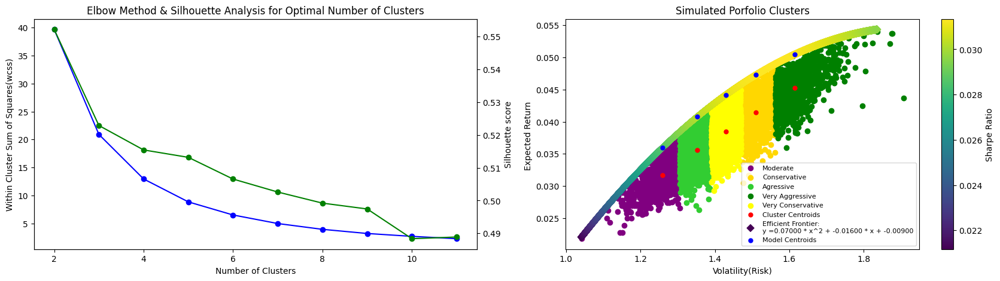

Silhouette Score: 0.9679732242655135

                           **********************************************************************
                                 Investment Profile Simulation And Portfolio Allocation 
                           **********************************************************************


                                    *****************************************************
                                      Risk Profile                : Moderate Investment 
                                      Simulated Risk              : 1.259
                                      Predicted Expected Return   : 0.036
                                      Sharpe Ratio                : 0.029
                                     *****************************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.005000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.024000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.028000,0.030000
BN,Brookfield Corporation,Financial Services,Asset Management,0.047000,0.046000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.047000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.057000,0.024000
ATS,ATS Corporation,Industrials,Industrial Products,0.066000,0.050000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.104000,0.014000
TVE,Tamarack Valley Energy Ltd.,Energy,Oil & Gas Exploration and Production,0.171000,0.000000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.180000,0.074000


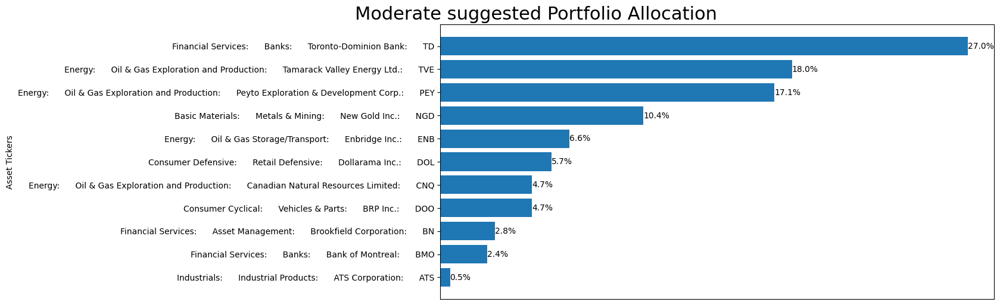

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

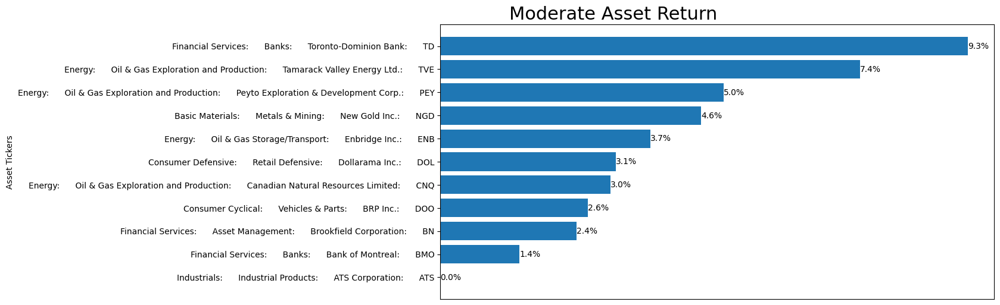

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *****************************************************
                                      Risk Profile                : Conservative Investment 
                                      Simulated Risk              : 1.51
                                      Predicted Expected Return   : 0.047
                                      Sharpe Ratio                : 0.031
                                     *****************************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
BN,Brookfield Corporation,Financial Services,Asset Management,0.004000,0.046000
ATS,ATS Corporation,Industrials,Industrial Products,0.012000,0.050000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.041000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.066000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.070000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.086000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.094000,0.024000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.111000,0.074000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.135000,0.014000
CNQ,Canadian Natural Resources Limited,Energy,Oil & Gas Exploration and Production,0.189000,0.093000


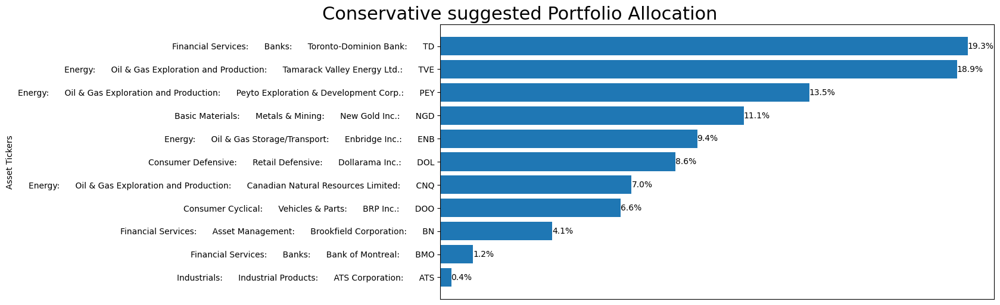

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

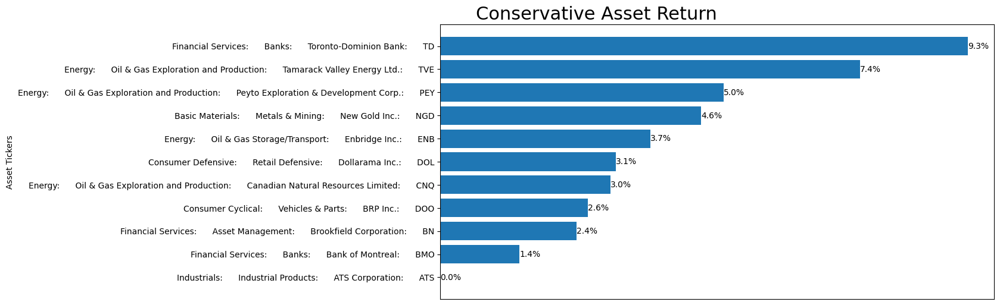

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *****************************************************
                                      Risk Profile                : Agressive Investment 
                                      Simulated Risk              : 1.353
                                      Predicted Expected Return   : 0.041
                                      Sharpe Ratio                : 0.03
                                     *****************************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.018000,0.037000
BN,Brookfield Corporation,Financial Services,Asset Management,0.022000,0.046000
ATS,ATS Corporation,Industrials,Industrial Products,0.040000,0.050000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.045000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.049000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.067000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.076000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.121000,0.014000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.147000,0.074000
TVE,Tamarack Valley Energy Ltd.,Energy,Oil & Gas Exploration and Production,0.183000,0.000000


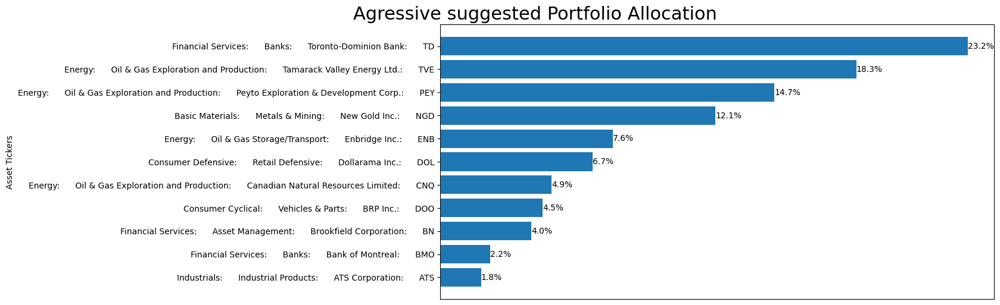

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

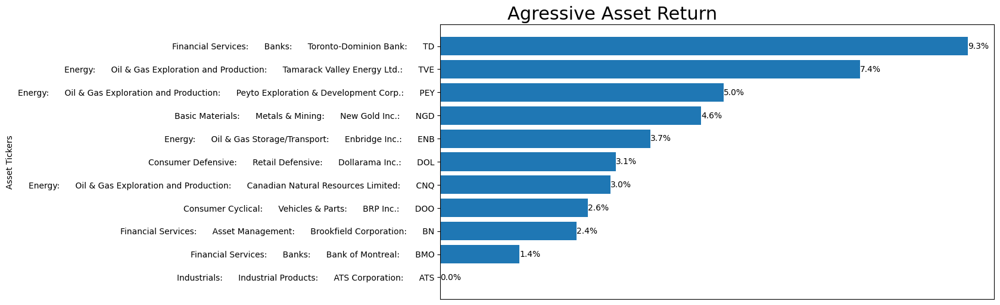

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *****************************************************
                                      Risk Profile                : Very Aggressive Investment 
                                      Simulated Risk              : 1.615
                                      Predicted Expected Return   : 0.05
                                      Sharpe Ratio                : 0.031
                                     *****************************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
ATS,ATS Corporation,Industrials,Industrial Products,0.000000,0.050000
BN,Brookfield Corporation,Financial Services,Asset Management,0.015000,0.046000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.050000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.073000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.077000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.093000,0.026000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.093000,0.074000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.100000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.139000,0.014000
CNQ,Canadian Natural Resources Limited,Energy,Oil & Gas Exploration and Production,0.166000,0.093000


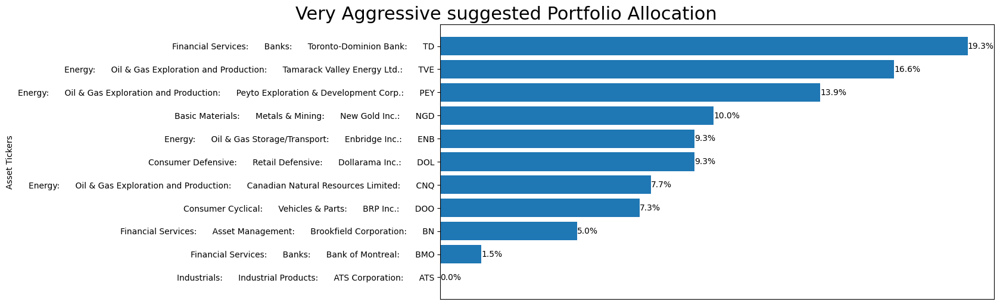

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

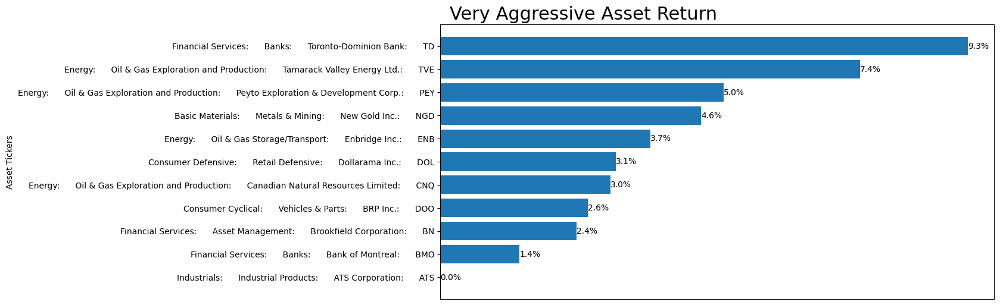

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'


                                    *****************************************************
                                      Risk Profile                : Very Conservative Investment 
                                      Simulated Risk              : 1.429
                                      Predicted Expected Return   : 0.044
                                      Sharpe Ratio                : 0.031
                                     *****************************************************



'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

Ticker,Company,Sector,Industry,Weight,Asset Espected Returns
BN,Brookfield Corporation,Financial Services,Asset Management,0.009000,0.046000
ATS,ATS Corporation,Industrials,Industrial Products,0.026000,0.050000
ENB,Enbridge Inc.,Energy,Oil & Gas Storage/Transport,0.030000,0.037000
PEY,Peyto Exploration & Development Corp.,Energy,Oil & Gas Exploration and Production,0.056000,0.031000
BMO,Bank of Montreal,Financial Services,Banks,0.060000,0.030000
DOL,Dollarama Inc.,Consumer Defensive,Retail Defensive,0.077000,0.026000
TD,Toronto-Dominion Bank,Financial Services,Banks,0.086000,0.024000
DOO,BRP Inc.,Consumer Cyclical,Vehicles & Parts,0.129000,0.014000
NGD,New Gold Inc.,Basic Materials,Metals & Mining,0.129000,0.074000
TVE,Tamarack Valley Energy Ltd.,Energy,Oil & Gas Exploration and Production,0.189000,0.000000


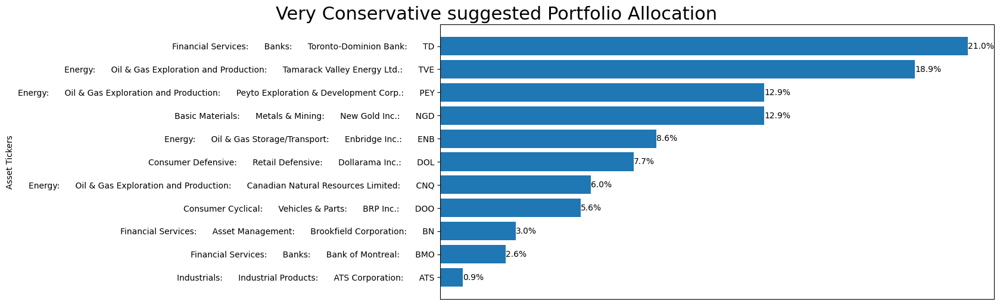

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

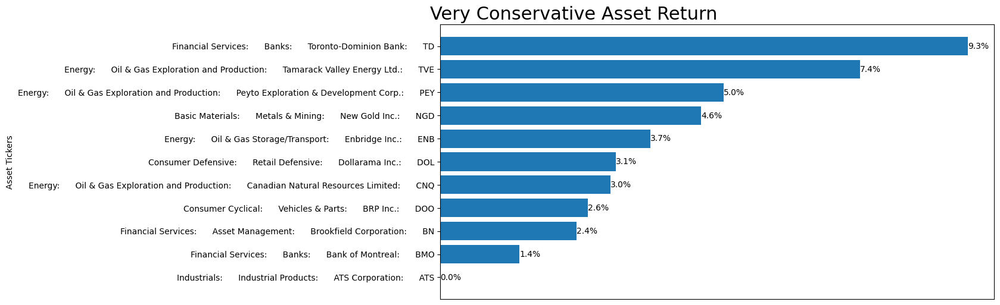

'y =0.07000 * x^2 + -0.01600 * x + -0.00900'

In [60]:
def implement_investement_profile_simulation(log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                             most_diversify_portfolio_assets_list, n_components):
    warnings.filterwarnings("ignore")
    fig, ax =plt.subplots(1,2,figsize=(21, 5))
    clipped_df = calculate_number_of_cluster(uncorrelated_weighted_portfolio_trails_simulation_df,n_components, ax[0])
    print('\n                                 *********************************************************************************\n'+
              '                                  Investement profile simulation  - Optimal Portfolio - Efficient Frontier Model \n'+
              '                                 *********************************************************************************\n')
    cluster_centers_df = implement_k_means_clusters(uncorrelated_weighted_portfolio_trails_simulation_df, clipped_df, fig, ax[1])
    plot_predicted_clusters_risk_profile_portfolio_allocation( log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                                              most_diversify_portfolio_assets_list, cluster_centers_df)

implement_investement_profile_simulation(log_returns, uncorrelated_weighted_portfolio_trails_simulation_df,
                                         most_diversify_portfolio_assets_list, 2)

## Portfolio Stress Testing

### Macroeconomics Key Performance Indicators(KPIs) Data Collection and Preprocessing

In this section, we will use  Statistic Canad's API stats-can to integrate the Canadian economic factors. We will then use Principal Components Analysis(PCA) technique to select the most importance economic factors.

In [61]:
warnings.filterwarnings("ignore")
#                      --------------------------------------------------------------------------------------------
#                        Trade Balance: Labour force characteristics by province, monthly, seasonally adjusted
#                      --------------------------------------------------------------------------------------------

def get_trade_balance_rate(reporting_year_period, frequency_date_column ):
        frequency = frequency_date_column[0].upper()
        df = sc.table_to_df("12-10-0011-01")
        df1 = df.loc[(df['REF_DATE'] >= reporting_year_period) & (df['Trade'] =='Trade Balance') &
            (df['Principal trading partners']  == 'All countries'), ['REF_DATE','Trade','Principal trading partners','VALUE']]
        df1[frequency_date_column] = df1['REF_DATE'].dt.to_period(frequency)

        trade_balance_df = df1[[frequency_date_column, 'VALUE']]
        trade_balance_df['Trade Balance Rate'] = trade_balance_df['VALUE'].pct_change() * 100

        trade_balance_rate_df= trade_balance_df.groupby(frequency_date_column).mean()
        #trade_balance_rate_df = trade_balance_rate_df.rename(columns={'VALUE': 'Unemployment rate'})
        trade_balance_rate_df['Trade Balance Rate'] = round(trade_balance_rate_df['Trade Balance Rate'],1)
        trade_balance_rate_df = trade_balance_rate_df[['Trade Balance Rate']]
        trade_balance_rate_df = trade_balance_rate_df.dropna()
        return trade_balance_rate_df



#                      --------------------------------------------------------------------------------------------
#                        unemployment rate: Labour force characteristics by province, monthly, seasonally adjusted
#                      --------------------------------------------------------------------------------------------

def get_unemployment_rate(reporting_year_period, frequency_date_column ):
        frequency = frequency_date_column[0].upper()
        df = sc.table_to_df("14-10-0287-03")
        df1 = df.loc[(df['REF_DATE'] >= reporting_year_period) & (df['Labour force characteristics'] =='Unemployment rate') &
            (df['UOM']  == 'Percentage'), ['REF_DATE','Labour force characteristics','UOM','VALUE']]
        df1[frequency_date_column] = df1['REF_DATE'].dt.to_period(frequency)

        unemployment_rate_df = df1[[frequency_date_column, 'VALUE']]
        unemployment_rate_df= unemployment_rate_df.groupby(frequency_date_column).mean()
        unemployment_rate_df = unemployment_rate_df.rename(columns={'VALUE': 'Unemployment rate'})
        unemployment_rate_df['Unemployment rate'] = round(unemployment_rate_df['Unemployment rate'],1)
        unemployment_rate_df = unemployment_rate_df.dropna()
        return unemployment_rate_df


#                      --------------------------------------------------------------------------------------------------
#                                Financial market statistics, last Wednesday unless otherwise stated, Bank of Canada
#                      --------------------------------------------------------------------------------------------------

def get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, col_value_name, rate_statement, frequency_date_column ):
    frequency = frequency_date_column[0].upper()

    df = sc.table_to_df("10-10-0122-01")
    df2 = df.loc[(df['REF_DATE'] >= reporting_year_period) & (df['UOM']  == 'Percent') &  (df['Rates'].str.contains(rate_statement)),
             ['REF_DATE','Rates','UOM','VALUE']]


    df2[frequency_date_column] = df2['REF_DATE'].dt.to_period(frequency)
    df2 = df2.dropna()
    goc_bonds_or_T_bill_df = df2[[frequency_date_column, 'VALUE']]
    #goc_bonds_or_T_bill_df['VALUE'] = round(goc_bonds_or_T_bill_df['VALUE'],1)
    goc_bonds_or_T_bill_df= goc_bonds_or_T_bill_df.groupby(frequency_date_column).mean()
    goc_bonds_or_T_bill_df= goc_bonds_or_T_bill_df.rename(columns={'VALUE': col_value_name})
    goc_bonds_or_T_bill_df[col_value_name] = round(goc_bonds_or_T_bill_df[col_value_name],1)

    return goc_bonds_or_T_bill_df

#                   ---------------------------------------------------------------------------------------------------------------------
#                            CPI Inflaction:The CPI measures the average change over time in the prices paid by urban consumers
#                            for a market basket of consumer goods and services,
#                            and it's a key indicator of inflation (ING Think) (Inflation Calculator).
#                   ---------------------------------------------------------------------------------------------------------------------


def get_CPI_inflaction_rate(reporting_year_period, frequency_date_column):
    frequency = frequency_date_column[0].upper()
    alternative_measures = 'Measure of core inflation based on a factor model, CPI-common (year-over-year percent change)'
    df = sc.table_to_df("18-10-0256-01")
    df2 = df.loc[(df['REF_DATE'] >= reporting_year_period) & (df['UOM']  == 'Percent') &
            (df['Alternative measures'] == alternative_measures),
           ['REF_DATE','Alternative measures','UOM','VALUE']]
    df2[frequency_date_column] = df2['REF_DATE'].dt.to_period(frequency)
    df2 = df2.dropna()
    CPI_inflaction_rate_df = df2[[frequency_date_column, 'VALUE']]
    CPI_inflaction_rate_df= CPI_inflaction_rate_df.groupby(frequency_date_column).mean()
    CPI_inflaction_rate_df= CPI_inflaction_rate_df.rename(columns={'VALUE': 'CPI Inflaction Rate'})
    CPI_inflaction_rate_df['CPI Inflaction Rate'] = round(CPI_inflaction_rate_df['CPI Inflaction Rate'],1)
    return CPI_inflaction_rate_df

#                                    -----------------------------------------------------------------------------------
                                                                   #morgage rate
#                                    -----------------------------------------------------------------------------------


def get_morgage_rate(reporting_year_period, frequency_date_column):
    frequency = frequency_date_column[0].upper()
    df = sc.table_to_df("34-10-0145-01")
    df1 = df.loc[(df['REF_DATE'] >= reporting_year_period), ['REF_DATE', 'UOM','VALUE']]
    df1[frequency_date_column] = df1['REF_DATE'].dt.to_period(frequency)

    get_morgage_rate_df = df1[[frequency_date_column, 'VALUE']]
    get_morgage_rate_df = get_morgage_rate_df.groupby(frequency_date_column).mean()
    get_morgage_rate_df = get_morgage_rate_df.rename(columns={'VALUE': 'Morgage Rate'})
    get_morgage_rate_df['Morgage Rate'] = round(get_morgage_rate_df['Morgage Rate'],1)
    get_morgage_rate_df = get_morgage_rate_df.dropna()
    return get_morgage_rate_df

#          -------------------------------------------------------------------------------------------------------------------------------------
#                                                                  prime rate
#                The prime interest rate is the percentage that U.S. commercial banks charge their most creditworthy customers for loans.
#                Like all loan rates, the prime interest rate is derived from the federal funds' overnight rate, set by the Federal Reserve at
#                meetings held eight times a year. The prime interest rate is the benchmark banks and other lenders
#                use when setting their interest rates for every category of loan from credit cards to car loans and mortgages.
#          -------------------------------------------------------------------------------------------------------------------------------------

def get_prime_rate(reporting_year_period, frequency_date_column):
    frequency = frequency_date_column[0].upper()
    df = sc.table_to_df("10-10-0145-01")
    df1 = df.loc[(df['REF_DATE'] >= reporting_year_period), ['REF_DATE', 'UOM','VALUE']]
    df1[frequency_date_column] = df1['REF_DATE'].dt.to_period(frequency)
    get_prime_rate_df = df1[[frequency_date_column, 'VALUE']]
    get_prime_rate_df.set_index(frequency_date_column, inplace=True)
    get_prime_rate_df = get_prime_rate_df.groupby(frequency_date_column).mean()
    get_prime_rate_df = get_prime_rate_df.rename(columns={'VALUE': 'Prime Rate'})
    get_prime_rate_df['Prime Rate'] = round(get_prime_rate_df['Prime Rate'],1)
    get_prime_rate_df = get_prime_rate_df.dropna()
    return get_prime_rate_df

#                       ----------------------------------------------------------------------------------------------------
#                                               House Price Index (house and land)
#                       ----------------------------------------------------------------------------------------------------

def get_house_price_index(reporting_year_period, frequency_date_column):
    frequency = frequency_date_column[0].upper()
    df = sc.table_to_df("18-10-0205-02")
    df1 = df.loc[(df['REF_DATE'] >= reporting_year_period) & (df['GEO'] =='Canada') &
                 (df['New housing price indexes'] =='Total (house and land)')
                 , ['REF_DATE','New housing price indexes', 'VALUE']]
    df1[frequency_date_column] = df1['REF_DATE'].dt.to_period(frequency)

    get_house_price_index_df = df1[[frequency_date_column, 'VALUE']]
    get_house_price_index_df.set_index(frequency_date_column, inplace=True)
    get_house_price_index_df = ((get_house_price_index_df / get_house_price_index_df.shift(1)) - 1)*100

    get_house_price_index_df= get_house_price_index_df.groupby(frequency_date_column).mean()
    get_house_price_index_df = get_house_price_index_df.rename(columns={'VALUE': 'House Price Index(house and land)'})
    get_house_price_index_df['House Price Index(house and land)'] = round(get_house_price_index_df[
        'House Price Index(house and land)'],1)
    get_house_price_index_df = get_house_price_index_df.dropna()
    return get_house_price_index_df.tail(60)

#                             -----------------------------------------------------------------------------------------
#                                                     Real GDP growth Seasonal adjustment
#                             -----------------------------------------------------------------------------------------

def get_Real_GDP_growth(reporting_year_period, frequency_date_column):
    frequency = frequency_date_column[0].upper()
    df = sc.table_to_df("36-10-0434-02")
    df1 = df.loc[(df['REF_DATE'] >= reporting_year_period) & (df['GEO'] =='Canada') &
                 (df['North American Industry Classification System (NAICS)'] =='All industries [T001]'),
                 ['REF_DATE','Seasonal adjustment', 'VALUE']]
    df1[frequency_date_column] = df1['REF_DATE'].dt.to_period(frequency)

    get_Real_GDP_growth_df = df1[[frequency_date_column, 'VALUE']]
    get_Real_GDP_growth_df.set_index(frequency_date_column, inplace=True)

    #get_Real_GDP_growth_df= get_Real_GDP_growth_df.groupby('MONTH_YEAR').sum()
    get_Real_GDP_growth_df= get_Real_GDP_growth_df.groupby(frequency_date_column).mean()
    get_Real_GDP_growth_df = ((get_Real_GDP_growth_df / get_Real_GDP_growth_df.shift(1)) - 1)*100
    get_Real_GDP_growth_df = get_Real_GDP_growth_df.rename(columns={'VALUE': 'Real GDP growth Seasonal adjustment'})
    get_Real_GDP_growth_df['Real GDP growth Seasonal adjustment'] = round(get_Real_GDP_growth_df[
        'Real GDP growth Seasonal adjustment'],1)
    get_Real_GDP_growth_df = get_Real_GDP_growth_df.dropna()
    return get_Real_GDP_growth_df.tail(60)

#                         ------------------------------------------------------------------------------------------------------
#                                                               Marcket Valatility


#                          oronto Stock Exchange statistics1: S&P/TSX 60 VIX Index (VIXI.TS)
#                          The S&P/TSX 60 is a market-capitalization-weighted index that tracks the performance of the 60 largest
#                          companies listed on the Toronto Stock Exchange (TSX). The S&P/TSX Composite, on the other hand,
#                          is a broader index that includes all common stocks and income trust units listed on the TSX

#                          The S&P/TSX Composite provides a more comprehensive view of the Canadian stock market.
#                          3It includes a wider range of companies, from small-cap to large-cap. This makes it a good
#                          choice for investors who want to diversify their portfolio across different sectors and market capitalizations.
#                          ://www.spglobal.com/spdji/en/indices/equity/sp-tsx-composite-index/#overview
#                          Toronto Stock Exchange statisticand  :S&P/TSX 60 VIX Index (VIXI.TS),
#                          S&P/TSX Venture Composite Index (^SPCDNX) and S&P/TSX Composite index (^GSPTSE)
#                          The S&P 500 index, or Standard & Poor’s 500, is a very important index that tracks
#                          the performance of the stocks of 500 large-cap companies in the U.S. The ticker symbol for the S&P 500 index is ^GSPC.
#                          The DJIA tracks the stock prices of 30 of the biggest American companies.
#                          The S&P 500 tracks 500 large-cap American stocks. Both offer a big-picture view of the state of the
#                          stock markets in general
#                          https://www.investopedia.com/ask/answers/difference-between-dow-jones-industrial-average-and-sp-500/#:
#                          ~:text=Key%20Takeaways,the%20stock%20markets%20in%20general.
#                        ---------------------------------------------------------------------------------------------------------------

def get_market_index_volatility(reporting_year_period, frequency_date_column, market_index_list = ['^GSPTSE', '^GSPC', '^DJI']):
    frequency = frequency_date_column[0].upper()

    start_date = reporting_year_period
    end_date = date.today()
    #index_yahoo_adj_close_price_data = yf.download(market_index_list, start_date, end_date, ['Adj Close'], period ='max')
    #market_adj_close_price_df = index_yahoo_adj_close_price_data['Adj Close']
    market_adj_close_price_df = create_adj_close_price_df(reporting_year_period, market_index_list)

    market_adj_close_price_log_return_df = np.log(market_adj_close_price_df/ market_adj_close_price_df.shift(1))
    # drop columns with all NaN's
    market_adj_close_price_log_return_df = market_adj_close_price_log_return_df.dropna(axis=0)

    #Market volatility

    market_volatility_df = market_adj_close_price_log_return_df.rolling(center=False,window= 252).std() * np.sqrt(252)
    for col in list(market_volatility_df.columns):
        market_volatility_df = market_volatility_df.rename(columns={col: 'Market '+col+' Volatility Index'})

    market_volatility_df = market_volatility_df.dropna(axis=0)

    market_volatility_df[frequency_date_column] = pd.to_datetime(market_volatility_df.index, format = '%m/%Y')
    market_volatility_df[frequency_date_column] = market_volatility_df[frequency_date_column].dt.to_period(frequency)

    #market_adj_close_price_log_return_frequency_df = market_volatility_df
    market_volatility_df.set_index(frequency_date_column, inplace=True)
    market_volatility_index_df = market_volatility_df.groupby(frequency_date_column).mean()
    market_volatility_index_df = round(market_volatility_index_df,1)
    market_volatility_index_df = market_volatility_index_df.dropna(axis=0)
    return market_volatility_index_df
    #if frequency == 'M' :
    #    return market_volatility_index_df.tail(60)
    #else:
    #    return market_volatility_index_df.tail(20)

#-------------------------------------------------------Governement of Canada Bonds average----------------------------------------------

def goc_bonds_average(reporting_year_period, frequency_date_column):
    goc_bonds_average_yield_1_3_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC Marketable Bonds Average Yield: 1-3 year',
        'Government of Canada marketable bonds, average yield: 1-3 year', frequency_date_column)
    goc_bonds_average_yield_5_10_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC Marketable Bonds Average Yield: 5-10 year',
        'Government of Canada marketable bonds, average yield: 5-10 year', frequency_date_column)
    goc_bonds_average_yield_3_5_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC Marketable Bonds Average Yield: 3-5 year',
        'Government of Canada marketable bonds, average yield: 3-5 year', frequency_date_column)
    goc_bonds_average_yield_over_10_years_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period,
                                                                                        'GOC Marketable Bonds Average Yield: over 10 years',
         'Government of Canada marketable bonds, average yield: over 10 years', frequency_date_column)

    goc_bonds_average_df = goc_bonds_average_yield_1_3_df.merge(goc_bonds_average_yield_5_10_df,
                                                                on= frequency_date_column, how='inner') \
                                                         .merge(goc_bonds_average_yield_3_5_df, on= frequency_date_column, how='inner') \
                                                         .merge(goc_bonds_average_yield_over_10_years_df, on= frequency_date_column, how='inner')
    return goc_bonds_average_df

#------------------------- Governement of Canada Benchmark Bonds Yield -------------------------------------------------------------------

def goc_benchmark_bonds_yield(reporting_year_period, frequency_date_column):
    goc_benchmark_bonds_yield_over_2_year_df = \
            get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC benchmark bond yields: 2 year',
                                            'Selected Government of Canada benchmark bond yields: 2 year' , frequency_date_column)
    goc_benchmark_bonds_yield_over_3_year_df = \
            get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC benchmark bond yields: 3 year',
                                                'Selected Government of Canada benchmark bond yields: 3 year', frequency_date_column)
    goc_benchmark_bonds_yield_over_5_year_df = \
            get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC benchmark bond yields: 5 year',
                                    'Selected Government of Canada benchmark bond yields: 5 year', frequency_date_column)
    goc_benchmark_bonds_yield_over_7_year_df = \
            get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC benchmark bond yields: 7 year',
                                    'Selected Government of Canada benchmark bond yields: 7 year', frequency_date_column)
    goc_benchmark_bonds_yield_over_10_years_df = \
            get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC benchmark bond yields: 10 years',
                                    'Selected Government of Canada benchmark bond yields: 10 years', frequency_date_column)
    goc_benchmark_bonds_yield_over_long_term_df = \
            get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'GOC benchmark bond yields: long term',
                                         'Selected Government of Canada benchmark bond yields: long term', frequency_date_column)
    goc_benchmark_bonds_yield_df = \
            goc_benchmark_bonds_yield_over_2_year_df.merge(goc_benchmark_bonds_yield_over_3_year_df,
                                                       on= frequency_date_column, how='inner') \
                                .merge(goc_benchmark_bonds_yield_over_5_year_df, on= frequency_date_column, how='inner') \
                                .merge(goc_benchmark_bonds_yield_over_7_year_df, on= frequency_date_column, how='inner') \
                                .merge(goc_benchmark_bonds_yield_over_10_years_df, on= frequency_date_column, how='inner') \
                                .merge(goc_benchmark_bonds_yield_over_long_term_df, on= frequency_date_column, how='inner')

    return goc_benchmark_bonds_yield_df

 #------------------------------------------------------------Governement of Canada Treasurt Bills --------------------------------------------
def Treasury_bills(reporting_year_period, frequency_date_column):

    Treasury_bills_1_month_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'Treasury bills: 1 month',
                                'Treasury bills: 1 month', frequency_date_column)
    Treasury_bills_2_month_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'Treasury bills: 2 month',
                                'Treasury bills: 2 month', frequency_date_column)
    Treasury_bills_3_month_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'Treasury bills: 3 month',
                                 'Treasury bills: 3 month', frequency_date_column)
    Treasury_bills_6_month_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'Treasury bills: 6 month',
                                'Treasury bills: 6 month', frequency_date_column)
    Treasury_bills_1_year_df = get_Government_of_Canada_bonds_or_T_bill(reporting_year_period, 'Treasury bills: 1 year',
                                'Treasury bills: 1 year', frequency_date_column)
    Treasury_bills_df = Treasury_bills_1_month_df.merge(Treasury_bills_2_month_df, on= frequency_date_column, how='inner') \
                                            .merge(Treasury_bills_3_month_df, on= frequency_date_column, how='inner') \
                                            .merge(Treasury_bills_6_month_df, on= frequency_date_column, how='inner') \
                                            .merge(Treasury_bills_1_year_df, on=frequency_date_column, how='inner')
    return Treasury_bills_df

#-----------------------------------------  Other Economic Factors ------------------------------------------------------------------

def other_economic_factors(reporting_year_period, frequency_date_column):
    unemployment_rate_df = get_unemployment_rate(reporting_year_period, frequency_date_column)
    CPI_inflaction_rate_df = get_CPI_inflaction_rate(reporting_year_period, frequency_date_column)
    get_morgage_rate_df = get_morgage_rate(reporting_year_period, frequency_date_column)
    get_prime_rate_df = get_prime_rate(reporting_year_period, frequency_date_column)
    get_house_price_index_df = get_house_price_index(reporting_year_period, frequency_date_column)
    get_Real_GDP_growth_df = get_Real_GDP_growth(reporting_year_period, frequency_date_column)
    market_index_volatility_df = get_market_index_volatility(reporting_year_period, frequency_date_column)
    trade_balance_rate_df = get_trade_balance_rate(reporting_year_period, frequency_date_column)

    other_economic_factors_df = CPI_inflaction_rate_df.merge(get_morgage_rate_df, on= frequency_date_column, how='inner') \
                                                    .merge(get_prime_rate_df, on= frequency_date_column, how='inner') \
                                                .merge(get_house_price_index_df, on= frequency_date_column, how='inner') \
                                                .merge(unemployment_rate_df, on= frequency_date_column, how='inner') \
                                                .merge(get_Real_GDP_growth_df, on= frequency_date_column, how='inner') \
                                                .merge(market_index_volatility_df, on= frequency_date_column, how='inner')

    return other_economic_factors_df

#-----------------------------------------------------------All the Economic Factors -----------------------------------------
def get_economic_factors_df(reporting_year_period, reporting_frequency):
     #set reporting frequency

    if reporting_frequency.capitalize() == 'Month' or reporting_frequency.capitalize() == 'Quarter':
        frequency_date_column = reporting_frequency.capitalize() + '_Year'
        #frequency = reporting_frequency[0].upper()

        goc_bonds_average_df = goc_bonds_average(reporting_year_period, frequency_date_column)
        goc_benchmark_bonds_yield_df = goc_benchmark_bonds_yield(reporting_year_period, frequency_date_column)
        Treasury_bills_df = Treasury_bills(reporting_year_period, frequency_date_column)
        other_economic_factors_df = other_economic_factors(reporting_year_period, frequency_date_column)

        economic_factors_df = goc_bonds_average_df.merge(goc_benchmark_bonds_yield_df, on= frequency_date_column, how='inner') \
                                            .merge(Treasury_bills_df, on= frequency_date_column, how='inner') \
                                            .merge(other_economic_factors_df, on= frequency_date_column, how='inner')


        return economic_factors_df
    else:
        return 'The reporting frequency should be alphanbetic, Month or Qurater'

#-------------------------------------------------------------Macroeconomics factors Plotting---------------------------------------

def annotate_bars(ax):# this function is generated by ChatGPT
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy()
        ax.annotate(f'{height:.1f}', (x + width/2, y + height/2), ha='center', va='center', fontsize=10, color='black')


def get_economic_factors_barplotting(goc_bonds_average_df, goc_benchmark_bonds_yield_df,Treasury_bills_df, other_economic_factors_df ):
    fig, axes =plt.subplots(4,1,figsize=(20, 35), constrained_layout=True)


    bar_width = 0.7

    bar0 = goc_bonds_average_df.plot(kind='bar', width=bar_width, stacked=True, ax = axes[0])
    bar0.set_title('Governement of Canada Bonds Average',color='black')
    bar0.legend(loc='best')
    annotate_bars(axes[0])

    bar1 = goc_benchmark_bonds_yield_df.plot(kind='bar', width=bar_width, stacked=True, ax = axes[1])
    bar1.set_title('Governement of Canada Benchmark Bonds Yield',color='black')
    bar1.legend(loc='best')
    annotate_bars(axes[1])

    bar2 = Treasury_bills_df.plot(kind='bar', width=bar_width, stacked=True, ax = axes[2])
    bar2.set_title("Governement of Canada Treasury Bills",color='black')
    bar2.legend(loc='best')
    annotate_bars(axes[2])

    bar3 = other_economic_factors_df.plot(kind='bar', width=bar_width, stacked=True, ax = axes[3])
    bar3.set_title('Governement of Canada Other Economic Factirs',color='black')
    bar3.legend(loc='best')
    annotate_bars(axes[3])


#----------------------------Principal Components Analysis(PCA) to select most importance economic factors ---------------------------------

def selecting_importent_economic_factors_treshold_method_PCA(df,threshold):

    return df[(df.abs() > threshold).any(axis=1)].index.to_list()

def setting_PCA_for_economic_factors(economic_factors_df):
    # economic indicators dataset
   # economic_factors_df = get_economic_factors_df(reporting_year_period, reporting_frequency)

    # Standardizing the data
    scaler = StandardScaler()
    scaled_data_df = scaler.fit_transform(economic_factors_df)

    # Applying PCA
    all_pca = PCA(n_components=None)  # Use all components to find the best number of important indicators
    all_principal_components = all_pca.fit_transform(scaled_data_df)

    # Explained variance
    explained_variance = all_pca.explained_variance_ratio_

    # Principal Component Loadings(coefficients)
    loadings_matrix = all_pca.components_

    # Create a DataFrame for loadings
    loadings_matrix_df = pd.DataFrame(loadings_matrix.T, columns=[f'PC{i+1}' for i in range(loadings_matrix.shape[0])],
                                      index=economic_factors_df.columns)
    return loadings_matrix_df, explained_variance

def get_num_components(explained_variance,cumulative_variance_treshold = 0.9):
    # Determine the number of components explaining the cumulative varience treshold of the variance
    cumulative_variance = explained_variance.cumsum()
    return  (cumulative_variance <= cumulative_variance_treshold).sum() + 1

def select_top_components_df(loadings_matrix_df, num_components, threshold_for_high_loadings = 0.5):
    # Select top components
    return loadings_matrix_df.iloc[:, :num_components]

def select_top_indicators_df(loadings_matrix_df, num_components, threshold_for_high_loadings = 0.5):
    # Select top components
    selected_components_df = loadings_matrix_df.iloc[:, :num_components]
    # Find indicators with high loadings
    return selected_components_df[(selected_components_df.abs() > threshold_for_high_loadings).any(axis=1)]


def plot_explained_variance_(economic_factors_df):

    loadings_matrix_df, explained_variance =  setting_PCA_for_economic_factors(economic_factors_df)

    # Print explained variance

    explained_variance_df = pd.DataFrame(explained_variance).T
    explained_variance_df.columns = loadings_matrix_df.columns
    display(explained_variance_df)


    # Plotting the explained variance
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='individual explained variance')
    plt.step(range(1, len(explained_variance) + 1), np.cumsum(explained_variance), where='mid', label='cumulative explained variance')
    plt.xlabel('Principal Components')
    plt.ylabel('Explained Variance Ratio')
    plt.title('Explained Variance by Principal Components')
    plt.legend(loc='best')
    plt.show()


def plotting_corr_matrix(economic_factors_matrix, title):

    g = sns.clustermap(economic_factors_matrix ,  method = 'complete', cmap   = 'RdBu', annot  = True, annot_kws = {'size': 15},figsize=(20, 15),
                      cbar_kws={"shrink": 0.6, "aspect": 15})

    plt.subplots_adjust(top=0.85)
    plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)
    plt.setp(g.ax_heatmap.get_yticklabels(), rotation=360)
    g.cax.set_position([1.02, 0.3, 0.03, 0.4])  # [left, bottom, width, height]
    g.cax.set_ylabel('Correlation Coefficient', rotation=270, labelpad=15)  # Rotate label
    g.fig.suptitle(title, y=0.9, fontsize=12)


def get_most_important_economic_factors_list(economic_factors_df,
                                             cumulative_variance_treshold = 1, threshold_for_highest_loadings = 0.5):

        #plot_explained_variance_(reporting_year_period, reporting_frequency)
        #plot_explained_variance_(economic_factors_df)
        loadings_matrix_df, explained_variance = setting_PCA_for_economic_factors(economic_factors_df)
        #print('\nloadings_matrix_df\n')
        #display(loadings_matrix_df)
        num_components = get_num_components(explained_variance,cumulative_variance_treshold)
        top_components_df = select_top_components_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
        #print('\ntop_components_df\n')
        #display(top_components_df)
        #print('\ntop_indicators_df\n')
        top_indicators_df = select_top_indicators_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
        #display(top_indicators_df)
        most_important_economic_factors_list = selecting_importent_economic_factors_treshold_method_PCA(top_indicators_df,
                                                                                 threshold_for_highest_loadings)

        return most_important_economic_factors_list


def plotting_most_important_economic_factors_list(economic_factors_df,
                                             cumulative_variance_treshold = 1, threshold_for_highest_loadings = 0.5):

        #plot_explained_variance_(reporting_year_period, reporting_frequency)
        plot_explained_variance_(economic_factors_df)
        loadings_matrix_df, explained_variance = setting_PCA_for_economic_factors(economic_factors_df)
        print('\nloadings_matrix_df\n')
        display(loadings_matrix_df)
        num_components = get_num_components(explained_variance,cumulative_variance_treshold)
        top_components_df = select_top_components_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
        print('\ntop_components_df\n')
        display(top_components_df)
        print('\ntop_indicators_df\n')
        top_indicators_df = select_top_indicators_df(loadings_matrix_df, num_components, threshold_for_highest_loadings)
        display(top_indicators_df)
        most_important_economic_factors_list = selecting_importent_economic_factors_treshold_method_PCA(top_indicators_df,
                                                                                 threshold_for_highest_loadings)



def get_most_important_economic_factors_df(economic_factors_df, most_important_economic_factors_list):
        return economic_factors_df[most_important_economic_factors_list]


def get_most_important_economic_factors_matrix(most_important_economic_factors_df):
    return  generate_correlation_matrix(most_important_economic_factors_df)

def plotting_most_important_economic_factors_corr_clustermap(most_important_economic_factors_matrix):

        #PCA couple with covarience matrice to select most important factors

        plotting_corr_matrix(most_important_economic_factors_matrix,'Most Important Economic Factors Correlation Matrix Cluster Map using PCA')


#----------------------------------------------------------------------Main Data Setting-------------------------------------------
reporting_year_period = start_date(365*5)
reporting_frequency = 'Quarter'

cumulative_variance_treshold = 1.0
threshold_for_highest_loadings = 0.5
correlation_coefficient_treshold = 0.3

#Economic Factors Data Frames
goc_bonds_average_df = goc_bonds_average(reporting_year_period, reporting_frequency)
goc_benchmark_bonds_yield_df = goc_benchmark_bonds_yield(reporting_year_period, reporting_frequency)
Treasury_bills_df = Treasury_bills(reporting_year_period, reporting_frequency)
other_economic_factors_df = other_economic_factors(reporting_year_period, reporting_frequency)
trade_balance_rate_df = get_trade_balance_rate(reporting_year_period, reporting_frequency)
economic_factors_df = get_economic_factors_df(reporting_year_period, reporting_frequency)

#All the economic factors correlation matrice
economic_factors_matrix =  generate_correlation_matrix(economic_factors_df)

#Principal Components Analysis(PCA) to select  Most Important Economic Factors
most_important_economic_factors_list = get_most_important_economic_factors_list(economic_factors_df,  cumulative_variance_treshold,
                                                                                threshold_for_highest_loadings)
most_important_economic_factors_df = get_most_important_economic_factors_df(economic_factors_df, most_important_economic_factors_list)
most_important_economic_factors_matrix = get_most_important_economic_factors_matrix(most_important_economic_factors_df)

#-------------------------------------------------Data Visualization------------------------------------------------------------------
def print_economic_factors_data_table():
    print('\n                             **********************************************************\n'+
             '                              All the Economic Factors Data Tables\n'+
              '                         *********************************************************\n')

    display(economic_factors_df)
    get_economic_factors_barplotting(goc_bonds_average_df, goc_benchmark_bonds_yield_df,Treasury_bills_df, other_economic_factors_df )


def print_economic_factors_data_corr_matrix():
    print('\n                             **********************************************************\n'+
             '                              All the Economic Factors Correlation Matrix\n'+
              '                         *********************************************************\n')

    display(economic_factors_matrix)
    plotting_corr_matrix(economic_factors_matrix, 'All the economic factors')
    #plotting_selected_assets_corr_mat_clustermap(economic_factors_matrix, 'All the economic factors')

def print_most_important_economic_factors():

    print('\n                        *****************************************************************************************\n'+
             '                               Principal Components Analysis(PCA) to select  Most Important Economic Factors \n'+
              '                          ****************************************************************************************\n')

    print('Principal Components Analysis(PCA) to select  Most Important Economic Factors \n')
    plotting_most_important_economic_factors_list(economic_factors_df, cumulative_variance_treshold, threshold_for_highest_loadings)
    print('\n most_important_economic_factors_df\n')
    display(most_important_economic_factors_df)
    print('\n most_important_economic_factors_matrix\n')
    display(most_important_economic_factors_matrix)
    plotting_corr_matrix(most_important_economic_factors_matrix, 'Most Important Economic Factors correlation Matrix - PCA Method')
    #plotting_selected_assets_corr_mat_clustermap(most_important_economic_factors_matrix, 'Most Important Economic Factors correlation Matrix - PCA Method',
    #                                             dendrogram = True)


10100122-eng.zip: 100%|██████████| 339k/339k [00:00<00:00, 363kB/s]


14100287-eng.zip: 100%|██████████| 57.7M/57.7M [00:20<00:00, 2.78MB/s]


18100256-eng.zip: 100%|██████████| 53.9k/53.9k [00:00<00:00, 636kB/s]


34100145-eng.zip: 100%|██████████| 6.38k/6.38k [00:00<00:00, 3.73MB/s]


10100145-eng.zip: 100%|██████████| 723k/723k [00:01<00:00, 495kB/s]


18100205-eng.zip: 100%|██████████| 339k/339k [00:01<00:00, 252kB/s]


36100434-eng.zip: 100%|██████████| 7.10M/7.10M [00:03<00:00, 2.00MB/s]
[*********************100%***********************]  3 of 3 completed


12100011-eng.zip: 100%|██████████| 1.09M/1.09M [00:00<00:00, 1.50MB/s]
[*********************100%***********************]  3 of 3 completed


#### Data Visualization


                             **********************************************************
                              All the Economic Factors Data Tables
                         *********************************************************



,GOC Marketable Bonds Average Yield: 1-3 year,GOC Marketable Bonds Average Yield: 5-10 year,GOC Marketable Bonds Average Yield: 3-5 year,GOC Marketable Bonds Average Yield: over 10 years,GOC benchmark bond yields: 2 year,GOC benchmark bond yields: 3 year,GOC benchmark bond yields: 5 year,GOC benchmark bond yields: 7 year,GOC benchmark bond yields: 10 years,GOC benchmark bond yields: long term,...,Treasury bills: 2 month,Treasury bills: 3 month,Treasury bills: 6 month,Treasury bills: 1 year,CPI Inflaction Rate,Morgage Rate,Prime Rate,House Price Index(house and land),Unemployment rate,Real GDP growth Seasonal adjustment
Quarter_Year,,,,,,,,,,,,,,,,,,,,,
2020Q1,1.2,1.1,1.1,1.3,1.1,1.1,1.1,1.1,1.1,1.4,...,1.3,1.2,1.2,1.2,2.0,4.0,1.8,0.2,4.6,-2.1
2020Q2,0.3,0.5,0.4,1.0,0.3,0.3,0.4,0.4,0.5,1.1,...,0.2,0.2,0.3,0.3,1.6,3.9,1.2,0.1,7.8,-10.6
2020Q3,0.2,0.5,0.3,1.0,0.3,0.3,0.4,0.4,0.6,1.1,...,0.2,0.1,0.2,0.2,1.4,3.6,1.1,0.7,5.9,8.9
2020Q4,0.2,0.6,0.4,1.1,0.2,0.3,0.4,0.5,0.7,1.2,...,0.1,0.1,0.1,0.2,1.7,3.4,1.0,0.5,5.2,2.1
2021Q1,0.2,1.0,0.5,1.7,0.2,0.3,0.7,0.9,1.2,1.8,...,0.1,0.1,0.1,0.1,1.7,3.3,1.1,1.2,5.5,1.2
2021Q2,0.3,1.3,0.8,1.9,0.4,0.5,0.9,1.2,1.5,2.0,...,0.1,0.1,0.2,0.2,2.4,3.3,1.2,1.3,5.1,-0.1
2021Q3,0.4,1.2,0.8,1.8,0.5,0.6,0.9,1.1,1.3,1.8,...,0.2,0.2,0.2,0.3,2.9,3.2,1.2,0.5,4.6,1.6
2021Q4,1.0,1.5,1.3,1.9,1.0,1.1,1.4,1.5,1.6,1.9,...,0.1,0.1,0.3,0.7,3.1,3.4,1.3,0.6,4.1,1.6
2022Q1,1.6,2.0,1.9,2.3,1.7,1.8,2.0,2.0,2.1,2.2,...,0.3,0.4,0.9,1.4,4.0,3.6,1.6,1.1,4.3,0.8


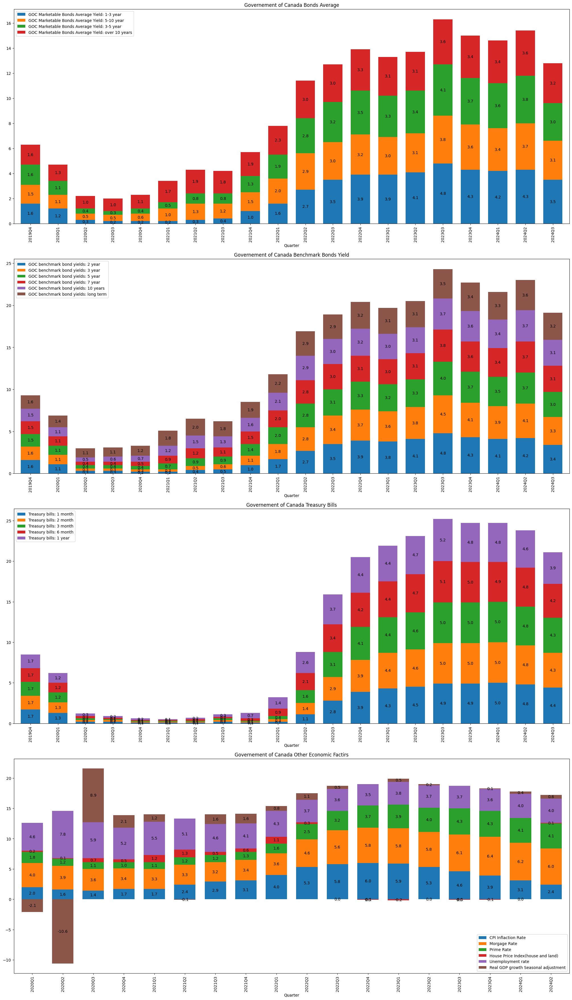

In [62]:
print_economic_factors_data_table()


                             **********************************************************
                              All the Economic Factors Correlation Matrix
                         *********************************************************



,GOC Marketable Bonds Average Yield: 1-3 year,GOC Marketable Bonds Average Yield: 5-10 year,GOC Marketable Bonds Average Yield: 3-5 year,GOC Marketable Bonds Average Yield: over 10 years,GOC benchmark bond yields: 2 year,GOC benchmark bond yields: 3 year,GOC benchmark bond yields: 5 year,GOC benchmark bond yields: 7 year,GOC benchmark bond yields: 10 years,GOC benchmark bond yields: long term,...,Treasury bills: 2 month,Treasury bills: 3 month,Treasury bills: 6 month,Treasury bills: 1 year,CPI Inflaction Rate,Morgage Rate,Prime Rate,House Price Index(house and land),Unemployment rate,Real GDP growth Seasonal adjustment
GOC Marketable Bonds Average Yield: 1-3 year,1.000000,0.976199,0.993209,0.951231,0.999462,0.998315,0.989338,0.977915,0.967320,0.952575,...,0.966132,0.973636,0.987148,0.996983,0.716492,0.972216,0.989560,-0.754208,-0.746375,-0.028914
GOC Marketable Bonds Average Yield: 5-10 year,0.976199,1.000000,0.992777,0.992448,0.978538,0.985369,0.995928,0.999459,0.998761,0.991043,...,0.913679,0.925168,0.945192,0.962425,0.729425,0.919161,0.952833,-0.637405,-0.802838,0.013242
GOC Marketable Bonds Average Yield: 3-5 year,0.993209,0.992777,1.000000,0.975615,0.994331,0.997760,0.998818,0.993509,0.987007,0.973534,...,0.936388,0.947076,0.966219,0.983328,0.746989,0.946284,0.971334,-0.704083,-0.785146,-0.014492
GOC Marketable Bonds Average Yield: over 10 years,0.951231,0.992448,0.975615,1.000000,0.954739,0.963174,0.980846,0.989952,0.995923,0.998236,...,0.885694,0.898744,0.918627,0.937023,0.736971,0.885361,0.927391,-0.574313,-0.805263,0.033213
GOC benchmark bond yields: 2 year,0.999462,0.978538,0.994331,0.954739,1.000000,0.998947,0.990991,0.979915,0.970160,0.955397,...,0.962590,0.970533,0.985163,0.996038,0.725109,0.969291,0.987723,-0.744715,-0.750504,-0.018320
GOC benchmark bond yields: 3 year,0.998315,0.985369,0.997760,0.963174,0.998947,1.000000,0.995408,0.986585,0.977878,0.962796,...,0.953059,0.962051,0.978696,0.992004,0.731092,0.961839,0.982265,-0.731009,-0.765741,-0.011587
GOC benchmark bond yields: 5 year,0.989338,0.995928,0.998818,0.980846,0.990991,0.995408,1.000000,0.996909,0.991605,0.978755,...,0.929439,0.940004,0.960019,0.977644,0.742634,0.937414,0.966160,-0.679107,-0.793680,0.001271
GOC benchmark bond yields: 7 year,0.977915,0.999459,0.993509,0.989952,0.979915,0.986585,0.996909,1.000000,0.997936,0.988589,...,0.915759,0.926639,0.946566,0.963724,0.725750,0.919783,0.954083,-0.639198,-0.806113,0.011319
GOC benchmark bond yields: 10 years,0.967320,0.998761,0.987007,0.995923,0.970160,0.977878,0.991605,0.997936,1.000000,0.994981,...,0.904050,0.915834,0.935894,0.953085,0.726471,0.906785,0.943930,-0.604003,-0.811841,0.034340
GOC benchmark bond yields: long term,0.952575,0.991043,0.973534,0.998236,0.955397,0.962796,0.978755,0.988589,0.994981,1.000000,...,0.898326,0.909881,0.926861,0.940557,0.716780,0.893346,0.935540,-0.576414,-0.794732,0.029166


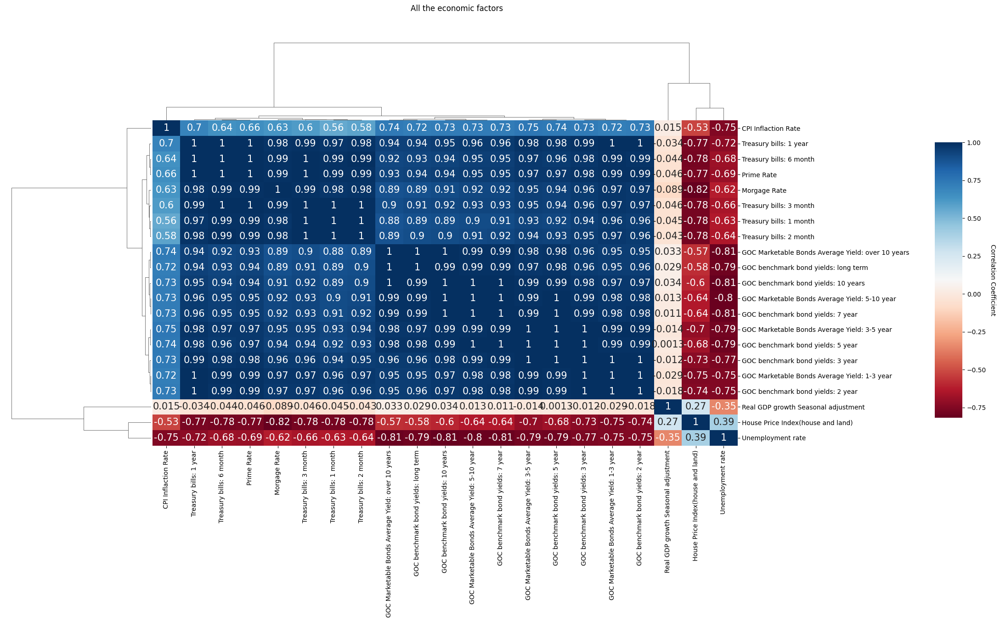

In [63]:
print_economic_factors_data_corr_matrix()


                        *****************************************************************************************
                               Principal Components Analysis(PCA) to select  Most Important Economic Factors 
                          ****************************************************************************************

Principal Components Analysis(PCA) to select  Most Important Economic Factors 



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,0.859385,0.068976,0.034244,0.023121,0.007244,0.004392,0.001835,0.000569,0.000106,0.000048,0.000029,0.000021,0.000012,0.000008,0.000006,0.000003,0.000002,3.262002e-34


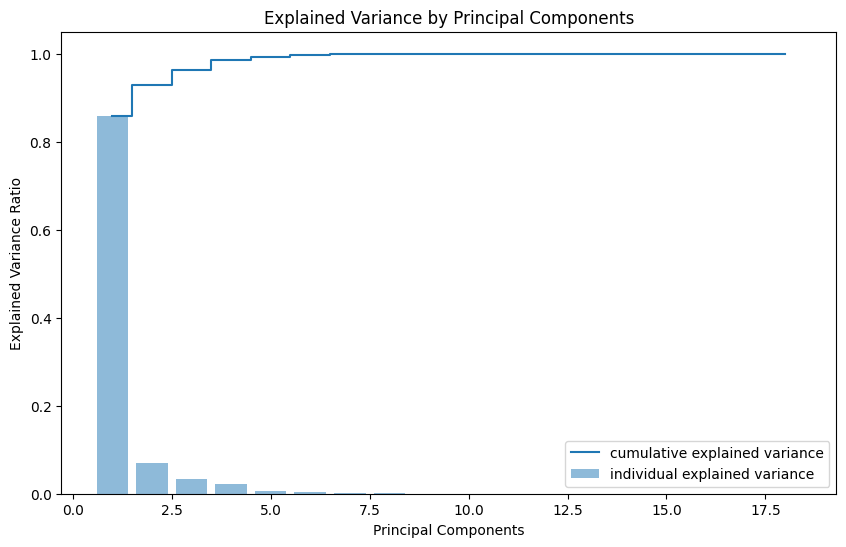


loadings_matrix_df



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
GOC Marketable Bonds Average Yield: 1-3 year,0.234761,0.025851,0.015168,-0.014701,-0.024033,0.056676,0.288464,-0.149588,0.121129,0.158516,0.534052,0.145396,0.242261,-0.083094,0.363733,-0.179724,-0.110114,0.172228
GOC Marketable Bonds Average Yield: 5-10 year,0.231543,-0.080275,-0.091129,0.159006,0.042909,0.215623,-0.034071,0.055682,-0.180912,0.067371,-0.386033,-0.134406,-0.026195,0.228578,0.504060,-0.234256,0.160452,-0.214649
GOC Marketable Bonds Average Yield: 3-5 year,0.234125,-0.030245,-0.071060,0.043805,0.007601,0.165875,0.219370,-0.088436,0.281735,-0.032288,0.155099,-0.351063,-0.682551,0.060191,0.171204,0.125287,0.058985,0.088914
GOC Marketable Bonds Average Yield: over 10 years,0.227159,-0.122243,-0.131472,0.225833,-0.046099,0.147008,-0.423921,-0.085516,0.453579,-0.189610,-0.182994,0.359416,-0.028075,0.086477,0.044846,-0.162397,-0.335968,0.201019
GOC benchmark bond yields: 2 year,0.234777,0.013394,0.007517,-0.012192,-0.061000,0.065873,0.295495,-0.172865,0.016856,-0.055789,-0.205639,-0.314905,0.556485,0.395766,-0.018932,0.112850,-0.174241,0.129533
GOC benchmark bond yields: 3 year,0.234755,-0.005666,-0.016479,0.007647,-0.023994,0.134910,0.287524,-0.101040,0.032474,0.150683,-0.052711,-0.184647,-0.025020,-0.274183,-0.390303,-0.383378,0.111620,0.029011
GOC benchmark bond yields: 5 year,0.233474,-0.051662,-0.074350,0.080496,0.010271,0.177463,0.223359,-0.086023,-0.187403,-0.327963,0.172964,0.466874,-0.067967,0.237321,-0.386801,-0.167428,0.210303,-0.061620
GOC benchmark bond yields: 7 year,0.231696,-0.078186,-0.086853,0.157673,0.074910,0.191474,0.062656,0.016148,-0.335393,-0.339167,0.008480,0.025099,0.090163,-0.592984,0.185208,0.236752,-0.250922,-0.276063
GOC benchmark bond yields: 10 years,0.230032,-0.107101,-0.093847,0.195990,0.026914,0.165615,-0.109496,0.145184,-0.121300,0.018535,-0.222578,-0.134877,0.019849,-0.045335,-0.294679,0.285943,0.284690,0.297126
GOC benchmark bond yields: long term,0.227627,-0.108533,-0.097674,0.247894,-0.043907,0.070241,-0.511445,-0.022443,-0.046245,0.368701,0.472842,-0.222127,0.183141,0.018854,-0.140433,0.083412,0.104094,-0.131322



top_components_df



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
GOC Marketable Bonds Average Yield: 1-3 year,0.234761,0.025851,0.015168,-0.014701,-0.024033,0.056676,0.288464,-0.149588,0.121129,0.158516,0.534052,0.145396,0.242261,-0.083094,0.363733,-0.179724,-0.110114,0.172228
GOC Marketable Bonds Average Yield: 5-10 year,0.231543,-0.080275,-0.091129,0.159006,0.042909,0.215623,-0.034071,0.055682,-0.180912,0.067371,-0.386033,-0.134406,-0.026195,0.228578,0.504060,-0.234256,0.160452,-0.214649
GOC Marketable Bonds Average Yield: 3-5 year,0.234125,-0.030245,-0.071060,0.043805,0.007601,0.165875,0.219370,-0.088436,0.281735,-0.032288,0.155099,-0.351063,-0.682551,0.060191,0.171204,0.125287,0.058985,0.088914
GOC Marketable Bonds Average Yield: over 10 years,0.227159,-0.122243,-0.131472,0.225833,-0.046099,0.147008,-0.423921,-0.085516,0.453579,-0.189610,-0.182994,0.359416,-0.028075,0.086477,0.044846,-0.162397,-0.335968,0.201019
GOC benchmark bond yields: 2 year,0.234777,0.013394,0.007517,-0.012192,-0.061000,0.065873,0.295495,-0.172865,0.016856,-0.055789,-0.205639,-0.314905,0.556485,0.395766,-0.018932,0.112850,-0.174241,0.129533
GOC benchmark bond yields: 3 year,0.234755,-0.005666,-0.016479,0.007647,-0.023994,0.134910,0.287524,-0.101040,0.032474,0.150683,-0.052711,-0.184647,-0.025020,-0.274183,-0.390303,-0.383378,0.111620,0.029011
GOC benchmark bond yields: 5 year,0.233474,-0.051662,-0.074350,0.080496,0.010271,0.177463,0.223359,-0.086023,-0.187403,-0.327963,0.172964,0.466874,-0.067967,0.237321,-0.386801,-0.167428,0.210303,-0.061620
GOC benchmark bond yields: 7 year,0.231696,-0.078186,-0.086853,0.157673,0.074910,0.191474,0.062656,0.016148,-0.335393,-0.339167,0.008480,0.025099,0.090163,-0.592984,0.185208,0.236752,-0.250922,-0.276063
GOC benchmark bond yields: 10 years,0.230032,-0.107101,-0.093847,0.195990,0.026914,0.165615,-0.109496,0.145184,-0.121300,0.018535,-0.222578,-0.134877,0.019849,-0.045335,-0.294679,0.285943,0.284690,0.297126
GOC benchmark bond yields: long term,0.227627,-0.108533,-0.097674,0.247894,-0.043907,0.070241,-0.511445,-0.022443,-0.046245,0.368701,0.472842,-0.222127,0.183141,0.018854,-0.140433,0.083412,0.104094,-0.131322



top_indicators_df



,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
GOC Marketable Bonds Average Yield: 1-3 year,0.234761,0.025851,0.015168,-0.014701,-0.024033,0.056676,0.288464,-0.149588,0.121129,0.158516,0.534052,0.145396,0.242261,-0.083094,0.363733,-0.179724,-0.110114,0.172228
GOC Marketable Bonds Average Yield: 5-10 year,0.231543,-0.080275,-0.091129,0.159006,0.042909,0.215623,-0.034071,0.055682,-0.180912,0.067371,-0.386033,-0.134406,-0.026195,0.228578,0.504060,-0.234256,0.160452,-0.214649
GOC Marketable Bonds Average Yield: 3-5 year,0.234125,-0.030245,-0.071060,0.043805,0.007601,0.165875,0.219370,-0.088436,0.281735,-0.032288,0.155099,-0.351063,-0.682551,0.060191,0.171204,0.125287,0.058985,0.088914
GOC benchmark bond yields: 2 year,0.234777,0.013394,0.007517,-0.012192,-0.061000,0.065873,0.295495,-0.172865,0.016856,-0.055789,-0.205639,-0.314905,0.556485,0.395766,-0.018932,0.112850,-0.174241,0.129533
GOC benchmark bond yields: 7 year,0.231696,-0.078186,-0.086853,0.157673,0.074910,0.191474,0.062656,0.016148,-0.335393,-0.339167,0.008480,0.025099,0.090163,-0.592984,0.185208,0.236752,-0.250922,-0.276063
GOC benchmark bond yields: long term,0.227627,-0.108533,-0.097674,0.247894,-0.043907,0.070241,-0.511445,-0.022443,-0.046245,0.368701,0.472842,-0.222127,0.183141,0.018854,-0.140433,0.083412,0.104094,-0.131322
Treasury bills: 1 month,0.225300,0.129467,0.254958,0.014055,0.002464,-0.350005,-0.145110,-0.168068,0.098567,-0.516001,0.147603,-0.322074,-0.035481,0.137766,-0.138956,0.100303,-0.124590,-0.211728
Treasury bills: 2 month,0.227009,0.120801,0.233262,0.006302,-0.012533,-0.308309,-0.117211,-0.144570,-0.196083,-0.106953,-0.034165,0.137658,0.007320,-0.156599,0.267587,0.095676,0.384065,0.566353
Treasury bills: 1 year,0.234084,0.053301,0.062117,-0.039099,-0.081783,-0.074751,0.187465,-0.094334,0.371007,0.277454,-0.155980,0.354124,0.050085,-0.022823,0.000177,0.558452,0.199203,-0.358253
CPI Inflaction Rate,0.171505,-0.186820,-0.587599,-0.512969,-0.492742,-0.240444,-0.082306,-0.010738,-0.073925,-0.082518,-0.014052,-0.035625,-0.015329,-0.044702,0.027172,-0.011723,0.033411,-0.004649



 most_important_economic_factors_df



,GOC Marketable Bonds Average Yield: 1-3 year,GOC Marketable Bonds Average Yield: 5-10 year,GOC Marketable Bonds Average Yield: 3-5 year,GOC benchmark bond yields: 2 year,GOC benchmark bond yields: 7 year,GOC benchmark bond yields: long term,Treasury bills: 1 month,Treasury bills: 2 month,Treasury bills: 1 year,CPI Inflaction Rate,Morgage Rate,Prime Rate,House Price Index(house and land),Unemployment rate,Real GDP growth Seasonal adjustment
Quarter_Year,,,,,,,,,,,,,,,
2020Q1,1.2,1.1,1.1,1.1,1.1,1.4,1.3,1.3,1.2,2.0,4.0,1.8,0.2,4.6,-2.1
2020Q2,0.3,0.5,0.4,0.3,0.4,1.1,0.2,0.2,0.3,1.6,3.9,1.2,0.1,7.8,-10.6
2020Q3,0.2,0.5,0.3,0.3,0.4,1.1,0.2,0.2,0.2,1.4,3.6,1.1,0.7,5.9,8.9
2020Q4,0.2,0.6,0.4,0.2,0.5,1.2,0.1,0.1,0.2,1.7,3.4,1.0,0.5,5.2,2.1
2021Q1,0.2,1.0,0.5,0.2,0.9,1.8,0.1,0.1,0.1,1.7,3.3,1.1,1.2,5.5,1.2
2021Q2,0.3,1.3,0.8,0.4,1.2,2.0,0.1,0.1,0.2,2.4,3.3,1.2,1.3,5.1,-0.1
2021Q3,0.4,1.2,0.8,0.5,1.1,1.8,0.2,0.2,0.3,2.9,3.2,1.2,0.5,4.6,1.6
2021Q4,1.0,1.5,1.3,1.0,1.5,1.9,0.1,0.1,0.7,3.1,3.4,1.3,0.6,4.1,1.6
2022Q1,1.6,2.0,1.9,1.7,2.0,2.2,0.2,0.3,1.4,4.0,3.6,1.6,1.1,4.3,0.8



 most_important_economic_factors_matrix



,GOC Marketable Bonds Average Yield: 1-3 year,GOC Marketable Bonds Average Yield: 5-10 year,GOC Marketable Bonds Average Yield: 3-5 year,GOC benchmark bond yields: 2 year,GOC benchmark bond yields: 7 year,GOC benchmark bond yields: long term,Treasury bills: 1 month,Treasury bills: 2 month,Treasury bills: 1 year,CPI Inflaction Rate,Morgage Rate,Prime Rate,House Price Index(house and land),Unemployment rate,Real GDP growth Seasonal adjustment
GOC Marketable Bonds Average Yield: 1-3 year,1.000000,0.976199,0.993209,0.999462,0.977915,0.952575,0.958881,0.966132,0.996983,0.716492,0.972216,0.989560,-0.754208,-0.746375,-0.028914
GOC Marketable Bonds Average Yield: 5-10 year,0.976199,1.000000,0.992777,0.978538,0.999459,0.991043,0.903818,0.913679,0.962425,0.729425,0.919161,0.952833,-0.637405,-0.802838,0.013242
GOC Marketable Bonds Average Yield: 3-5 year,0.993209,0.992777,1.000000,0.994331,0.993509,0.973534,0.927301,0.936388,0.983328,0.746989,0.946284,0.971334,-0.704083,-0.785146,-0.014492
GOC benchmark bond yields: 2 year,0.999462,0.978538,0.994331,1.000000,0.979915,0.955397,0.955022,0.962590,0.996038,0.725109,0.969291,0.987723,-0.744715,-0.750504,-0.018320
GOC benchmark bond yields: 7 year,0.977915,0.999459,0.993509,0.979915,1.000000,0.988589,0.906120,0.915759,0.963724,0.725750,0.919783,0.954083,-0.639198,-0.806113,0.011319
GOC benchmark bond yields: long term,0.952575,0.991043,0.973534,0.955397,0.988589,1.000000,0.889460,0.898326,0.940557,0.716780,0.893346,0.935540,-0.576414,-0.794732,0.029166
Treasury bills: 1 month,0.958881,0.903818,0.927301,0.955022,0.906120,0.889460,1.000000,0.999360,0.974308,0.559161,0.978215,0.987231,-0.777282,-0.633458,-0.044898
Treasury bills: 2 month,0.966132,0.913679,0.936388,0.962590,0.915759,0.898326,0.999360,1.000000,0.980071,0.578013,0.981846,0.991599,-0.779603,-0.644867,-0.042988
Treasury bills: 1 year,0.996983,0.962425,0.983328,0.996038,0.963724,0.940557,0.974308,0.980071,1.000000,0.700715,0.982650,0.995893,-0.770753,-0.720879,-0.034239
CPI Inflaction Rate,0.716492,0.729425,0.746989,0.725109,0.725750,0.716780,0.559161,0.578013,0.700715,1.000000,0.625995,0.657098,-0.525074,-0.746266,0.014891


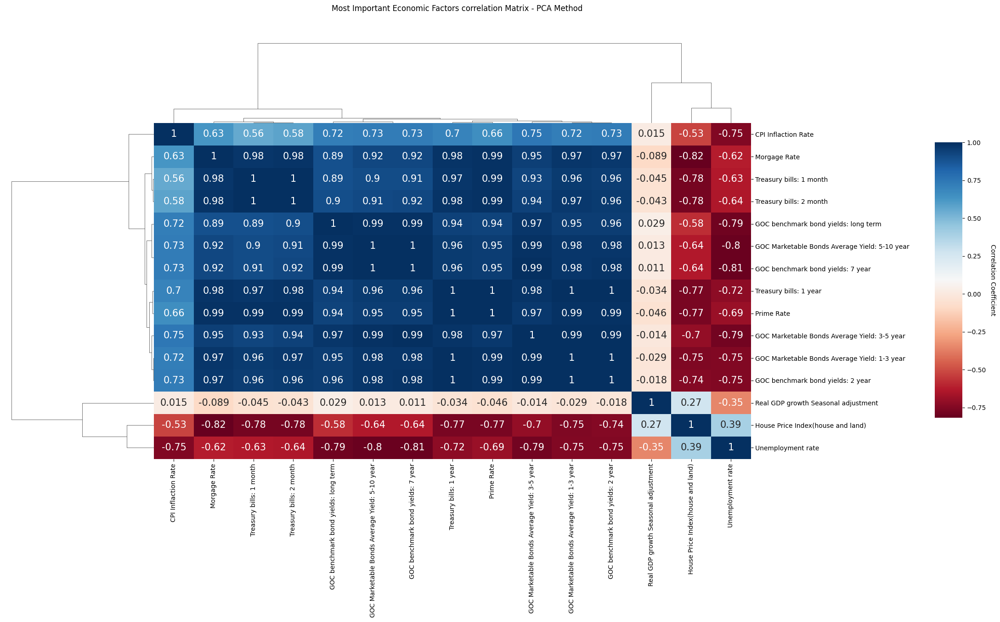

In [64]:
print_most_important_economic_factors()

##### Scenario Analysis
Macroeconomics KPI Best Case Scenario - Worst Case Scenario and Normal Case Scenario

In [65]:
#under implementation

##### Recalculate Portfolio Key Performence metricstrics
 recalculate Expected return, Standard deviation (risk), and Value-at-Risk (VaR).

In [66]:
#under implementation

##### Visualize the Stress Test Results
Visualizing the impact of the stress scenario on the portfolio can help in understanding the potential risks.

#### Decision Trees in Portfolio Stress Testing
In this section, we will use Decision Tree to model how different scenarios might cascade through the portfolio, affecting asset values, returns, and overall portfolio performance.


In [67]:
#under implementation

#####  Interpret the Results

 - Expected Return under Stress: Indicates how much the portfolio's return is expected to decrease under the stress scenario.
 - Portfolio Risk under Stress: Shows how much the risk (volatility) increases under the stress scenario.
 - VaR under Stress: Quantifies the potential loss in the portfolio's value at a specified confidence level under stressed conditions.

In [68]:
#under implementation